<a href="https://colab.research.google.com/github/Sviatyi/google-colab/blob/main/ml2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Лабораторна робота 2

Тиський Святослав

КН-312

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


In [ ]:
df = pd.read_csv("ionosphere_data.csv")

In [ ]:
!pip install fast_ml

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
df.info()
categories = np.unique(df.loc[:, "column_ai"])
df.loc[df["column_ai"] == "b", "column_ai"] = 0
df.loc[df["column_ai"] == "g", "column_ai"] = 1
df.loc[:, "column_a"] = df["column_a"].astype("float32")
df.loc[:, "column_b"] = df["column_b"].astype("float32")
df.loc[:, "column_ai"] = df["column_ai"].astype("int")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 351 entries, 0 to 350
Data columns (total 35 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   column_a   351 non-null    bool   
 1   column_b   351 non-null    bool   
 2   column_c   351 non-null    float64
 3   column_d   351 non-null    float64
 4   column_e   351 non-null    float64
 5   column_f   351 non-null    float64
 6   column_g   351 non-null    float64
 7   column_h   351 non-null    float64
 8   column_i   351 non-null    float64
 9   column_j   351 non-null    float64
 10  column_k   351 non-null    float64
 11  column_l   351 non-null    float64
 12  column_m   351 non-null    float64
 13  column_n   351 non-null    float64
 14  column_o   351 non-null    float64
 15  column_p   351 non-null    float64
 16  column_q   351 non-null    float64
 17  column_r   351 non-null    float64
 18  column_s   351 non-null    float64
 19  column_t   351 non-null    float64
 20  column_u  

In [ ]:
categories

array(['b', 'g'], dtype=object)

In [ ]:
from fast_ml.model_development import train_valid_test_split

X_train, y_train, X_valid, y_valid, X_test, y_test = train_valid_test_split(df, target = 'column_ai',
                                                                            train_size=0.7, valid_size=0.15, test_size=0.15)


In [ ]:
for name in X_train.columns[2:]:
    mean_ = np.mean(X_train.loc[:, name])
    std_ = np.std(X_train.loc[:, name])
    X_train.loc[:, name] = (X_train.loc[:, name] - mean_) / std_
    X_valid.loc[:, name] = (X_valid.loc[:, name] - mean_) / std_
    X_test.loc[:, name] = (X_test.loc[:, name] - mean_) / std_


In [ ]:
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

In [ ]:
def regression_Tree(X_train, y_train, X_valid, y_valid, X_test, y_test, depth=None):
    model = DecisionTreeClassifier(max_depth=depth)
    model.fit(X_train, y_train)
    print('Acuraccy for test values for Regression Tree with:', depth, 'depth :', 
          model.score(X_test, y_test) * 100, '%')
    print('Acuraccy for valid values for Regression Tree with:', depth, 'depth :', 
          model.score(X_valid, y_valid) * 100, '%')
    fig = plt.figure(figsize=(25, 20))
    tree.plot_tree(model,feature_names=X_train.columns,filled=True)

Acuraccy for test values for Regression Tree with: 2 depth : 90.56603773584906 %
Acuraccy for valid values for Regression Tree with: 2 depth : 88.67924528301887 %


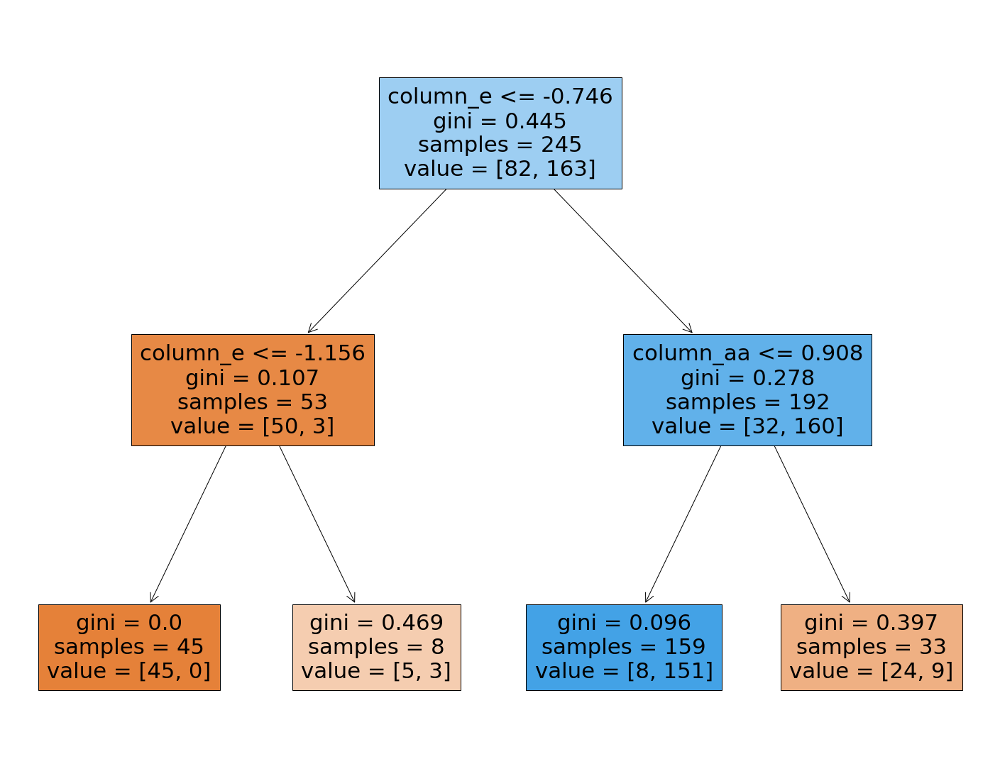

In [ ]:
regression_Tree(X_train, y_train, X_valid, y_valid, X_test, y_test, 2)

Acuraccy for test values for Regression Tree with: 4 depth : 84.90566037735849 %
Acuraccy for valid values for Regression Tree with: 4 depth : 88.67924528301887 %


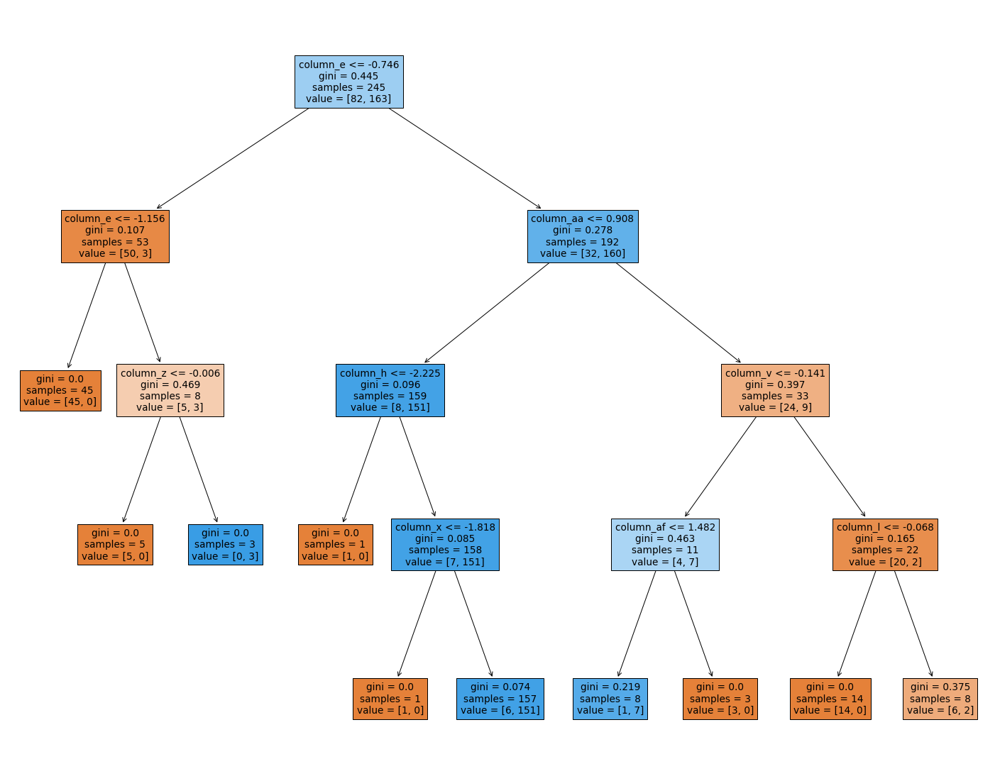

In [ ]:
regression_Tree(X_train, y_train, X_valid, y_valid, X_test, y_test, 4)

Acuraccy for test values for Regression Tree with: 6 depth : 83.01886792452831 %
Acuraccy for valid values for Regression Tree with: 6 depth : 90.56603773584906 %


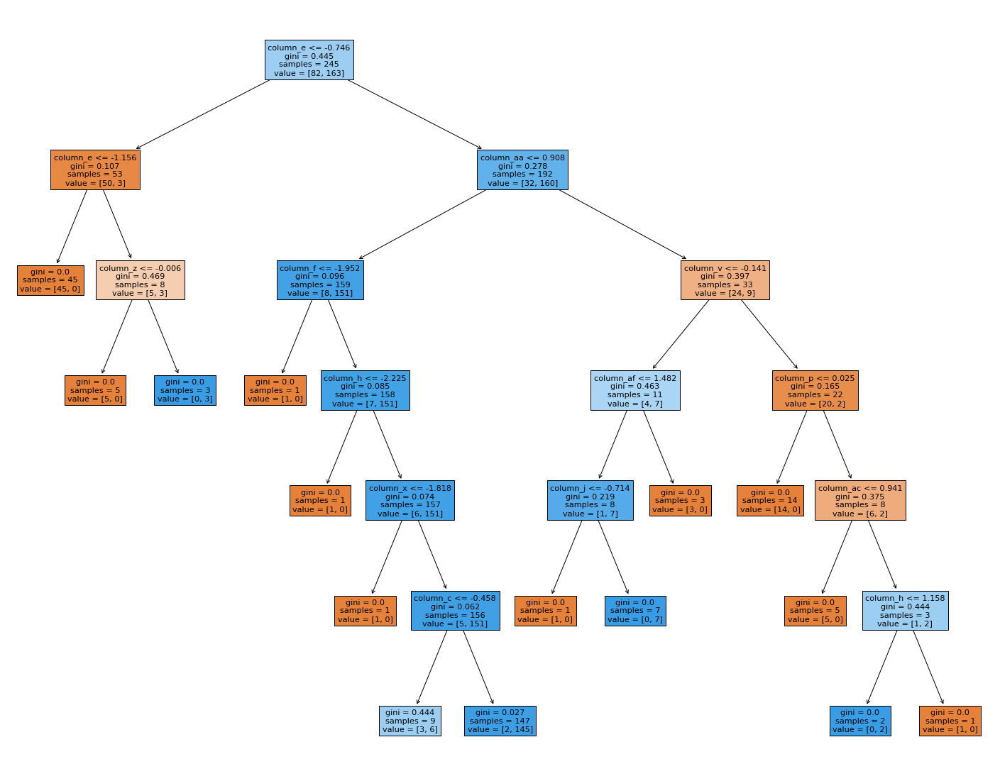

In [ ]:
regression_Tree(X_train, y_train, X_valid, y_valid, X_test, y_test, 6)

In [ ]:
X_noised = pd.DataFrame.copy(X_train)
cols = X_noised.columns[2:]
X_noised.loc[:, cols] = X_noised.loc[:, cols] + np.random.uniform(-0.1, 0.1, (len(X_noised.loc[:, cols[0]]), len(cols)))

Acuraccy for test values for Regression Tree with: 2 depth : 81.13207547169812 %
Acuraccy for valid values for Regression Tree with: 2 depth : 88.67924528301887 %


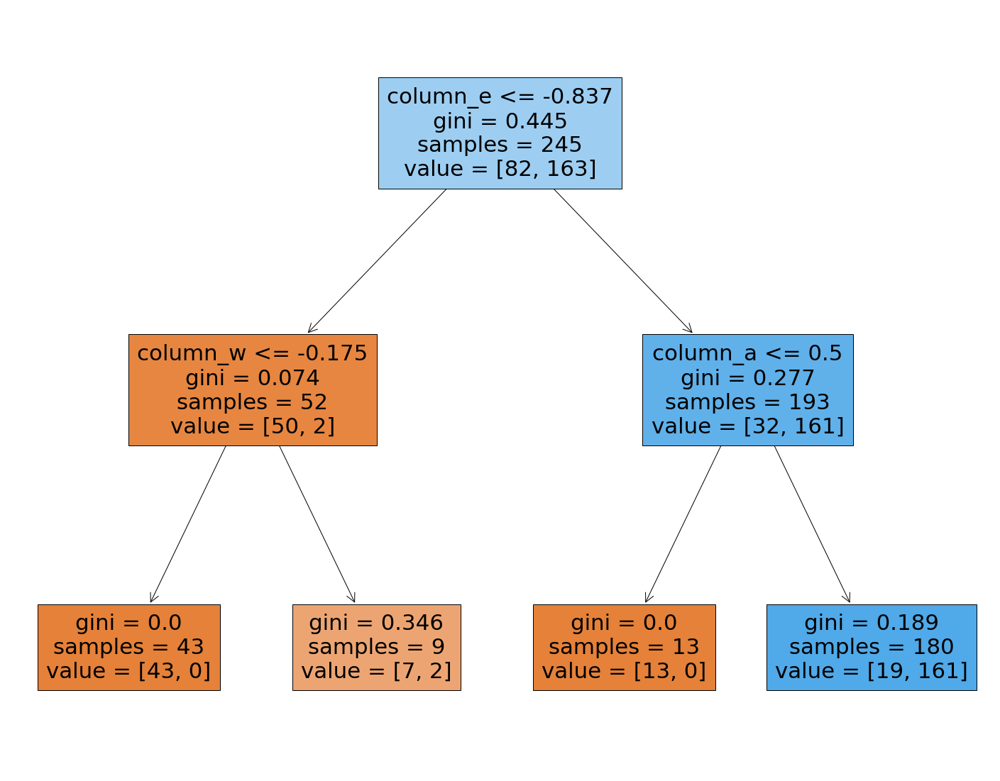

In [ ]:
regression_Tree(X_noised, y_train, X_valid, y_valid, X_test, y_test, 2)

Acuraccy for test values for Regression Tree with: 4 depth : 84.90566037735849 %
Acuraccy for valid values for Regression Tree with: 4 depth : 92.45283018867924 %


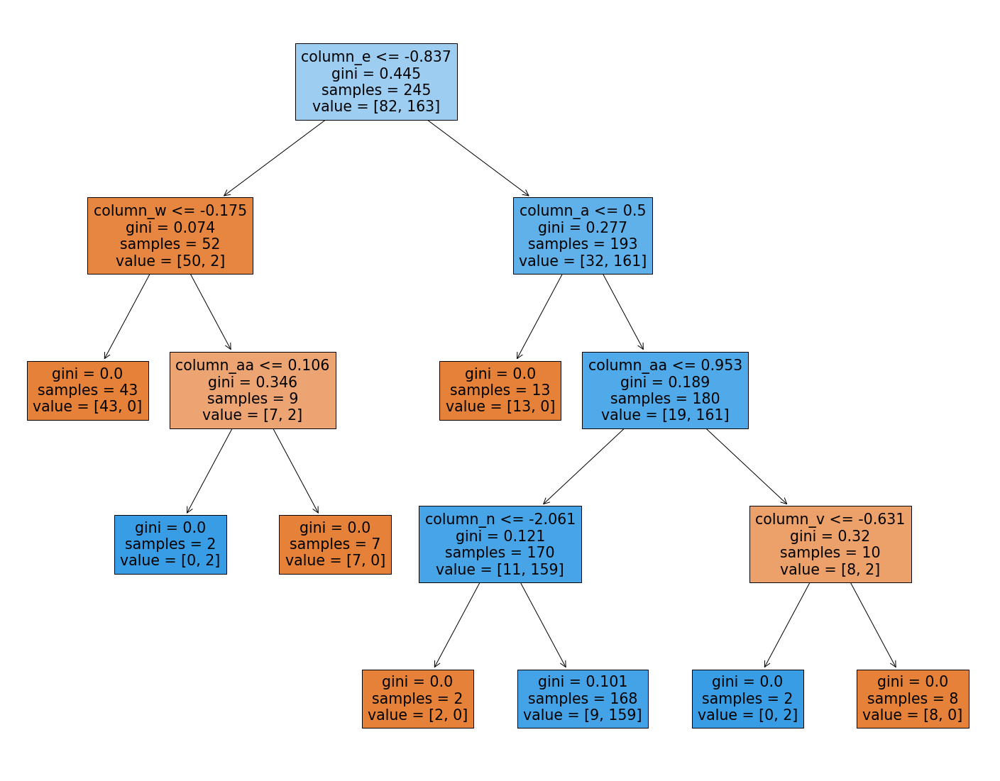

In [ ]:
regression_Tree(X_noised, y_train, X_valid, y_valid, X_test, y_test, 4)

Acuraccy for test values for Regression Tree with: 6 depth : 88.67924528301887 %
Acuraccy for valid values for Regression Tree with: 6 depth : 96.22641509433963 %


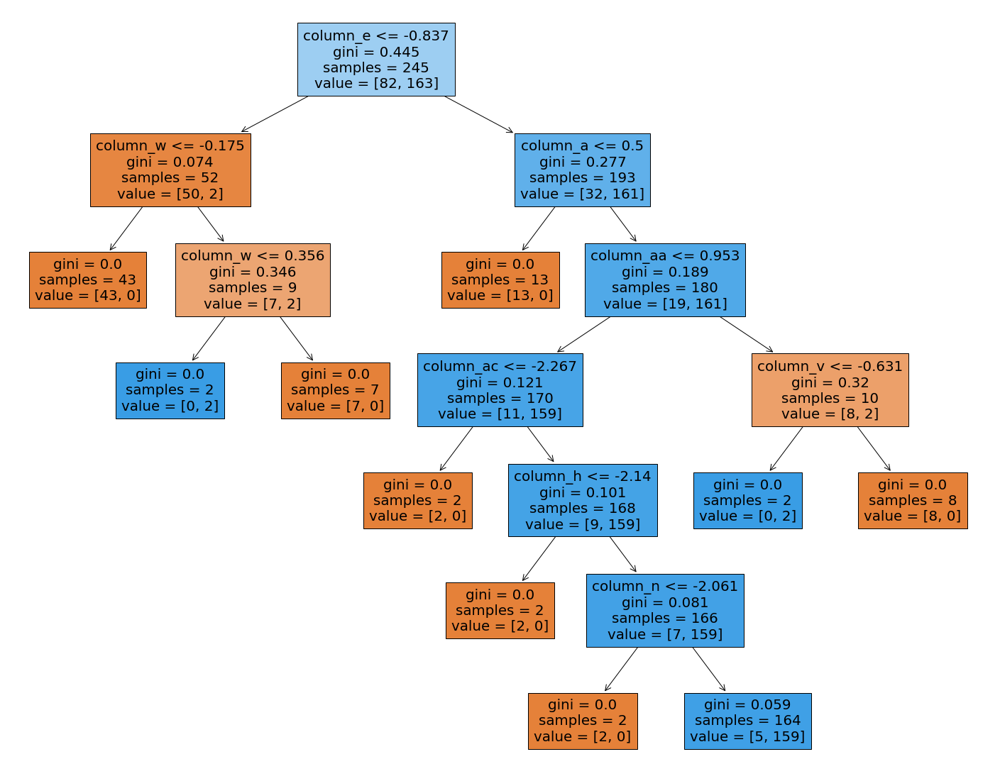

In [ ]:
regression_Tree(X_noised, y_train, X_valid, y_valid, X_test, y_test, 6)

In [ ]:
def draw_vector(v0, v1, ax=None):
    ax = ax or plt.gca()
    arrowprops = dict(arrowstyle='->', linewidth=2, shrinkA=0, shrinkB=0)
    ax.annotate('', v1, v0, arrowprops=arrowprops)


def plot_df(df, col_1, col_2, pca):
  explained_variance_ = [pca.explained_variance_[col_1[0]],
                                pca.explained_variance_[col_2[0]]]
  components_ = [pca.components_[col_1[0]][col_1[0]], 
                                pca.components_[col_2[0]][col_2[0]]]
  mean_ = [pca.mean_[col_1[0]],
                      pca.mean_[col_2[0]]]
  for length, vector in zip(explained_variance_,
                            components_):
        v = vector * 3 * np.sqrt(length)
        draw_vector(mean_, mean_ + v)
  plt.scatter(df[col_1[1]], df[col_2[1]], alpha=0.2)
  plt.xlabel(col_1[1])
  plt.ylabel(col_2[1])
  plt.axis('equal')
  plt.show()
  print(f'Explained variance = {explained_variance_}')
  print(f'Components = {components_}')
  print(f'Mean = {mean_}')

def plot_clasifier(df):
  fig = plt.figure(figsize = (8,8))
  ax = fig.add_subplot(1,1,1) 
  ax.set_xlabel('Component 1', fontsize = 15)
  ax.set_ylabel('Component 2', fontsize = 15)
  ax.set_title('2 component PCA', fontsize = 20)
  targets = [0,1]
  colors = ['r', 'g']
  for target, color in zip(targets,colors):
      indicesToKeep = df['column_ai'] == target
      ax.scatter(df.loc[indicesToKeep, 'component 1']
                , df.loc[indicesToKeep, 'component 2']
                , c = color
                , s = 50)
  ax.legend(targets)
  ax.grid()


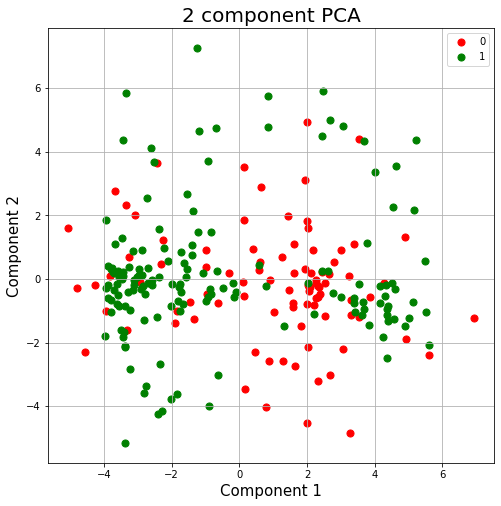

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(2)
components = pca.fit_transform(X_train)
principalDf = pd.DataFrame(data = [(a,b,c) for a,b,c in zip(
    [i[0] for i in components],
    [i[1] for i in components],
    y_train)], columns = ['component 1', 'component 2','column_ai'])
plot_clasifier(principalDf)

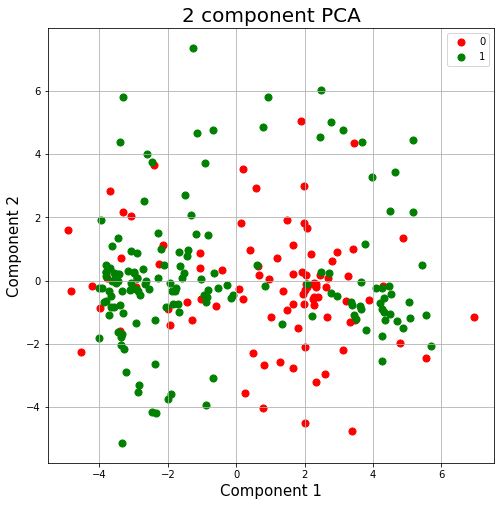

In [ ]:
pca_noise = PCA(2)
components_noised = pca.fit_transform(X_noised)
principalDf_noised = pd.DataFrame(data = [(a,b,c) for a,b,c in zip(
    [i[0] for i in components_noised],
    [i[1] for i in components_noised],
    y_train)], columns = ['component 1', 'component 2','column_ai'])
plot_clasifier(principalDf_noised)

[14, 19, 7, 31, 3, 23, 17, 13, 4, 27, 11, 29, 2, 9, 25, 21, 29, 15, 18, 24, 16, 5]


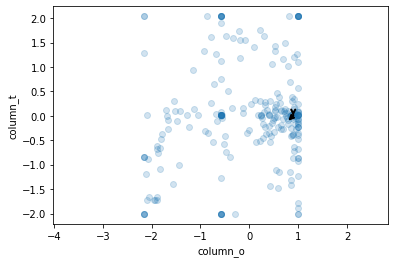

Explained variance = [9.045686775921455, 4.457470867946926]
Components = [-0.011141246153571102, -6.245004513516506e-17]
Mean = [0.8979591836734694, 0.0]


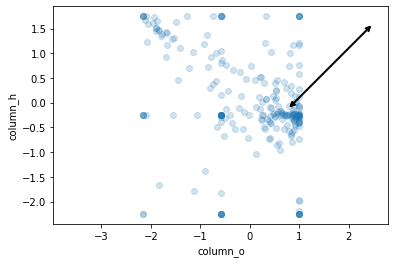

Explained variance = [9.045686775921455, 2.822350997931873]
Components = [-0.011141246153571102, 0.3102780597669046]
Mean = [0.8979591836734694, -2.1751308237554087e-16]


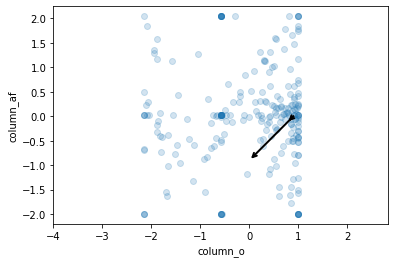

Explained variance = [9.045686775921455, 2.157580027592784]
Components = [-0.011141246153571102, -0.19653764888187195]
Mean = [0.8979591836734694, 1.4500872158369393e-17]


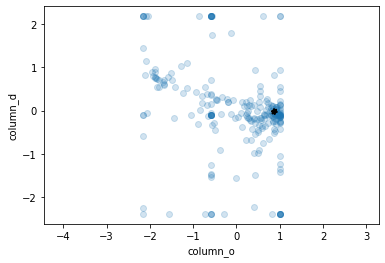

Explained variance = [9.045686775921455, 1.9798933033287716]
Components = [-0.011141246153571102, 0.012503558776654773]
Mean = [0.8979591836734694, -1.1600697726695514e-16]


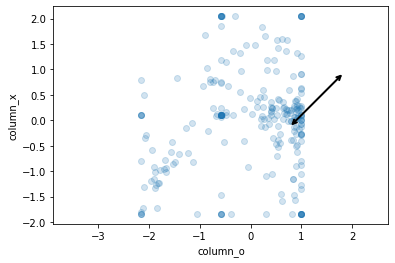

Explained variance = [9.045686775921455, 1.186305218642031]
Components = [-0.011141246153571102, 0.277000387808718]
Mean = [0.8979591836734694, 8.700523295021634e-17]


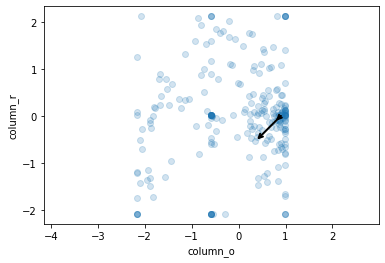

Explained variance = [9.045686775921455, 1.06450357671577]
Components = [-0.011141246153571102, -0.16270202413237378]
Mean = [0.8979591836734694, -3.9877398435515827e-16]


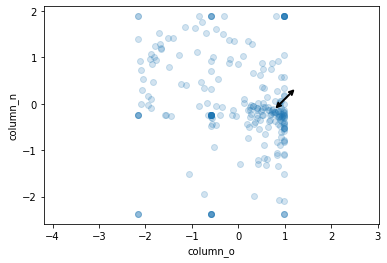

Explained variance = [9.045686775921455, 0.9663858659383975]
Components = [-0.011141246153571102, 0.10790050453517153]
Mean = [0.8979591836734694, 2.718913529694261e-17]


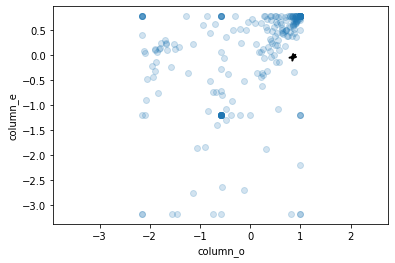

Explained variance = [9.045686775921455, 0.8223436463906109]
Components = [-0.011141246153571102, 0.0009323281055461127]
Mean = [0.8979591836734694, -3.8789833023638124e-16]


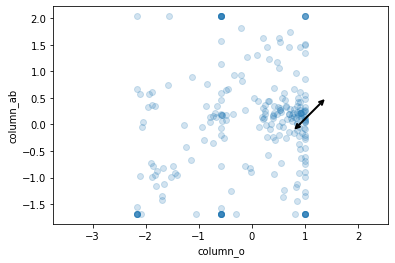

Explained variance = [9.045686775921455, 0.8106464691360841]
Components = [-0.011141246153571102, 0.17729576748331272]
Mean = [0.8979591836734694, -1.812609019796174e-18]


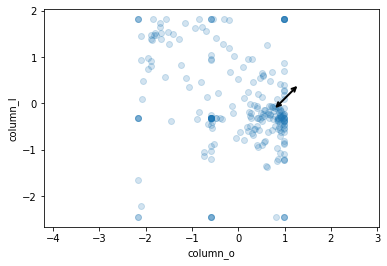

Explained variance = [9.045686775921455, 0.6904475095535513]
Components = [-0.011141246153571102, 0.15191473023488347]
Mean = [0.8979591836734694, -1.8851133805880208e-16]


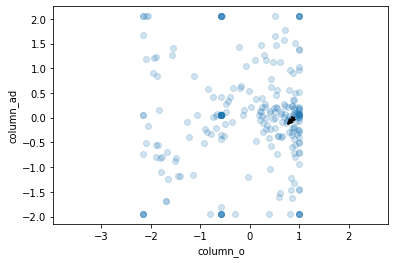

Explained variance = [9.045686775921455, 0.6571354092729098]
Components = [-0.011141246153571102, -0.06219276085082239]
Mean = [0.8979591836734694, -1.450087215836939e-16]


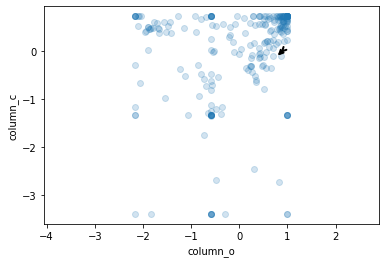

Explained variance = [9.045686775921455, 0.5650664430011808]
Components = [-0.011141246153571102, -0.01849375523188338]
Mean = [0.8979591836734694, -2.6101569885064907e-16]


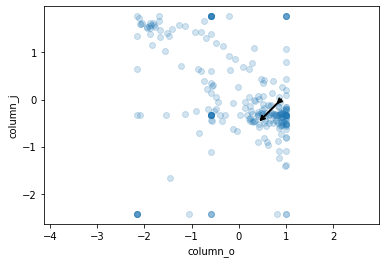

Explained variance = [9.045686775921455, 0.5330852327996964]
Components = [-0.011141246153571102, -0.21202851851721957]
Mean = [0.8979591836734694, 7.975479687103165e-17]


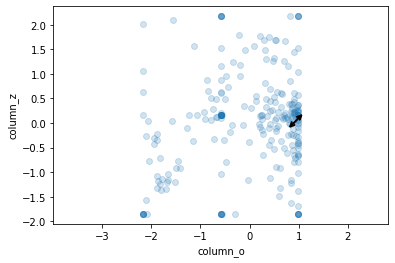

Explained variance = [9.045686775921455, 0.5101953831380778]
Components = [-0.011141246153571102, 0.08716929481142828]
Mean = [0.8979591836734694, -4.604026910282282e-16]


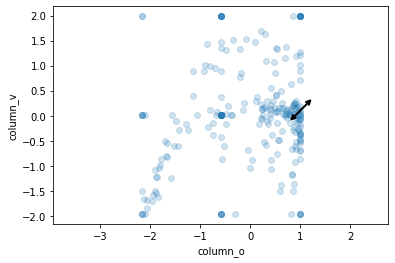

Explained variance = [9.045686775921455, 0.4770319942870226]
Components = [-0.011141246153571102, 0.16139635864988555]
Mean = [0.8979591836734694, -5.437827059388522e-17]


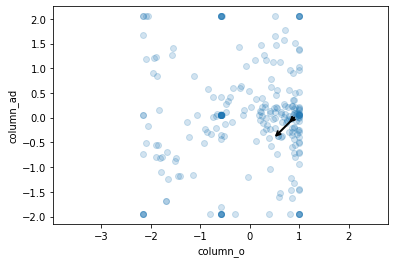

Explained variance = [9.045686775921455, 0.4185193951809043]
Components = [-0.011141246153571102, -0.201081312912407]
Mean = [0.8979591836734694, -3.7702267611760416e-16]


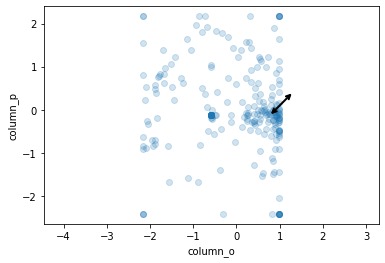

Explained variance = [9.045686775921455, 0.3926342387071242]
Components = [-0.011141246153571102, 0.20336865374115512]
Mean = [0.8979591836734694, 7.250436079184696e-18]


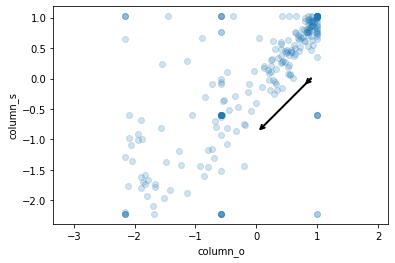

Explained variance = [9.045686775921455, 0.36064540906532044]
Components = [-0.011141246153571102, -0.4754902900511677]
Mean = [0.8979591836734694, 1.740104659004327e-16]


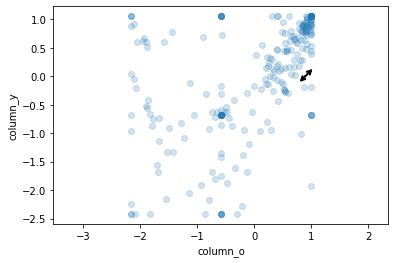

Explained variance = [9.045686775921455, 0.30848347466117204]
Components = [-0.011141246153571102, 0.07851416278657723]
Mean = [0.8979591836734694, 3.6252180395923476e-17]


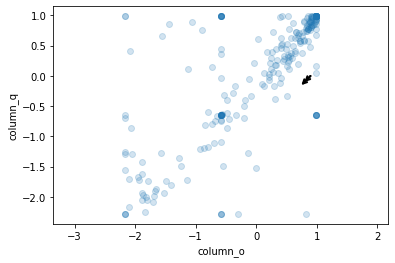

Explained variance = [9.045686775921455, 0.2788723726352035]
Components = [-0.011141246153571102, -0.0953943872992796]
Mean = [0.8979591836734694, 5.075305255429287e-17]


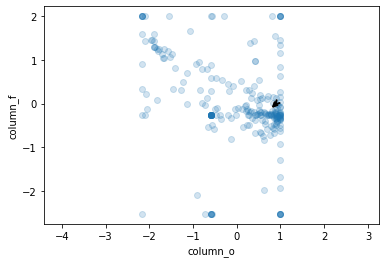

Explained variance = [9.045686775921455, 0.2589385263862628]
Components = [-0.011141246153571102, -0.03503640384300756]
Mean = [0.8979591836734694, 1.812609019796174e-18]


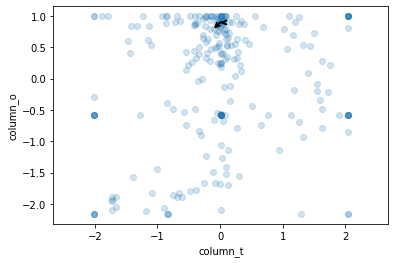

Explained variance = [4.457470867946926, 9.045686775921455]
Components = [-6.245004513516506e-17, -0.011141246153571102]
Mean = [0.0, 0.8979591836734694]


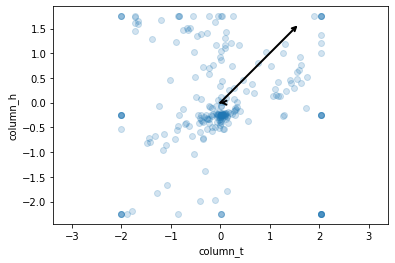

Explained variance = [4.457470867946926, 2.822350997931873]
Components = [-6.245004513516506e-17, 0.3102780597669046]
Mean = [0.0, -2.1751308237554087e-16]


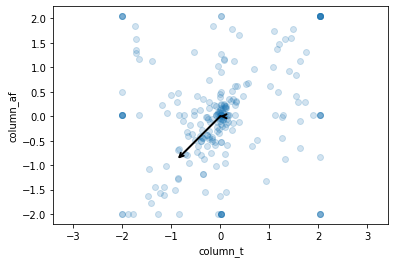

Explained variance = [4.457470867946926, 2.157580027592784]
Components = [-6.245004513516506e-17, -0.19653764888187195]
Mean = [0.0, 1.4500872158369393e-17]


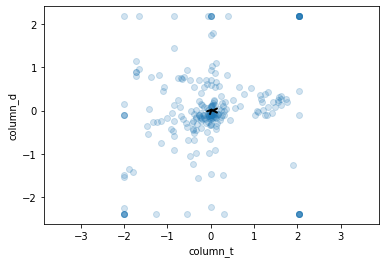

Explained variance = [4.457470867946926, 1.9798933033287716]
Components = [-6.245004513516506e-17, 0.012503558776654773]
Mean = [0.0, -1.1600697726695514e-16]


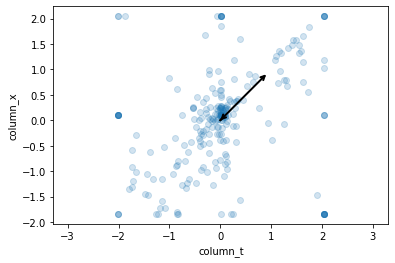

Explained variance = [4.457470867946926, 1.186305218642031]
Components = [-6.245004513516506e-17, 0.277000387808718]
Mean = [0.0, 8.700523295021634e-17]


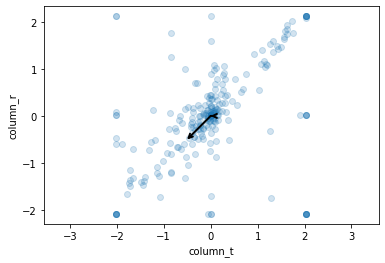

Explained variance = [4.457470867946926, 1.06450357671577]
Components = [-6.245004513516506e-17, -0.16270202413237378]
Mean = [0.0, -3.9877398435515827e-16]


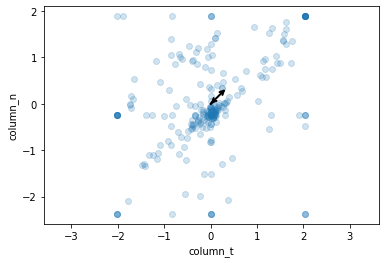

Explained variance = [4.457470867946926, 0.9663858659383975]
Components = [-6.245004513516506e-17, 0.10790050453517153]
Mean = [0.0, 2.718913529694261e-17]


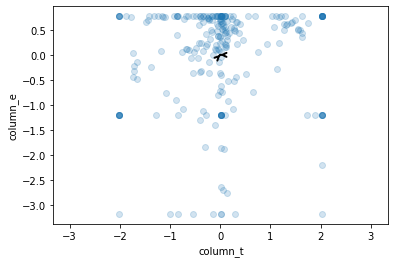

Explained variance = [4.457470867946926, 0.8223436463906109]
Components = [-6.245004513516506e-17, 0.0009323281055461127]
Mean = [0.0, -3.8789833023638124e-16]


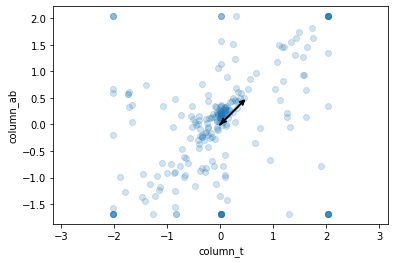

Explained variance = [4.457470867946926, 0.8106464691360841]
Components = [-6.245004513516506e-17, 0.17729576748331272]
Mean = [0.0, -1.812609019796174e-18]


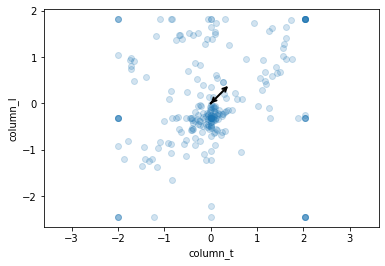

Explained variance = [4.457470867946926, 0.6904475095535513]
Components = [-6.245004513516506e-17, 0.15191473023488347]
Mean = [0.0, -1.8851133805880208e-16]


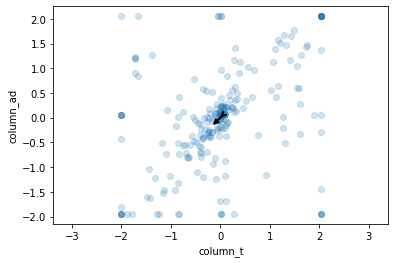

Explained variance = [4.457470867946926, 0.6571354092729098]
Components = [-6.245004513516506e-17, -0.06219276085082239]
Mean = [0.0, -1.450087215836939e-16]


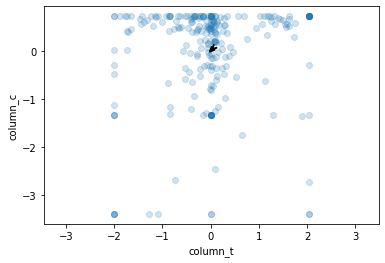

Explained variance = [4.457470867946926, 0.5650664430011808]
Components = [-6.245004513516506e-17, -0.01849375523188338]
Mean = [0.0, -2.6101569885064907e-16]


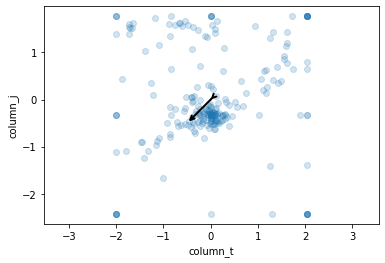

Explained variance = [4.457470867946926, 0.5330852327996964]
Components = [-6.245004513516506e-17, -0.21202851851721957]
Mean = [0.0, 7.975479687103165e-17]


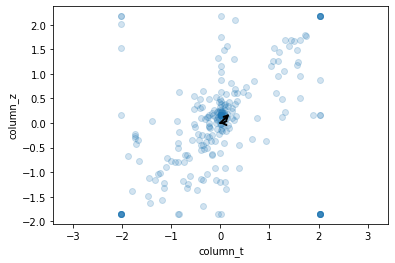

Explained variance = [4.457470867946926, 0.5101953831380778]
Components = [-6.245004513516506e-17, 0.08716929481142828]
Mean = [0.0, -4.604026910282282e-16]


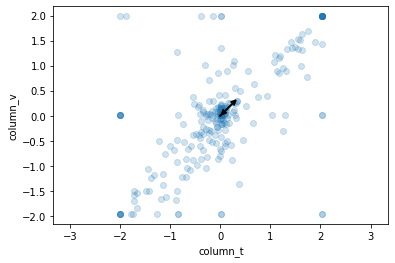

Explained variance = [4.457470867946926, 0.4770319942870226]
Components = [-6.245004513516506e-17, 0.16139635864988555]
Mean = [0.0, -5.437827059388522e-17]


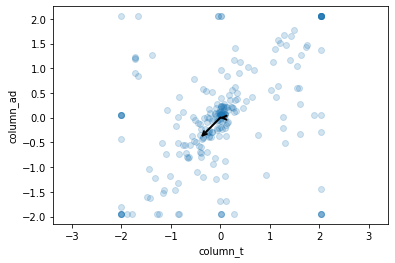

Explained variance = [4.457470867946926, 0.4185193951809043]
Components = [-6.245004513516506e-17, -0.201081312912407]
Mean = [0.0, -3.7702267611760416e-16]


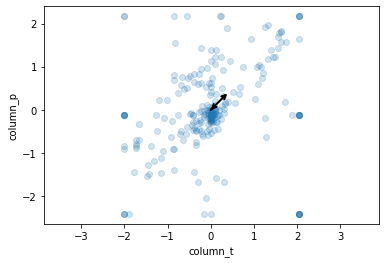

Explained variance = [4.457470867946926, 0.3926342387071242]
Components = [-6.245004513516506e-17, 0.20336865374115512]
Mean = [0.0, 7.250436079184696e-18]


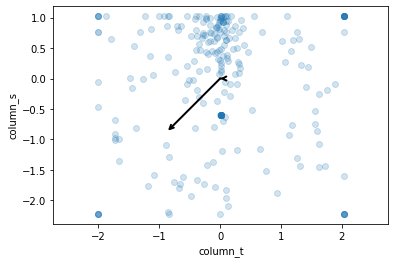

Explained variance = [4.457470867946926, 0.36064540906532044]
Components = [-6.245004513516506e-17, -0.4754902900511677]
Mean = [0.0, 1.740104659004327e-16]


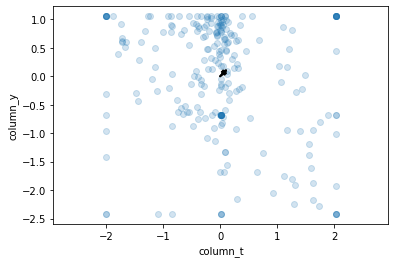

Explained variance = [4.457470867946926, 0.30848347466117204]
Components = [-6.245004513516506e-17, 0.07851416278657723]
Mean = [0.0, 3.6252180395923476e-17]


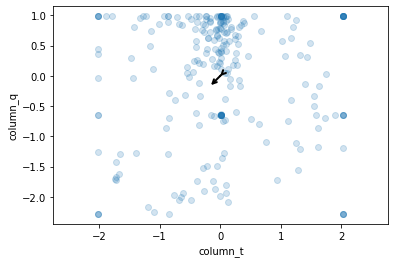

Explained variance = [4.457470867946926, 0.2788723726352035]
Components = [-6.245004513516506e-17, -0.0953943872992796]
Mean = [0.0, 5.075305255429287e-17]


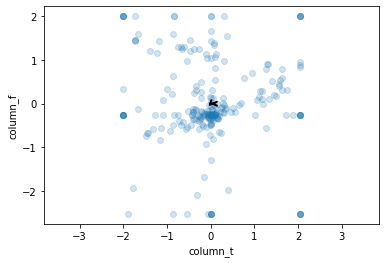

Explained variance = [4.457470867946926, 0.2589385263862628]
Components = [-6.245004513516506e-17, -0.03503640384300756]
Mean = [0.0, 1.812609019796174e-18]


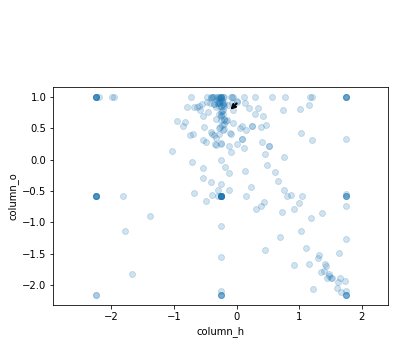

Explained variance = [2.822350997931873, 9.045686775921455]
Components = [0.3102780597669046, -0.011141246153571102]
Mean = [-2.1751308237554087e-16, 0.8979591836734694]


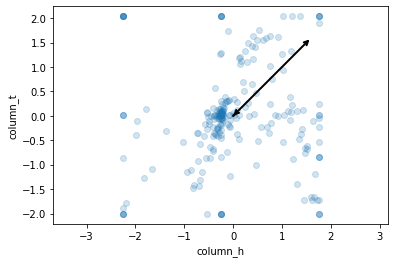

Explained variance = [2.822350997931873, 4.457470867946926]
Components = [0.3102780597669046, -6.245004513516506e-17]
Mean = [-2.1751308237554087e-16, 0.0]


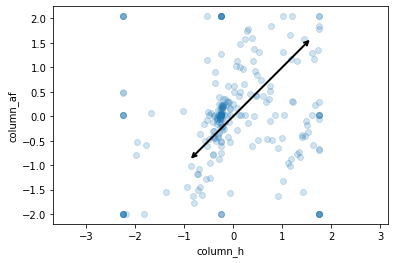

Explained variance = [2.822350997931873, 2.157580027592784]
Components = [0.3102780597669046, -0.19653764888187195]
Mean = [-2.1751308237554087e-16, 1.4500872158369393e-17]


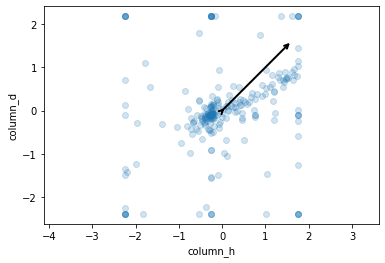

Explained variance = [2.822350997931873, 1.9798933033287716]
Components = [0.3102780597669046, 0.012503558776654773]
Mean = [-2.1751308237554087e-16, -1.1600697726695514e-16]


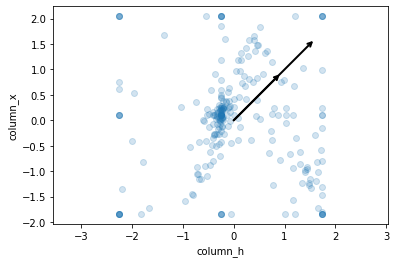

Explained variance = [2.822350997931873, 1.186305218642031]
Components = [0.3102780597669046, 0.277000387808718]
Mean = [-2.1751308237554087e-16, 8.700523295021634e-17]


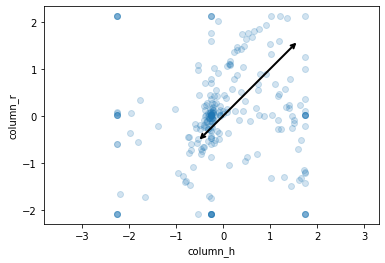

Explained variance = [2.822350997931873, 1.06450357671577]
Components = [0.3102780597669046, -0.16270202413237378]
Mean = [-2.1751308237554087e-16, -3.9877398435515827e-16]


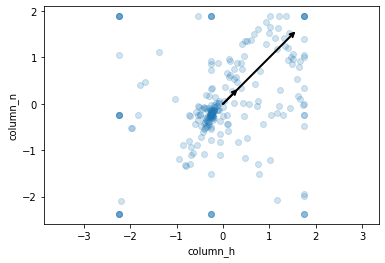

Explained variance = [2.822350997931873, 0.9663858659383975]
Components = [0.3102780597669046, 0.10790050453517153]
Mean = [-2.1751308237554087e-16, 2.718913529694261e-17]


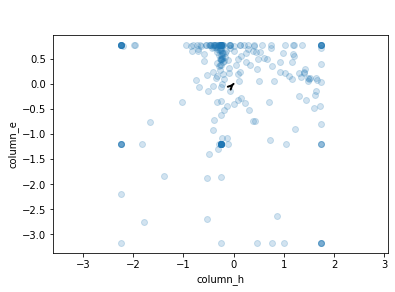

Explained variance = [2.822350997931873, 0.8223436463906109]
Components = [0.3102780597669046, 0.0009323281055461127]
Mean = [-2.1751308237554087e-16, -3.8789833023638124e-16]


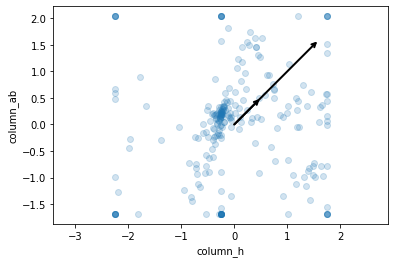

Explained variance = [2.822350997931873, 0.8106464691360841]
Components = [0.3102780597669046, 0.17729576748331272]
Mean = [-2.1751308237554087e-16, -1.812609019796174e-18]


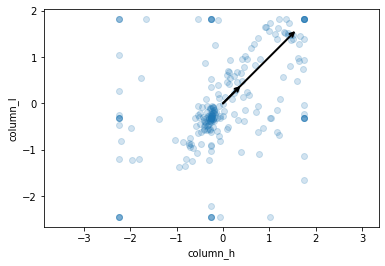

Explained variance = [2.822350997931873, 0.6904475095535513]
Components = [0.3102780597669046, 0.15191473023488347]
Mean = [-2.1751308237554087e-16, -1.8851133805880208e-16]


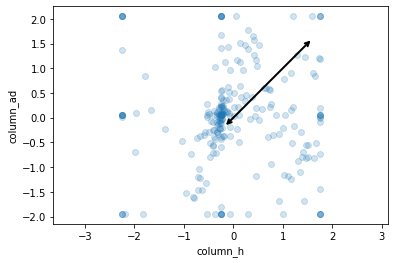

Explained variance = [2.822350997931873, 0.6571354092729098]
Components = [0.3102780597669046, -0.06219276085082239]
Mean = [-2.1751308237554087e-16, -1.450087215836939e-16]


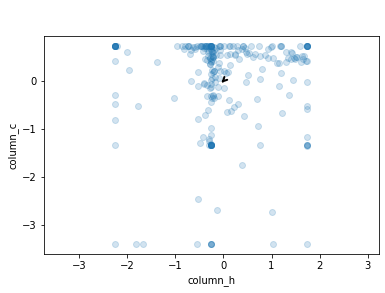

Explained variance = [2.822350997931873, 0.5650664430011808]
Components = [0.3102780597669046, -0.01849375523188338]
Mean = [-2.1751308237554087e-16, -2.6101569885064907e-16]


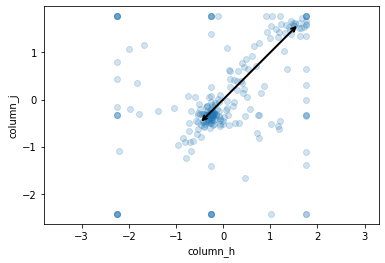

Explained variance = [2.822350997931873, 0.5330852327996964]
Components = [0.3102780597669046, -0.21202851851721957]
Mean = [-2.1751308237554087e-16, 7.975479687103165e-17]


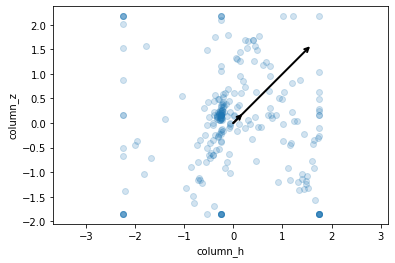

Explained variance = [2.822350997931873, 0.5101953831380778]
Components = [0.3102780597669046, 0.08716929481142828]
Mean = [-2.1751308237554087e-16, -4.604026910282282e-16]


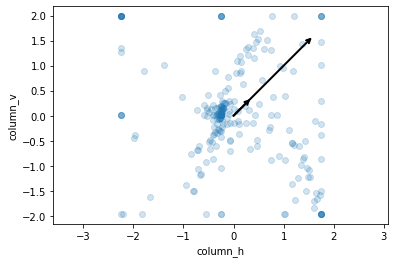

Explained variance = [2.822350997931873, 0.4770319942870226]
Components = [0.3102780597669046, 0.16139635864988555]
Mean = [-2.1751308237554087e-16, -5.437827059388522e-17]


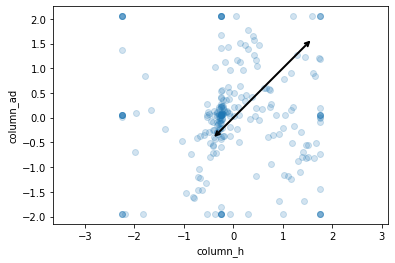

Explained variance = [2.822350997931873, 0.4185193951809043]
Components = [0.3102780597669046, -0.201081312912407]
Mean = [-2.1751308237554087e-16, -3.7702267611760416e-16]


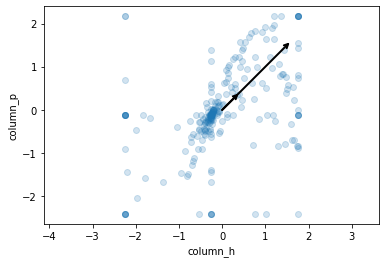

Explained variance = [2.822350997931873, 0.3926342387071242]
Components = [0.3102780597669046, 0.20336865374115512]
Mean = [-2.1751308237554087e-16, 7.250436079184696e-18]


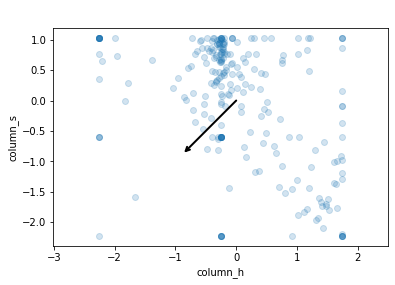

Explained variance = [2.822350997931873, 0.36064540906532044]
Components = [0.3102780597669046, -0.4754902900511677]
Mean = [-2.1751308237554087e-16, 1.740104659004327e-16]


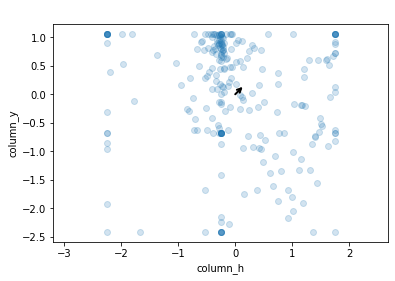

Explained variance = [2.822350997931873, 0.30848347466117204]
Components = [0.3102780597669046, 0.07851416278657723]
Mean = [-2.1751308237554087e-16, 3.6252180395923476e-17]


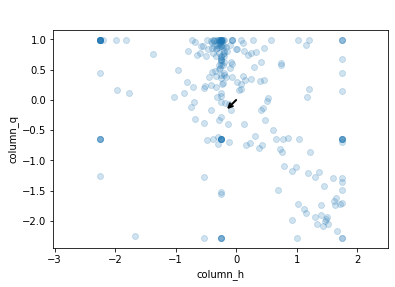

Explained variance = [2.822350997931873, 0.2788723726352035]
Components = [0.3102780597669046, -0.0953943872992796]
Mean = [-2.1751308237554087e-16, 5.075305255429287e-17]


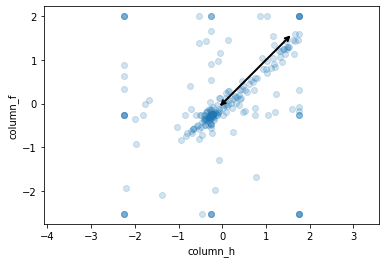

Explained variance = [2.822350997931873, 0.2589385263862628]
Components = [0.3102780597669046, -0.03503640384300756]
Mean = [-2.1751308237554087e-16, 1.812609019796174e-18]


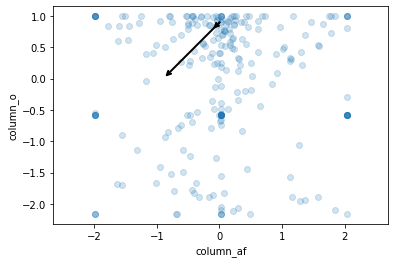

Explained variance = [2.157580027592784, 9.045686775921455]
Components = [-0.19653764888187195, -0.011141246153571102]
Mean = [1.4500872158369393e-17, 0.8979591836734694]


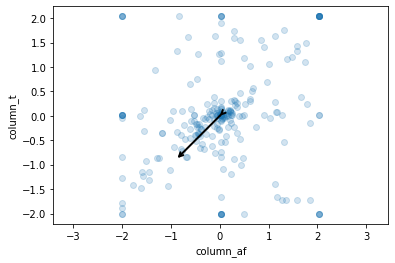

Explained variance = [2.157580027592784, 4.457470867946926]
Components = [-0.19653764888187195, -6.245004513516506e-17]
Mean = [1.4500872158369393e-17, 0.0]


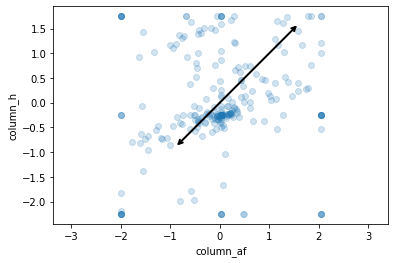

Explained variance = [2.157580027592784, 2.822350997931873]
Components = [-0.19653764888187195, 0.3102780597669046]
Mean = [1.4500872158369393e-17, -2.1751308237554087e-16]


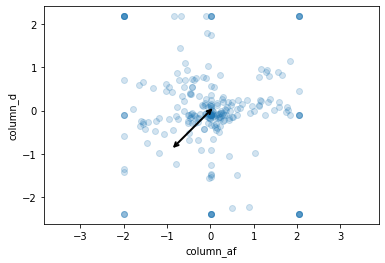

Explained variance = [2.157580027592784, 1.9798933033287716]
Components = [-0.19653764888187195, 0.012503558776654773]
Mean = [1.4500872158369393e-17, -1.1600697726695514e-16]


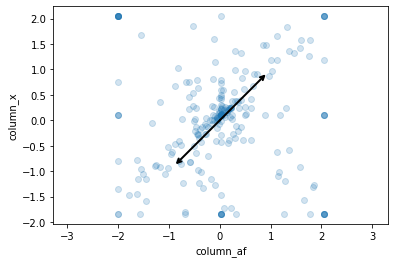

Explained variance = [2.157580027592784, 1.186305218642031]
Components = [-0.19653764888187195, 0.277000387808718]
Mean = [1.4500872158369393e-17, 8.700523295021634e-17]


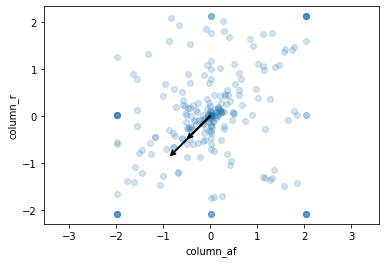

Explained variance = [2.157580027592784, 1.06450357671577]
Components = [-0.19653764888187195, -0.16270202413237378]
Mean = [1.4500872158369393e-17, -3.9877398435515827e-16]


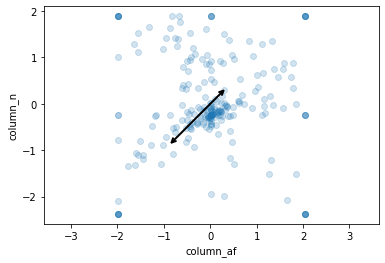

Explained variance = [2.157580027592784, 0.9663858659383975]
Components = [-0.19653764888187195, 0.10790050453517153]
Mean = [1.4500872158369393e-17, 2.718913529694261e-17]


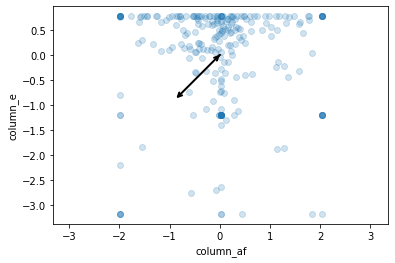

Explained variance = [2.157580027592784, 0.8223436463906109]
Components = [-0.19653764888187195, 0.0009323281055461127]
Mean = [1.4500872158369393e-17, -3.8789833023638124e-16]


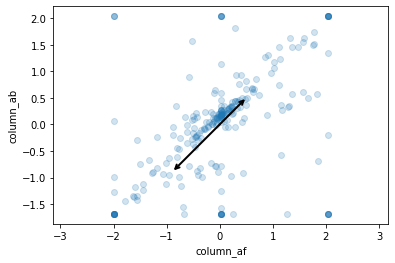

Explained variance = [2.157580027592784, 0.8106464691360841]
Components = [-0.19653764888187195, 0.17729576748331272]
Mean = [1.4500872158369393e-17, -1.812609019796174e-18]


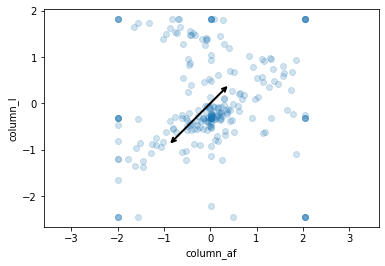

Explained variance = [2.157580027592784, 0.6904475095535513]
Components = [-0.19653764888187195, 0.15191473023488347]
Mean = [1.4500872158369393e-17, -1.8851133805880208e-16]


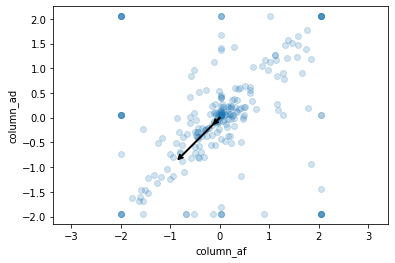

Explained variance = [2.157580027592784, 0.6571354092729098]
Components = [-0.19653764888187195, -0.06219276085082239]
Mean = [1.4500872158369393e-17, -1.450087215836939e-16]


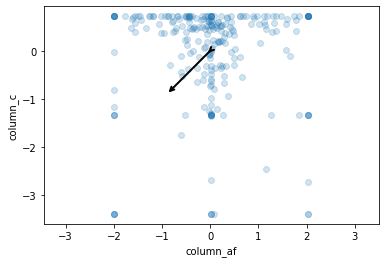

Explained variance = [2.157580027592784, 0.5650664430011808]
Components = [-0.19653764888187195, -0.01849375523188338]
Mean = [1.4500872158369393e-17, -2.6101569885064907e-16]


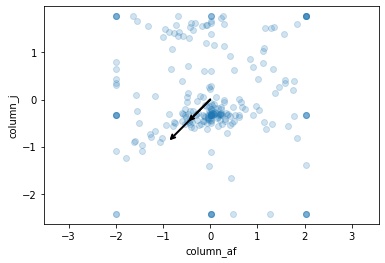

Explained variance = [2.157580027592784, 0.5330852327996964]
Components = [-0.19653764888187195, -0.21202851851721957]
Mean = [1.4500872158369393e-17, 7.975479687103165e-17]


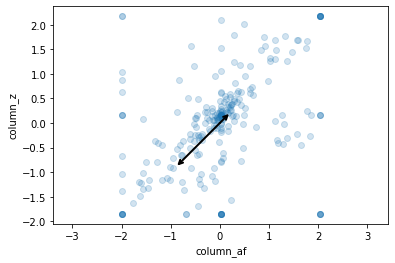

Explained variance = [2.157580027592784, 0.5101953831380778]
Components = [-0.19653764888187195, 0.08716929481142828]
Mean = [1.4500872158369393e-17, -4.604026910282282e-16]


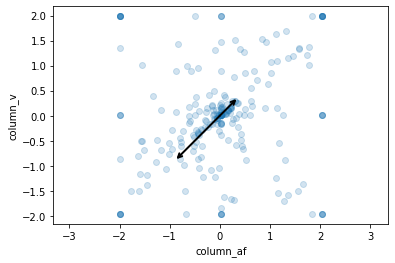

Explained variance = [2.157580027592784, 0.4770319942870226]
Components = [-0.19653764888187195, 0.16139635864988555]
Mean = [1.4500872158369393e-17, -5.437827059388522e-17]


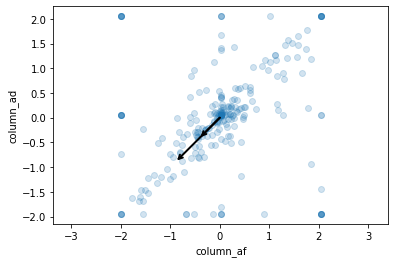

Explained variance = [2.157580027592784, 0.4185193951809043]
Components = [-0.19653764888187195, -0.201081312912407]
Mean = [1.4500872158369393e-17, -3.7702267611760416e-16]


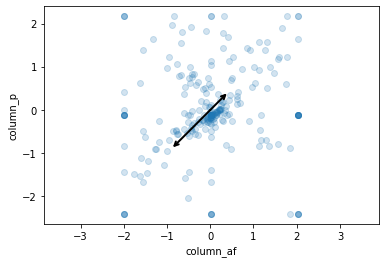

Explained variance = [2.157580027592784, 0.3926342387071242]
Components = [-0.19653764888187195, 0.20336865374115512]
Mean = [1.4500872158369393e-17, 7.250436079184696e-18]


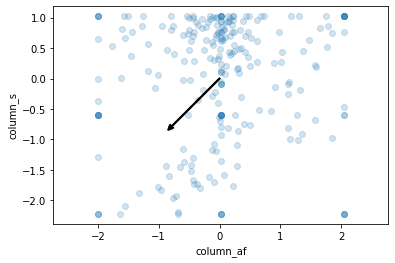

Explained variance = [2.157580027592784, 0.36064540906532044]
Components = [-0.19653764888187195, -0.4754902900511677]
Mean = [1.4500872158369393e-17, 1.740104659004327e-16]


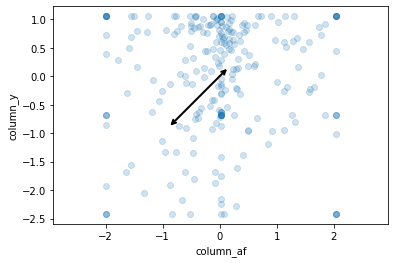

Explained variance = [2.157580027592784, 0.30848347466117204]
Components = [-0.19653764888187195, 0.07851416278657723]
Mean = [1.4500872158369393e-17, 3.6252180395923476e-17]


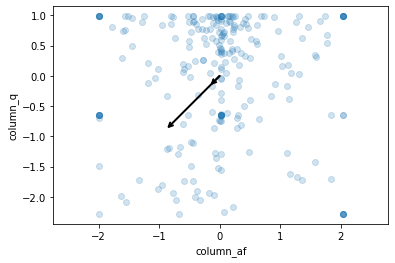

Explained variance = [2.157580027592784, 0.2788723726352035]
Components = [-0.19653764888187195, -0.0953943872992796]
Mean = [1.4500872158369393e-17, 5.075305255429287e-17]


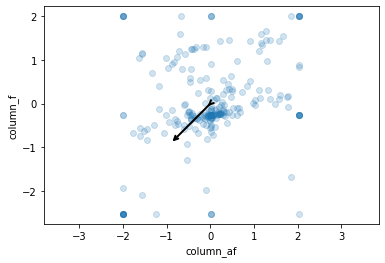

Explained variance = [2.157580027592784, 0.2589385263862628]
Components = [-0.19653764888187195, -0.03503640384300756]
Mean = [1.4500872158369393e-17, 1.812609019796174e-18]


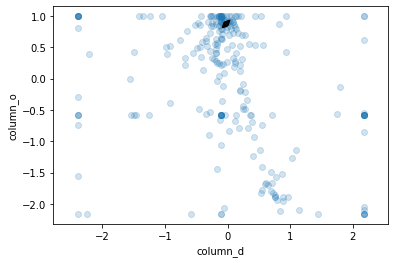

Explained variance = [1.9798933033287716, 9.045686775921455]
Components = [0.012503558776654773, -0.011141246153571102]
Mean = [-1.1600697726695514e-16, 0.8979591836734694]


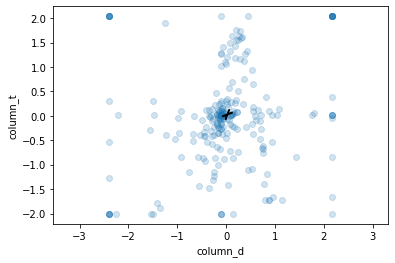

Explained variance = [1.9798933033287716, 4.457470867946926]
Components = [0.012503558776654773, -6.245004513516506e-17]
Mean = [-1.1600697726695514e-16, 0.0]


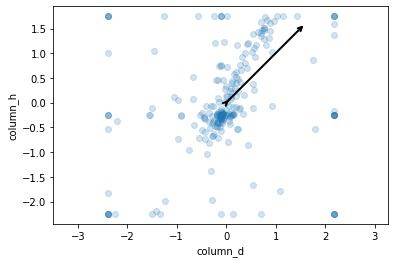

Explained variance = [1.9798933033287716, 2.822350997931873]
Components = [0.012503558776654773, 0.3102780597669046]
Mean = [-1.1600697726695514e-16, -2.1751308237554087e-16]


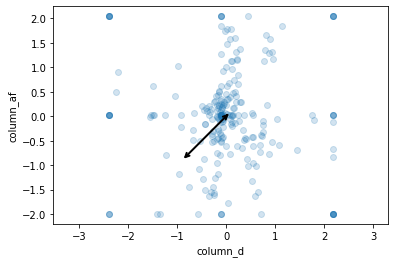

Explained variance = [1.9798933033287716, 2.157580027592784]
Components = [0.012503558776654773, -0.19653764888187195]
Mean = [-1.1600697726695514e-16, 1.4500872158369393e-17]


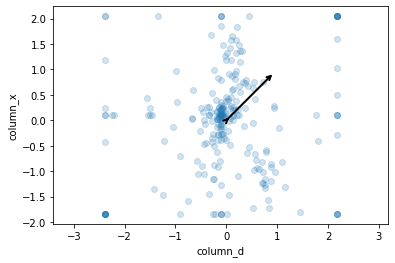

Explained variance = [1.9798933033287716, 1.186305218642031]
Components = [0.012503558776654773, 0.277000387808718]
Mean = [-1.1600697726695514e-16, 8.700523295021634e-17]


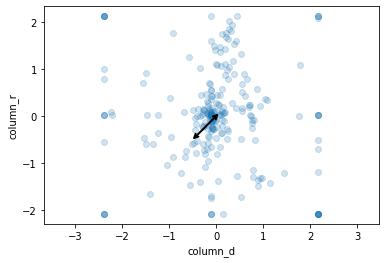

Explained variance = [1.9798933033287716, 1.06450357671577]
Components = [0.012503558776654773, -0.16270202413237378]
Mean = [-1.1600697726695514e-16, -3.9877398435515827e-16]


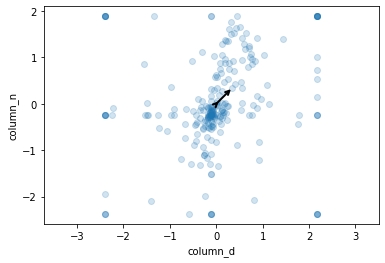

Explained variance = [1.9798933033287716, 0.9663858659383975]
Components = [0.012503558776654773, 0.10790050453517153]
Mean = [-1.1600697726695514e-16, 2.718913529694261e-17]


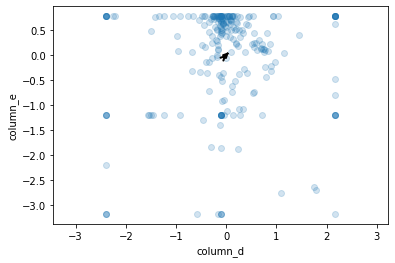

Explained variance = [1.9798933033287716, 0.8223436463906109]
Components = [0.012503558776654773, 0.0009323281055461127]
Mean = [-1.1600697726695514e-16, -3.8789833023638124e-16]


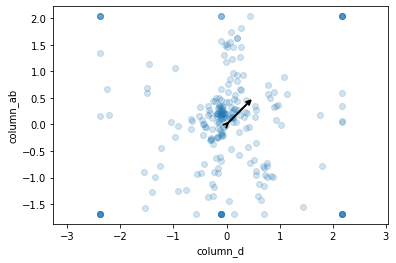

Explained variance = [1.9798933033287716, 0.8106464691360841]
Components = [0.012503558776654773, 0.17729576748331272]
Mean = [-1.1600697726695514e-16, -1.812609019796174e-18]


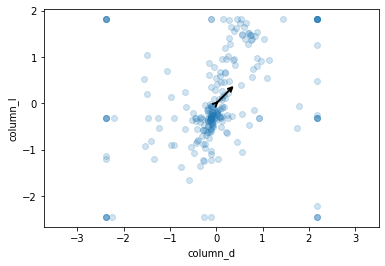

Explained variance = [1.9798933033287716, 0.6904475095535513]
Components = [0.012503558776654773, 0.15191473023488347]
Mean = [-1.1600697726695514e-16, -1.8851133805880208e-16]


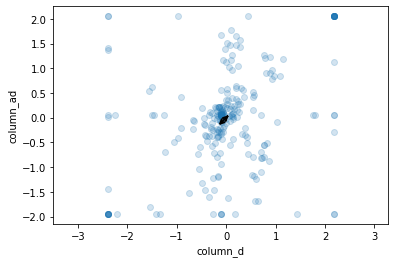

Explained variance = [1.9798933033287716, 0.6571354092729098]
Components = [0.012503558776654773, -0.06219276085082239]
Mean = [-1.1600697726695514e-16, -1.450087215836939e-16]


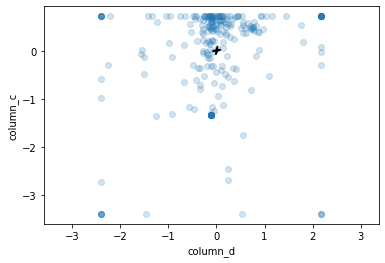

Explained variance = [1.9798933033287716, 0.5650664430011808]
Components = [0.012503558776654773, -0.01849375523188338]
Mean = [-1.1600697726695514e-16, -2.6101569885064907e-16]


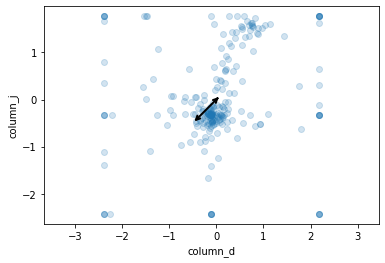

Explained variance = [1.9798933033287716, 0.5330852327996964]
Components = [0.012503558776654773, -0.21202851851721957]
Mean = [-1.1600697726695514e-16, 7.975479687103165e-17]


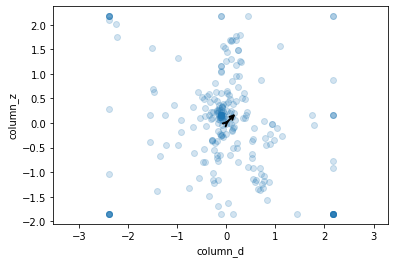

Explained variance = [1.9798933033287716, 0.5101953831380778]
Components = [0.012503558776654773, 0.08716929481142828]
Mean = [-1.1600697726695514e-16, -4.604026910282282e-16]


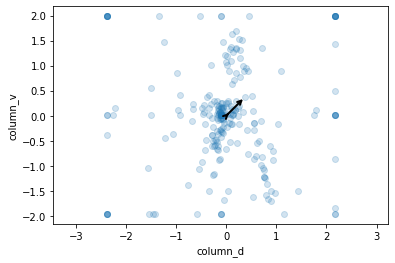

Explained variance = [1.9798933033287716, 0.4770319942870226]
Components = [0.012503558776654773, 0.16139635864988555]
Mean = [-1.1600697726695514e-16, -5.437827059388522e-17]


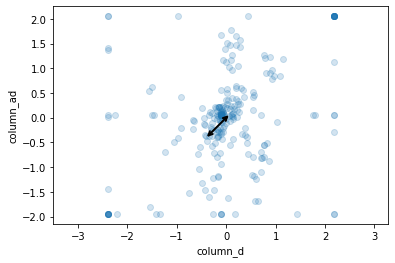

Explained variance = [1.9798933033287716, 0.4185193951809043]
Components = [0.012503558776654773, -0.201081312912407]
Mean = [-1.1600697726695514e-16, -3.7702267611760416e-16]


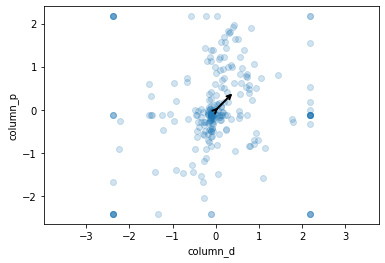

Explained variance = [1.9798933033287716, 0.3926342387071242]
Components = [0.012503558776654773, 0.20336865374115512]
Mean = [-1.1600697726695514e-16, 7.250436079184696e-18]


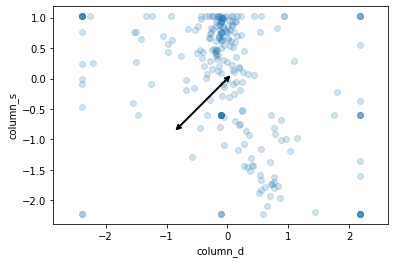

Explained variance = [1.9798933033287716, 0.36064540906532044]
Components = [0.012503558776654773, -0.4754902900511677]
Mean = [-1.1600697726695514e-16, 1.740104659004327e-16]


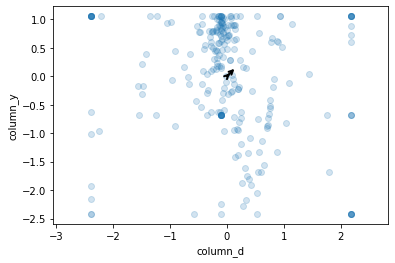

Explained variance = [1.9798933033287716, 0.30848347466117204]
Components = [0.012503558776654773, 0.07851416278657723]
Mean = [-1.1600697726695514e-16, 3.6252180395923476e-17]


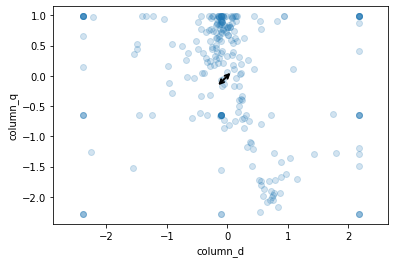

Explained variance = [1.9798933033287716, 0.2788723726352035]
Components = [0.012503558776654773, -0.0953943872992796]
Mean = [-1.1600697726695514e-16, 5.075305255429287e-17]


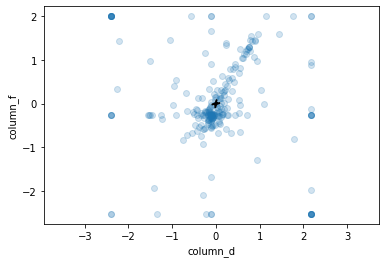

Explained variance = [1.9798933033287716, 0.2589385263862628]
Components = [0.012503558776654773, -0.03503640384300756]
Mean = [-1.1600697726695514e-16, 1.812609019796174e-18]


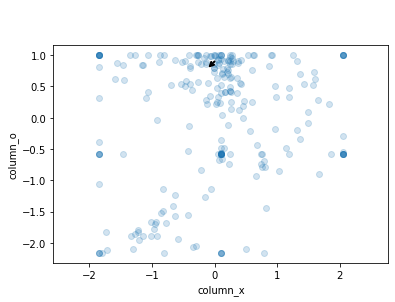

Explained variance = [1.186305218642031, 9.045686775921455]
Components = [0.277000387808718, -0.011141246153571102]
Mean = [8.700523295021634e-17, 0.8979591836734694]


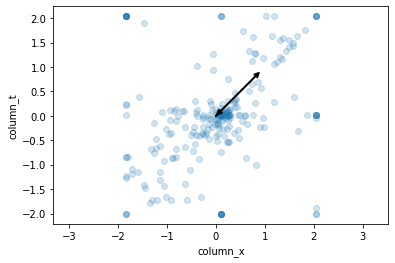

Explained variance = [1.186305218642031, 4.457470867946926]
Components = [0.277000387808718, -6.245004513516506e-17]
Mean = [8.700523295021634e-17, 0.0]


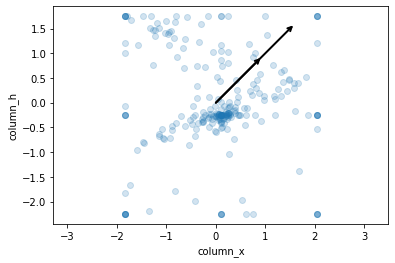

Explained variance = [1.186305218642031, 2.822350997931873]
Components = [0.277000387808718, 0.3102780597669046]
Mean = [8.700523295021634e-17, -2.1751308237554087e-16]


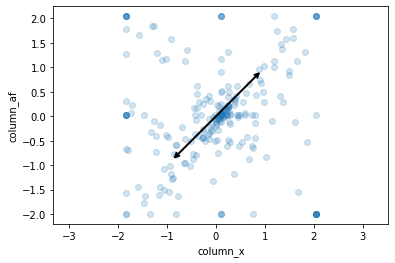

Explained variance = [1.186305218642031, 2.157580027592784]
Components = [0.277000387808718, -0.19653764888187195]
Mean = [8.700523295021634e-17, 1.4500872158369393e-17]


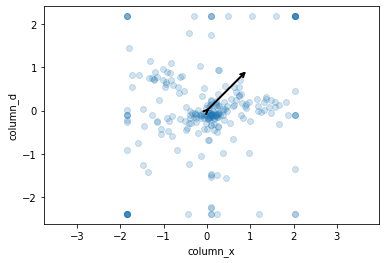

Explained variance = [1.186305218642031, 1.9798933033287716]
Components = [0.277000387808718, 0.012503558776654773]
Mean = [8.700523295021634e-17, -1.1600697726695514e-16]


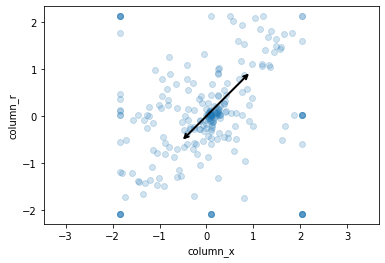

Explained variance = [1.186305218642031, 1.06450357671577]
Components = [0.277000387808718, -0.16270202413237378]
Mean = [8.700523295021634e-17, -3.9877398435515827e-16]


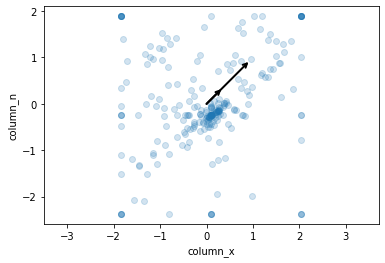

Explained variance = [1.186305218642031, 0.9663858659383975]
Components = [0.277000387808718, 0.10790050453517153]
Mean = [8.700523295021634e-17, 2.718913529694261e-17]


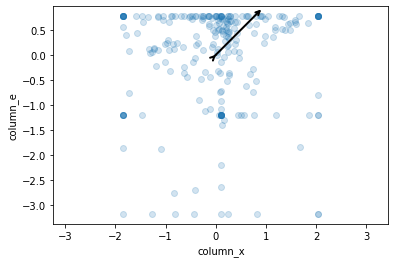

Explained variance = [1.186305218642031, 0.8223436463906109]
Components = [0.277000387808718, 0.0009323281055461127]
Mean = [8.700523295021634e-17, -3.8789833023638124e-16]


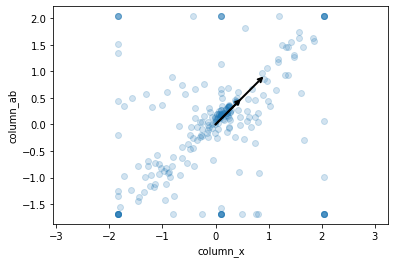

Explained variance = [1.186305218642031, 0.8106464691360841]
Components = [0.277000387808718, 0.17729576748331272]
Mean = [8.700523295021634e-17, -1.812609019796174e-18]


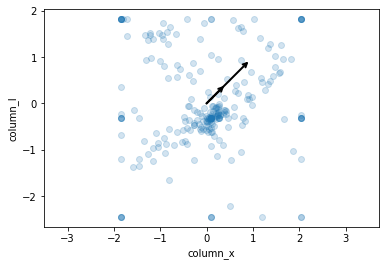

Explained variance = [1.186305218642031, 0.6904475095535513]
Components = [0.277000387808718, 0.15191473023488347]
Mean = [8.700523295021634e-17, -1.8851133805880208e-16]


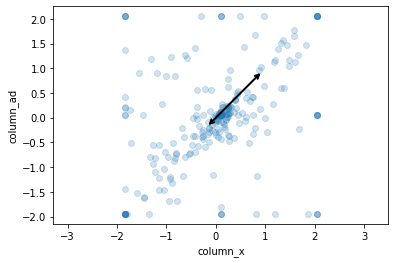

Explained variance = [1.186305218642031, 0.6571354092729098]
Components = [0.277000387808718, -0.06219276085082239]
Mean = [8.700523295021634e-17, -1.450087215836939e-16]


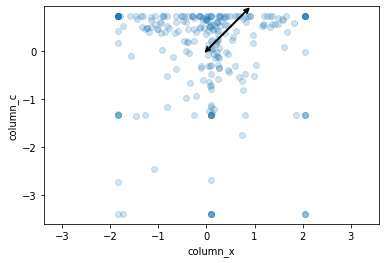

Explained variance = [1.186305218642031, 0.5650664430011808]
Components = [0.277000387808718, -0.01849375523188338]
Mean = [8.700523295021634e-17, -2.6101569885064907e-16]


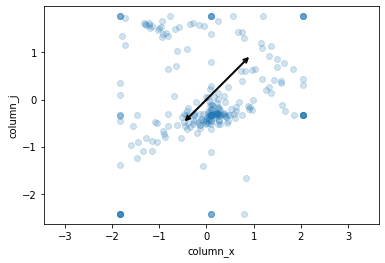

Explained variance = [1.186305218642031, 0.5330852327996964]
Components = [0.277000387808718, -0.21202851851721957]
Mean = [8.700523295021634e-17, 7.975479687103165e-17]


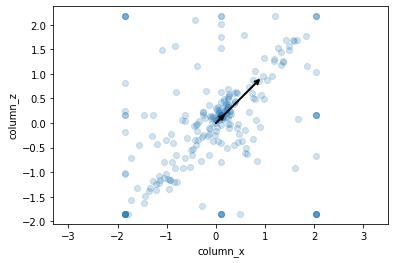

Explained variance = [1.186305218642031, 0.5101953831380778]
Components = [0.277000387808718, 0.08716929481142828]
Mean = [8.700523295021634e-17, -4.604026910282282e-16]


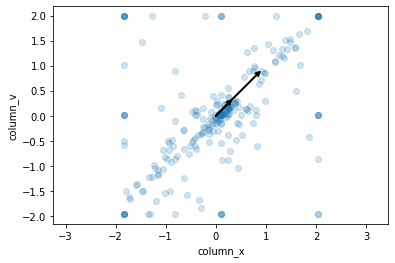

Explained variance = [1.186305218642031, 0.4770319942870226]
Components = [0.277000387808718, 0.16139635864988555]
Mean = [8.700523295021634e-17, -5.437827059388522e-17]


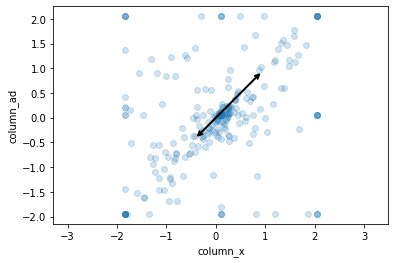

Explained variance = [1.186305218642031, 0.4185193951809043]
Components = [0.277000387808718, -0.201081312912407]
Mean = [8.700523295021634e-17, -3.7702267611760416e-16]


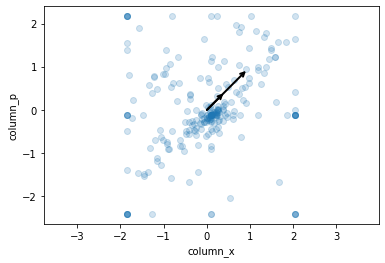

Explained variance = [1.186305218642031, 0.3926342387071242]
Components = [0.277000387808718, 0.20336865374115512]
Mean = [8.700523295021634e-17, 7.250436079184696e-18]


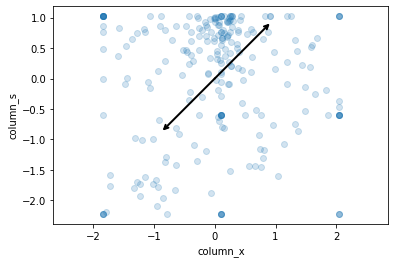

Explained variance = [1.186305218642031, 0.36064540906532044]
Components = [0.277000387808718, -0.4754902900511677]
Mean = [8.700523295021634e-17, 1.740104659004327e-16]


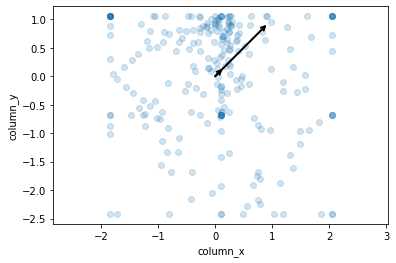

Explained variance = [1.186305218642031, 0.30848347466117204]
Components = [0.277000387808718, 0.07851416278657723]
Mean = [8.700523295021634e-17, 3.6252180395923476e-17]


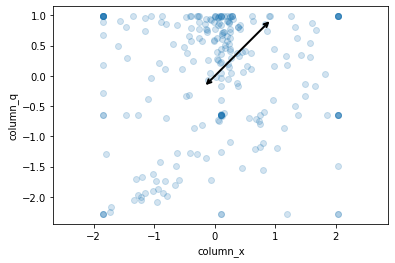

Explained variance = [1.186305218642031, 0.2788723726352035]
Components = [0.277000387808718, -0.0953943872992796]
Mean = [8.700523295021634e-17, 5.075305255429287e-17]


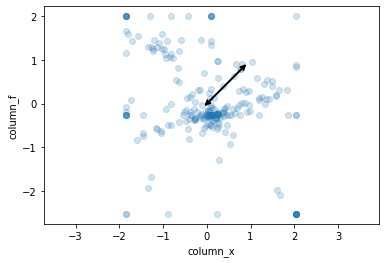

Explained variance = [1.186305218642031, 0.2589385263862628]
Components = [0.277000387808718, -0.03503640384300756]
Mean = [8.700523295021634e-17, 1.812609019796174e-18]


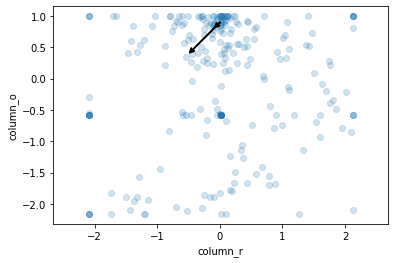

Explained variance = [1.06450357671577, 9.045686775921455]
Components = [-0.16270202413237378, -0.011141246153571102]
Mean = [-3.9877398435515827e-16, 0.8979591836734694]


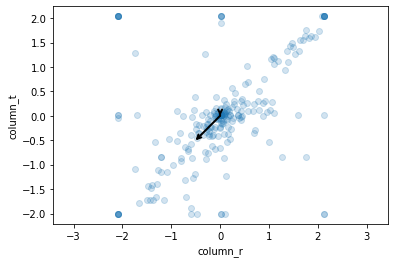

Explained variance = [1.06450357671577, 4.457470867946926]
Components = [-0.16270202413237378, -6.245004513516506e-17]
Mean = [-3.9877398435515827e-16, 0.0]


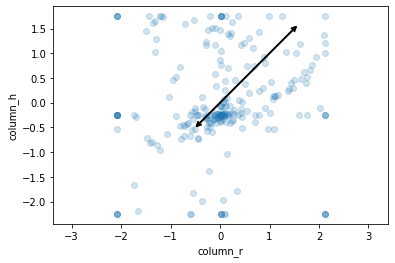

Explained variance = [1.06450357671577, 2.822350997931873]
Components = [-0.16270202413237378, 0.3102780597669046]
Mean = [-3.9877398435515827e-16, -2.1751308237554087e-16]


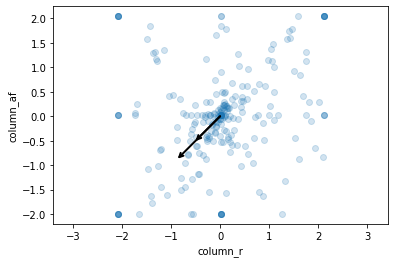

Explained variance = [1.06450357671577, 2.157580027592784]
Components = [-0.16270202413237378, -0.19653764888187195]
Mean = [-3.9877398435515827e-16, 1.4500872158369393e-17]


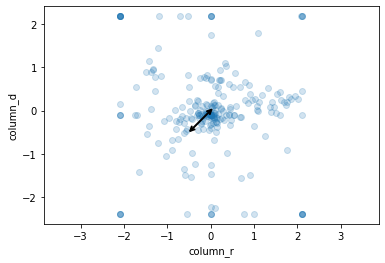

Explained variance = [1.06450357671577, 1.9798933033287716]
Components = [-0.16270202413237378, 0.012503558776654773]
Mean = [-3.9877398435515827e-16, -1.1600697726695514e-16]


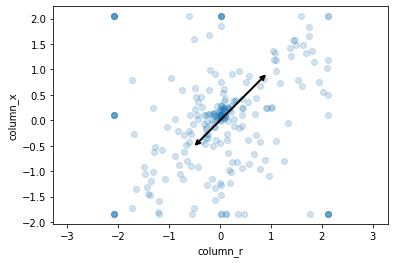

Explained variance = [1.06450357671577, 1.186305218642031]
Components = [-0.16270202413237378, 0.277000387808718]
Mean = [-3.9877398435515827e-16, 8.700523295021634e-17]


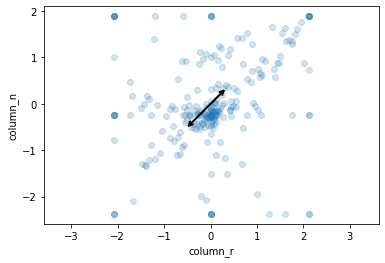

Explained variance = [1.06450357671577, 0.9663858659383975]
Components = [-0.16270202413237378, 0.10790050453517153]
Mean = [-3.9877398435515827e-16, 2.718913529694261e-17]


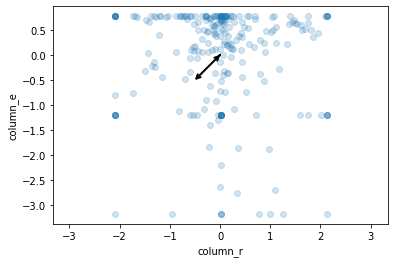

Explained variance = [1.06450357671577, 0.8223436463906109]
Components = [-0.16270202413237378, 0.0009323281055461127]
Mean = [-3.9877398435515827e-16, -3.8789833023638124e-16]


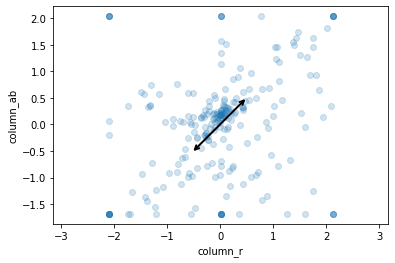

Explained variance = [1.06450357671577, 0.8106464691360841]
Components = [-0.16270202413237378, 0.17729576748331272]
Mean = [-3.9877398435515827e-16, -1.812609019796174e-18]


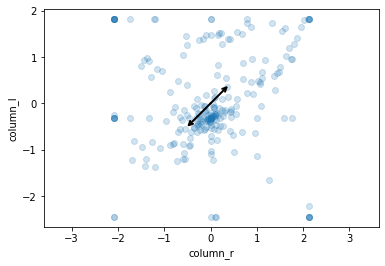

Explained variance = [1.06450357671577, 0.6904475095535513]
Components = [-0.16270202413237378, 0.15191473023488347]
Mean = [-3.9877398435515827e-16, -1.8851133805880208e-16]


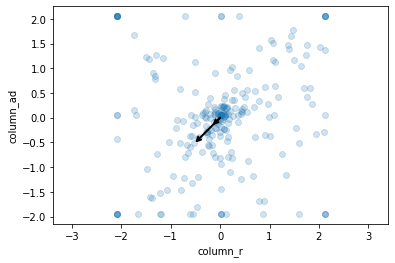

Explained variance = [1.06450357671577, 0.6571354092729098]
Components = [-0.16270202413237378, -0.06219276085082239]
Mean = [-3.9877398435515827e-16, -1.450087215836939e-16]


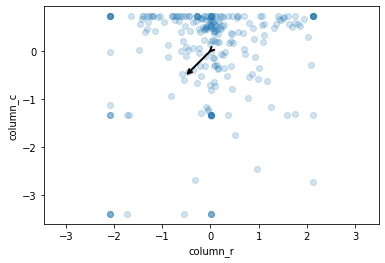

Explained variance = [1.06450357671577, 0.5650664430011808]
Components = [-0.16270202413237378, -0.01849375523188338]
Mean = [-3.9877398435515827e-16, -2.6101569885064907e-16]


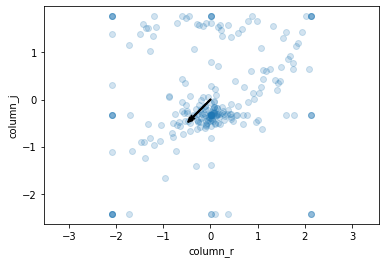

Explained variance = [1.06450357671577, 0.5330852327996964]
Components = [-0.16270202413237378, -0.21202851851721957]
Mean = [-3.9877398435515827e-16, 7.975479687103165e-17]


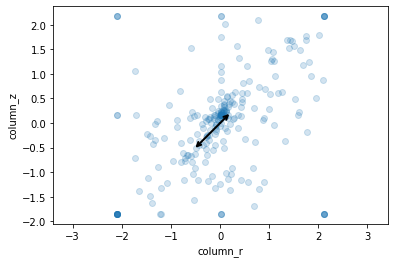

Explained variance = [1.06450357671577, 0.5101953831380778]
Components = [-0.16270202413237378, 0.08716929481142828]
Mean = [-3.9877398435515827e-16, -4.604026910282282e-16]


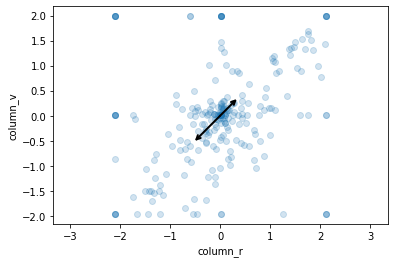

Explained variance = [1.06450357671577, 0.4770319942870226]
Components = [-0.16270202413237378, 0.16139635864988555]
Mean = [-3.9877398435515827e-16, -5.437827059388522e-17]


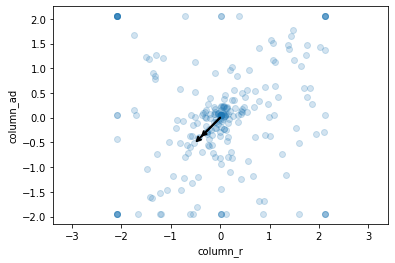

Explained variance = [1.06450357671577, 0.4185193951809043]
Components = [-0.16270202413237378, -0.201081312912407]
Mean = [-3.9877398435515827e-16, -3.7702267611760416e-16]


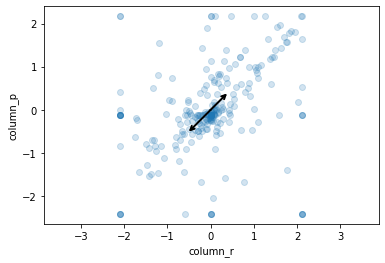

Explained variance = [1.06450357671577, 0.3926342387071242]
Components = [-0.16270202413237378, 0.20336865374115512]
Mean = [-3.9877398435515827e-16, 7.250436079184696e-18]


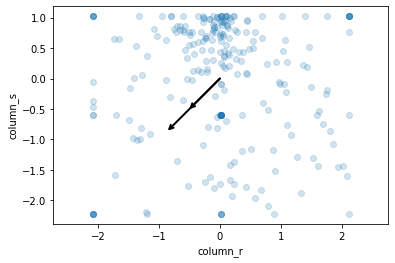

Explained variance = [1.06450357671577, 0.36064540906532044]
Components = [-0.16270202413237378, -0.4754902900511677]
Mean = [-3.9877398435515827e-16, 1.740104659004327e-16]


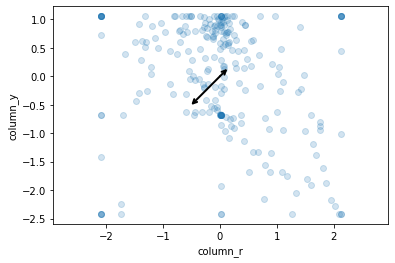

Explained variance = [1.06450357671577, 0.30848347466117204]
Components = [-0.16270202413237378, 0.07851416278657723]
Mean = [-3.9877398435515827e-16, 3.6252180395923476e-17]


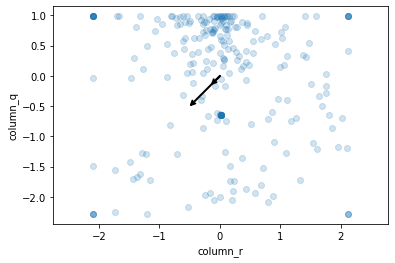

Explained variance = [1.06450357671577, 0.2788723726352035]
Components = [-0.16270202413237378, -0.0953943872992796]
Mean = [-3.9877398435515827e-16, 5.075305255429287e-17]


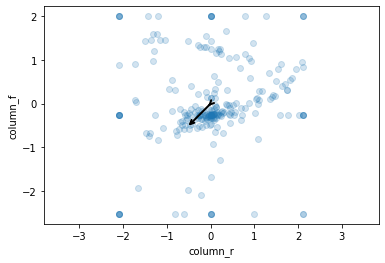

Explained variance = [1.06450357671577, 0.2589385263862628]
Components = [-0.16270202413237378, -0.03503640384300756]
Mean = [-3.9877398435515827e-16, 1.812609019796174e-18]


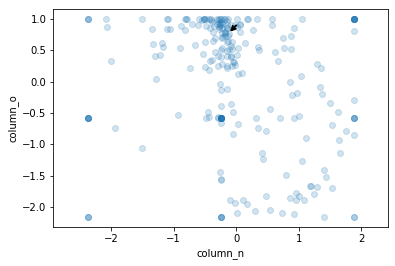

Explained variance = [0.9663858659383975, 9.045686775921455]
Components = [0.10790050453517153, -0.011141246153571102]
Mean = [2.718913529694261e-17, 0.8979591836734694]


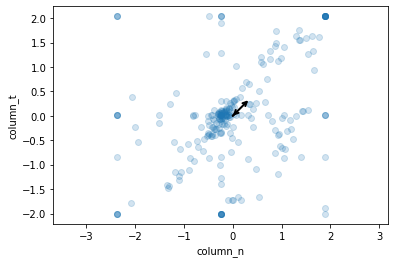

Explained variance = [0.9663858659383975, 4.457470867946926]
Components = [0.10790050453517153, -6.245004513516506e-17]
Mean = [2.718913529694261e-17, 0.0]


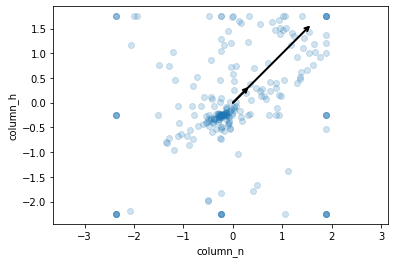

Explained variance = [0.9663858659383975, 2.822350997931873]
Components = [0.10790050453517153, 0.3102780597669046]
Mean = [2.718913529694261e-17, -2.1751308237554087e-16]


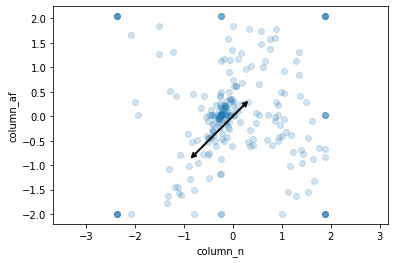

Explained variance = [0.9663858659383975, 2.157580027592784]
Components = [0.10790050453517153, -0.19653764888187195]
Mean = [2.718913529694261e-17, 1.4500872158369393e-17]


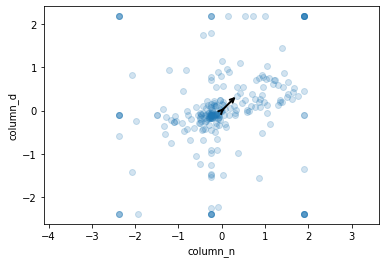

Explained variance = [0.9663858659383975, 1.9798933033287716]
Components = [0.10790050453517153, 0.012503558776654773]
Mean = [2.718913529694261e-17, -1.1600697726695514e-16]


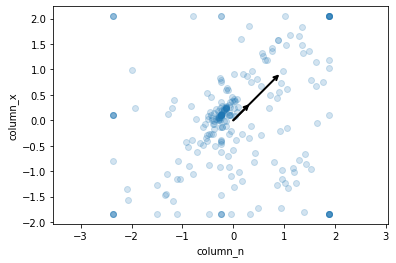

Explained variance = [0.9663858659383975, 1.186305218642031]
Components = [0.10790050453517153, 0.277000387808718]
Mean = [2.718913529694261e-17, 8.700523295021634e-17]


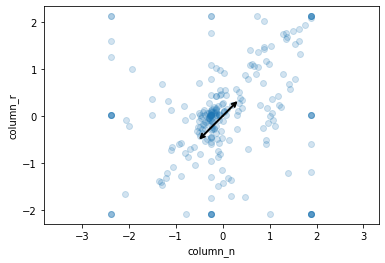

Explained variance = [0.9663858659383975, 1.06450357671577]
Components = [0.10790050453517153, -0.16270202413237378]
Mean = [2.718913529694261e-17, -3.9877398435515827e-16]


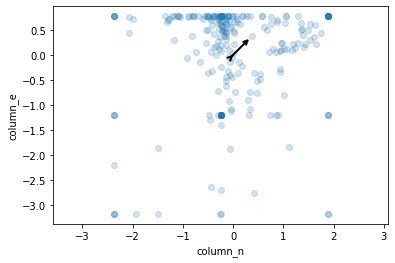

Explained variance = [0.9663858659383975, 0.8223436463906109]
Components = [0.10790050453517153, 0.0009323281055461127]
Mean = [2.718913529694261e-17, -3.8789833023638124e-16]


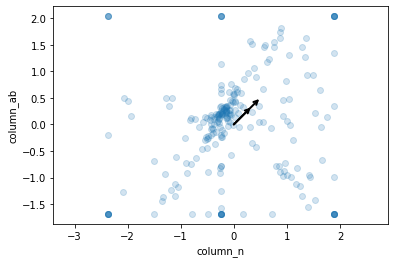

Explained variance = [0.9663858659383975, 0.8106464691360841]
Components = [0.10790050453517153, 0.17729576748331272]
Mean = [2.718913529694261e-17, -1.812609019796174e-18]


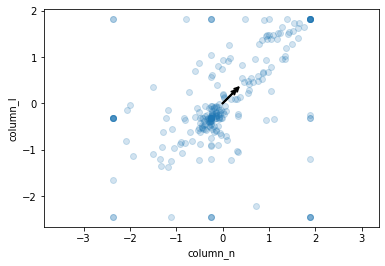

Explained variance = [0.9663858659383975, 0.6904475095535513]
Components = [0.10790050453517153, 0.15191473023488347]
Mean = [2.718913529694261e-17, -1.8851133805880208e-16]


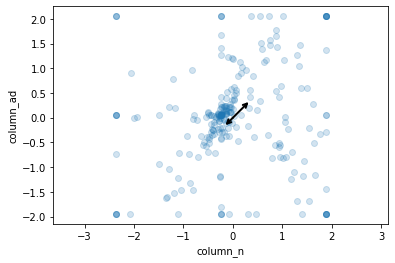

Explained variance = [0.9663858659383975, 0.6571354092729098]
Components = [0.10790050453517153, -0.06219276085082239]
Mean = [2.718913529694261e-17, -1.450087215836939e-16]


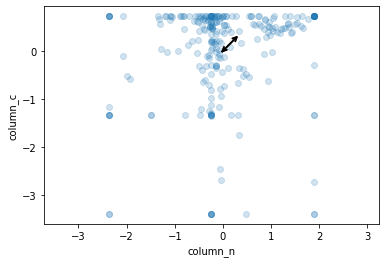

Explained variance = [0.9663858659383975, 0.5650664430011808]
Components = [0.10790050453517153, -0.01849375523188338]
Mean = [2.718913529694261e-17, -2.6101569885064907e-16]


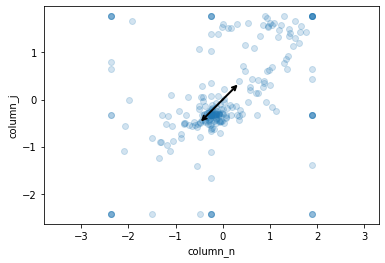

Explained variance = [0.9663858659383975, 0.5330852327996964]
Components = [0.10790050453517153, -0.21202851851721957]
Mean = [2.718913529694261e-17, 7.975479687103165e-17]


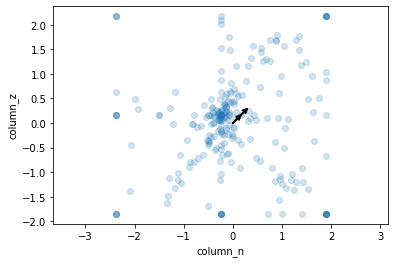

Explained variance = [0.9663858659383975, 0.5101953831380778]
Components = [0.10790050453517153, 0.08716929481142828]
Mean = [2.718913529694261e-17, -4.604026910282282e-16]


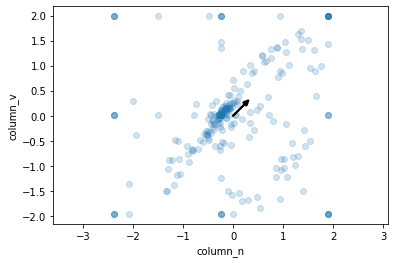

Explained variance = [0.9663858659383975, 0.4770319942870226]
Components = [0.10790050453517153, 0.16139635864988555]
Mean = [2.718913529694261e-17, -5.437827059388522e-17]


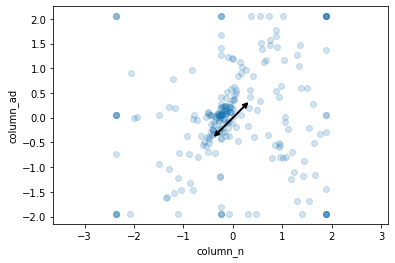

Explained variance = [0.9663858659383975, 0.4185193951809043]
Components = [0.10790050453517153, -0.201081312912407]
Mean = [2.718913529694261e-17, -3.7702267611760416e-16]


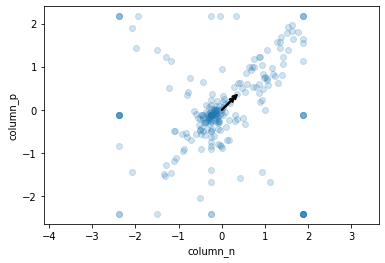

Explained variance = [0.9663858659383975, 0.3926342387071242]
Components = [0.10790050453517153, 0.20336865374115512]
Mean = [2.718913529694261e-17, 7.250436079184696e-18]


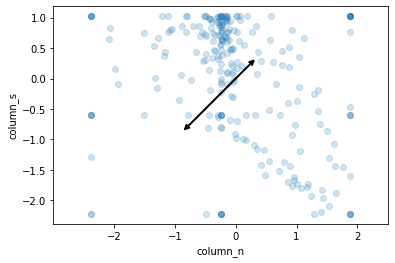

Explained variance = [0.9663858659383975, 0.36064540906532044]
Components = [0.10790050453517153, -0.4754902900511677]
Mean = [2.718913529694261e-17, 1.740104659004327e-16]


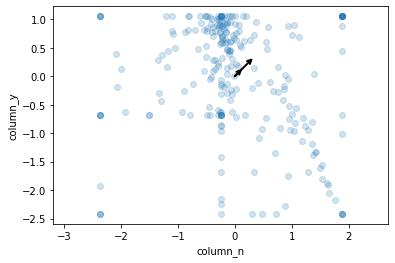

Explained variance = [0.9663858659383975, 0.30848347466117204]
Components = [0.10790050453517153, 0.07851416278657723]
Mean = [2.718913529694261e-17, 3.6252180395923476e-17]


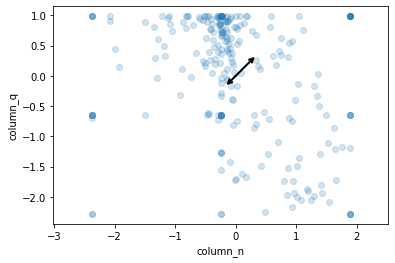

Explained variance = [0.9663858659383975, 0.2788723726352035]
Components = [0.10790050453517153, -0.0953943872992796]
Mean = [2.718913529694261e-17, 5.075305255429287e-17]


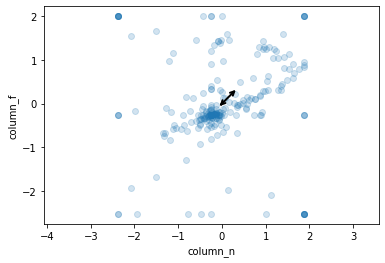

Explained variance = [0.9663858659383975, 0.2589385263862628]
Components = [0.10790050453517153, -0.03503640384300756]
Mean = [2.718913529694261e-17, 1.812609019796174e-18]


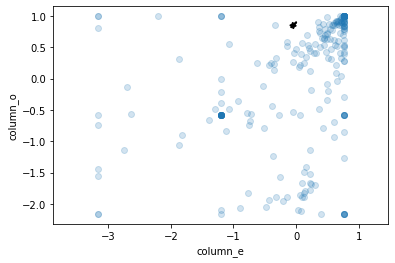

Explained variance = [0.8223436463906109, 9.045686775921455]
Components = [0.0009323281055461127, -0.011141246153571102]
Mean = [-3.8789833023638124e-16, 0.8979591836734694]


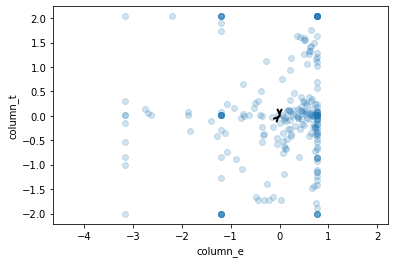

Explained variance = [0.8223436463906109, 4.457470867946926]
Components = [0.0009323281055461127, -6.245004513516506e-17]
Mean = [-3.8789833023638124e-16, 0.0]


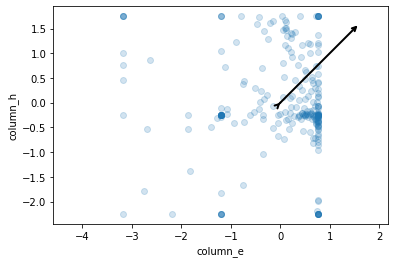

Explained variance = [0.8223436463906109, 2.822350997931873]
Components = [0.0009323281055461127, 0.3102780597669046]
Mean = [-3.8789833023638124e-16, -2.1751308237554087e-16]


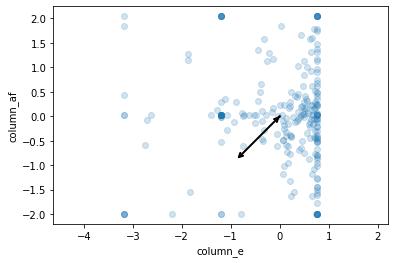

Explained variance = [0.8223436463906109, 2.157580027592784]
Components = [0.0009323281055461127, -0.19653764888187195]
Mean = [-3.8789833023638124e-16, 1.4500872158369393e-17]


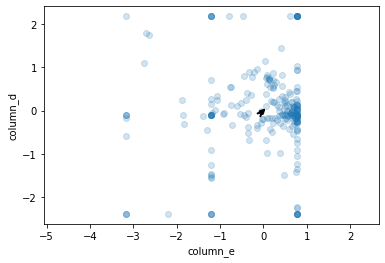

Explained variance = [0.8223436463906109, 1.9798933033287716]
Components = [0.0009323281055461127, 0.012503558776654773]
Mean = [-3.8789833023638124e-16, -1.1600697726695514e-16]


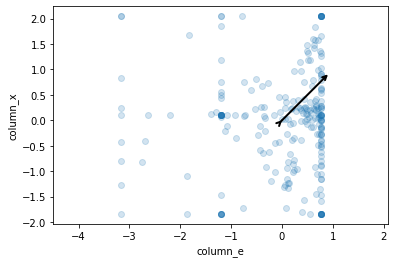

Explained variance = [0.8223436463906109, 1.186305218642031]
Components = [0.0009323281055461127, 0.277000387808718]
Mean = [-3.8789833023638124e-16, 8.700523295021634e-17]


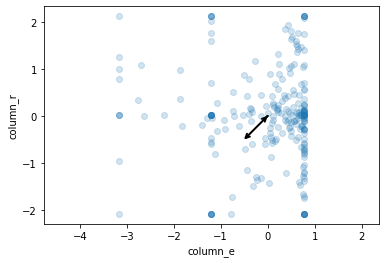

Explained variance = [0.8223436463906109, 1.06450357671577]
Components = [0.0009323281055461127, -0.16270202413237378]
Mean = [-3.8789833023638124e-16, -3.9877398435515827e-16]


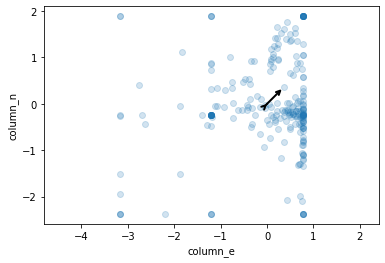

Explained variance = [0.8223436463906109, 0.9663858659383975]
Components = [0.0009323281055461127, 0.10790050453517153]
Mean = [-3.8789833023638124e-16, 2.718913529694261e-17]


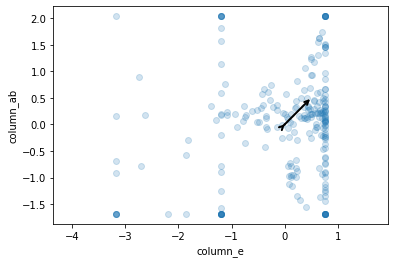

Explained variance = [0.8223436463906109, 0.8106464691360841]
Components = [0.0009323281055461127, 0.17729576748331272]
Mean = [-3.8789833023638124e-16, -1.812609019796174e-18]


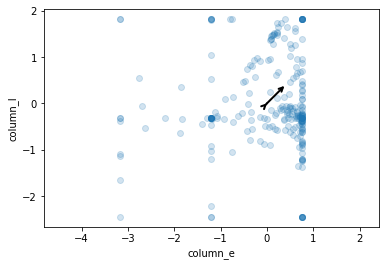

Explained variance = [0.8223436463906109, 0.6904475095535513]
Components = [0.0009323281055461127, 0.15191473023488347]
Mean = [-3.8789833023638124e-16, -1.8851133805880208e-16]


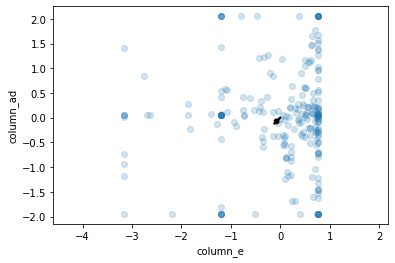

Explained variance = [0.8223436463906109, 0.6571354092729098]
Components = [0.0009323281055461127, -0.06219276085082239]
Mean = [-3.8789833023638124e-16, -1.450087215836939e-16]


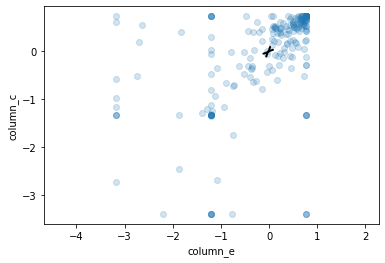

Explained variance = [0.8223436463906109, 0.5650664430011808]
Components = [0.0009323281055461127, -0.01849375523188338]
Mean = [-3.8789833023638124e-16, -2.6101569885064907e-16]


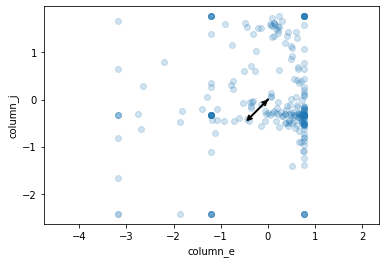

Explained variance = [0.8223436463906109, 0.5330852327996964]
Components = [0.0009323281055461127, -0.21202851851721957]
Mean = [-3.8789833023638124e-16, 7.975479687103165e-17]


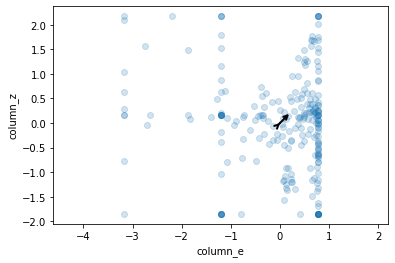

Explained variance = [0.8223436463906109, 0.5101953831380778]
Components = [0.0009323281055461127, 0.08716929481142828]
Mean = [-3.8789833023638124e-16, -4.604026910282282e-16]


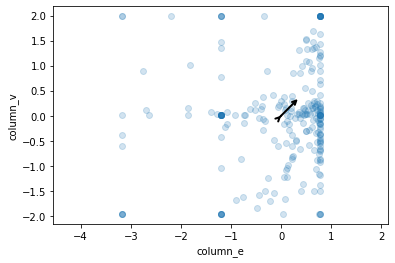

Explained variance = [0.8223436463906109, 0.4770319942870226]
Components = [0.0009323281055461127, 0.16139635864988555]
Mean = [-3.8789833023638124e-16, -5.437827059388522e-17]


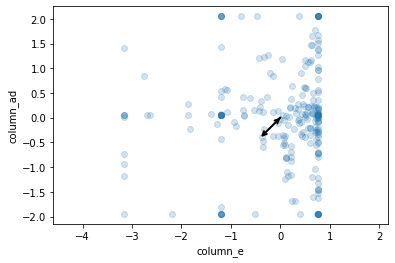

Explained variance = [0.8223436463906109, 0.4185193951809043]
Components = [0.0009323281055461127, -0.201081312912407]
Mean = [-3.8789833023638124e-16, -3.7702267611760416e-16]


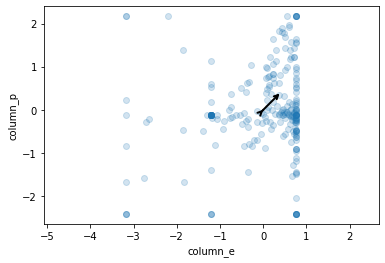

Explained variance = [0.8223436463906109, 0.3926342387071242]
Components = [0.0009323281055461127, 0.20336865374115512]
Mean = [-3.8789833023638124e-16, 7.250436079184696e-18]


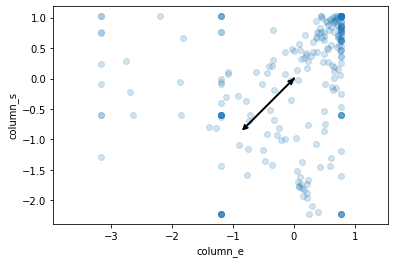

Explained variance = [0.8223436463906109, 0.36064540906532044]
Components = [0.0009323281055461127, -0.4754902900511677]
Mean = [-3.8789833023638124e-16, 1.740104659004327e-16]


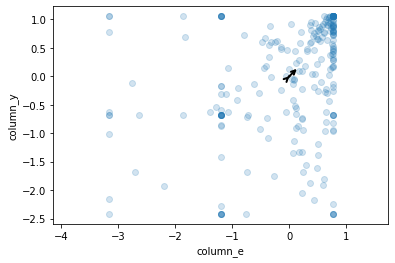

Explained variance = [0.8223436463906109, 0.30848347466117204]
Components = [0.0009323281055461127, 0.07851416278657723]
Mean = [-3.8789833023638124e-16, 3.6252180395923476e-17]


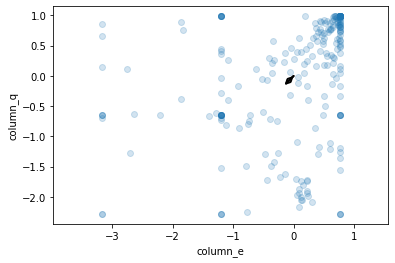

Explained variance = [0.8223436463906109, 0.2788723726352035]
Components = [0.0009323281055461127, -0.0953943872992796]
Mean = [-3.8789833023638124e-16, 5.075305255429287e-17]


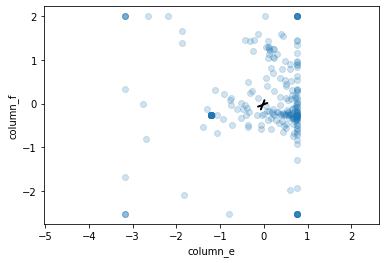

Explained variance = [0.8223436463906109, 0.2589385263862628]
Components = [0.0009323281055461127, -0.03503640384300756]
Mean = [-3.8789833023638124e-16, 1.812609019796174e-18]


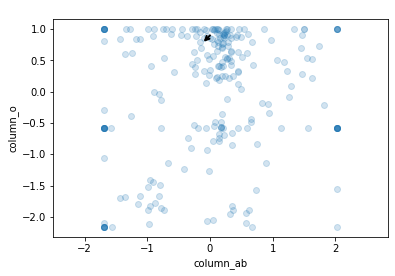

Explained variance = [0.8106464691360841, 9.045686775921455]
Components = [0.17729576748331272, -0.011141246153571102]
Mean = [-1.812609019796174e-18, 0.8979591836734694]


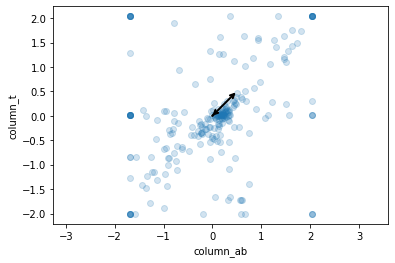

Explained variance = [0.8106464691360841, 4.457470867946926]
Components = [0.17729576748331272, -6.245004513516506e-17]
Mean = [-1.812609019796174e-18, 0.0]


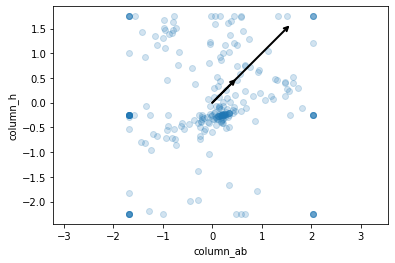

Explained variance = [0.8106464691360841, 2.822350997931873]
Components = [0.17729576748331272, 0.3102780597669046]
Mean = [-1.812609019796174e-18, -2.1751308237554087e-16]


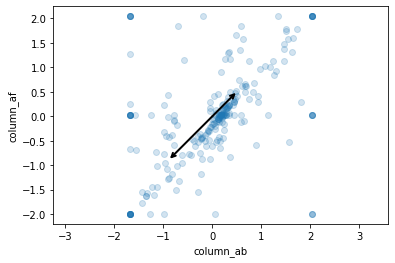

Explained variance = [0.8106464691360841, 2.157580027592784]
Components = [0.17729576748331272, -0.19653764888187195]
Mean = [-1.812609019796174e-18, 1.4500872158369393e-17]


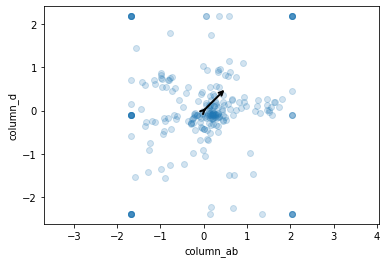

Explained variance = [0.8106464691360841, 1.9798933033287716]
Components = [0.17729576748331272, 0.012503558776654773]
Mean = [-1.812609019796174e-18, -1.1600697726695514e-16]


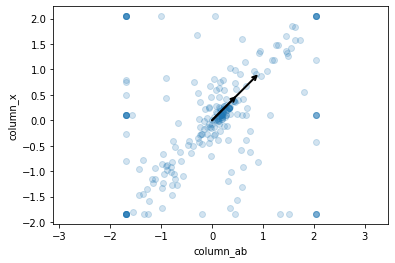

Explained variance = [0.8106464691360841, 1.186305218642031]
Components = [0.17729576748331272, 0.277000387808718]
Mean = [-1.812609019796174e-18, 8.700523295021634e-17]


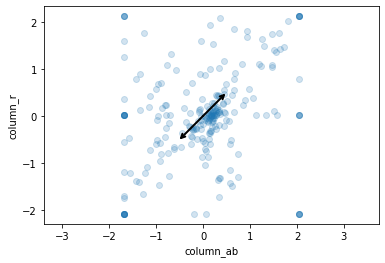

Explained variance = [0.8106464691360841, 1.06450357671577]
Components = [0.17729576748331272, -0.16270202413237378]
Mean = [-1.812609019796174e-18, -3.9877398435515827e-16]


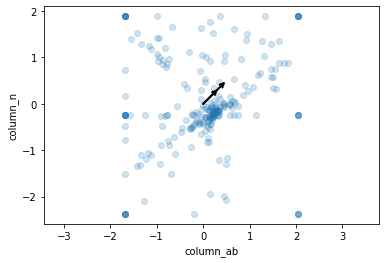

Explained variance = [0.8106464691360841, 0.9663858659383975]
Components = [0.17729576748331272, 0.10790050453517153]
Mean = [-1.812609019796174e-18, 2.718913529694261e-17]


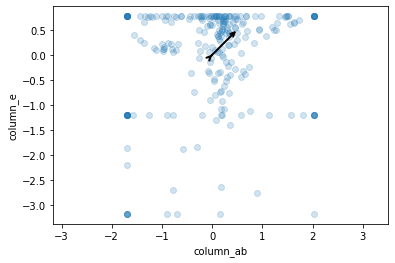

Explained variance = [0.8106464691360841, 0.8223436463906109]
Components = [0.17729576748331272, 0.0009323281055461127]
Mean = [-1.812609019796174e-18, -3.8789833023638124e-16]


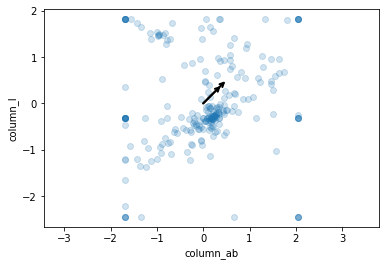

Explained variance = [0.8106464691360841, 0.6904475095535513]
Components = [0.17729576748331272, 0.15191473023488347]
Mean = [-1.812609019796174e-18, -1.8851133805880208e-16]


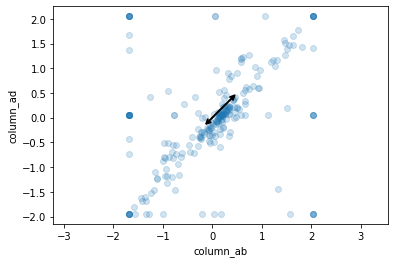

Explained variance = [0.8106464691360841, 0.6571354092729098]
Components = [0.17729576748331272, -0.06219276085082239]
Mean = [-1.812609019796174e-18, -1.450087215836939e-16]


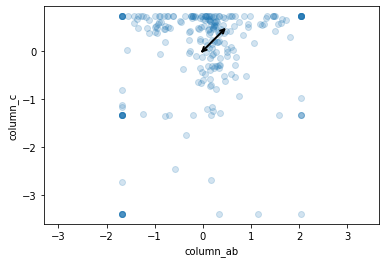

Explained variance = [0.8106464691360841, 0.5650664430011808]
Components = [0.17729576748331272, -0.01849375523188338]
Mean = [-1.812609019796174e-18, -2.6101569885064907e-16]


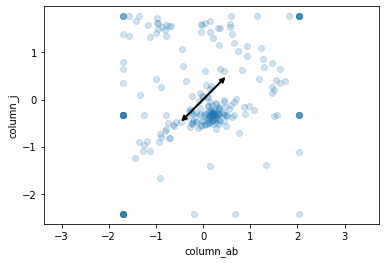

Explained variance = [0.8106464691360841, 0.5330852327996964]
Components = [0.17729576748331272, -0.21202851851721957]
Mean = [-1.812609019796174e-18, 7.975479687103165e-17]


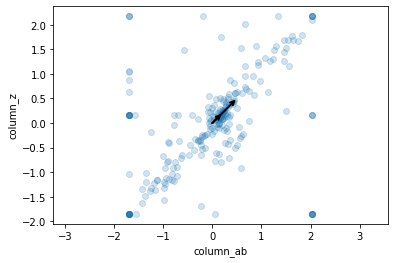

Explained variance = [0.8106464691360841, 0.5101953831380778]
Components = [0.17729576748331272, 0.08716929481142828]
Mean = [-1.812609019796174e-18, -4.604026910282282e-16]


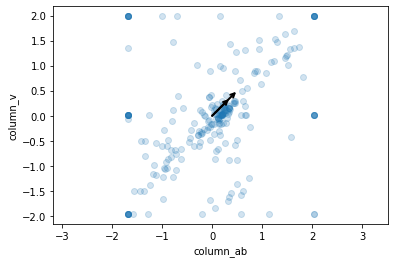

Explained variance = [0.8106464691360841, 0.4770319942870226]
Components = [0.17729576748331272, 0.16139635864988555]
Mean = [-1.812609019796174e-18, -5.437827059388522e-17]


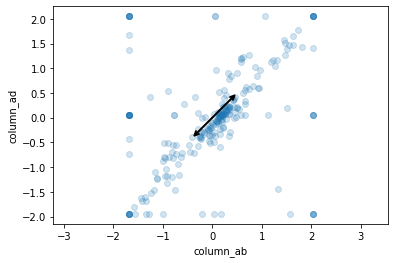

Explained variance = [0.8106464691360841, 0.4185193951809043]
Components = [0.17729576748331272, -0.201081312912407]
Mean = [-1.812609019796174e-18, -3.7702267611760416e-16]


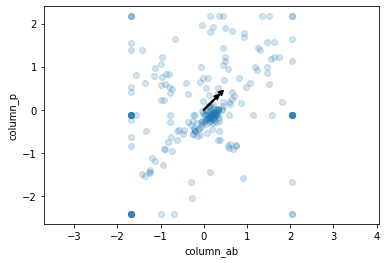

Explained variance = [0.8106464691360841, 0.3926342387071242]
Components = [0.17729576748331272, 0.20336865374115512]
Mean = [-1.812609019796174e-18, 7.250436079184696e-18]


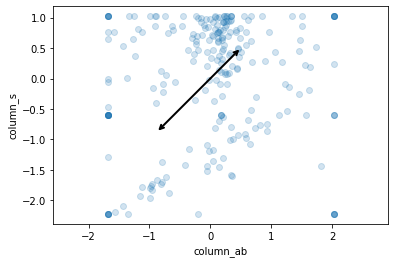

Explained variance = [0.8106464691360841, 0.36064540906532044]
Components = [0.17729576748331272, -0.4754902900511677]
Mean = [-1.812609019796174e-18, 1.740104659004327e-16]


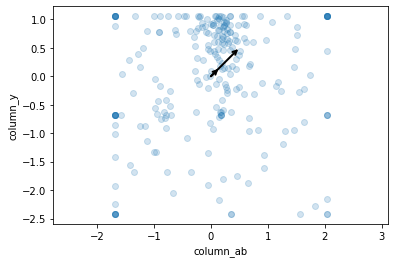

Explained variance = [0.8106464691360841, 0.30848347466117204]
Components = [0.17729576748331272, 0.07851416278657723]
Mean = [-1.812609019796174e-18, 3.6252180395923476e-17]


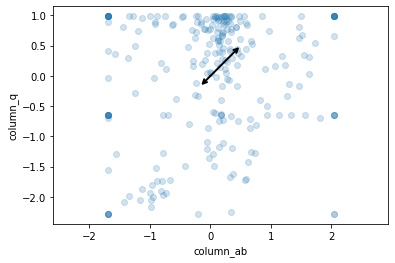

Explained variance = [0.8106464691360841, 0.2788723726352035]
Components = [0.17729576748331272, -0.0953943872992796]
Mean = [-1.812609019796174e-18, 5.075305255429287e-17]


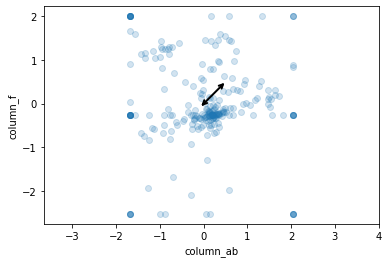

Explained variance = [0.8106464691360841, 0.2589385263862628]
Components = [0.17729576748331272, -0.03503640384300756]
Mean = [-1.812609019796174e-18, 1.812609019796174e-18]


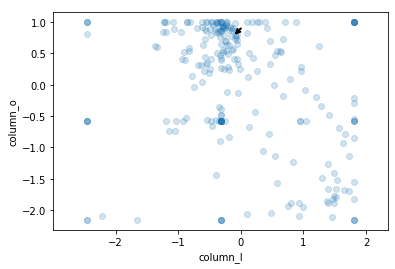

Explained variance = [0.6904475095535513, 9.045686775921455]
Components = [0.15191473023488347, -0.011141246153571102]
Mean = [-1.8851133805880208e-16, 0.8979591836734694]


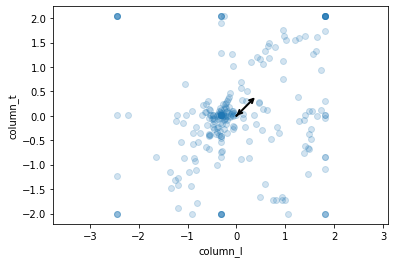

Explained variance = [0.6904475095535513, 4.457470867946926]
Components = [0.15191473023488347, -6.245004513516506e-17]
Mean = [-1.8851133805880208e-16, 0.0]


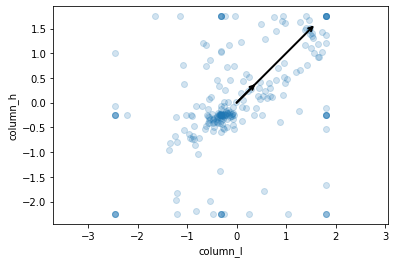

Explained variance = [0.6904475095535513, 2.822350997931873]
Components = [0.15191473023488347, 0.3102780597669046]
Mean = [-1.8851133805880208e-16, -2.1751308237554087e-16]


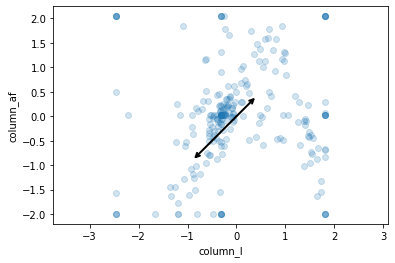

Explained variance = [0.6904475095535513, 2.157580027592784]
Components = [0.15191473023488347, -0.19653764888187195]
Mean = [-1.8851133805880208e-16, 1.4500872158369393e-17]


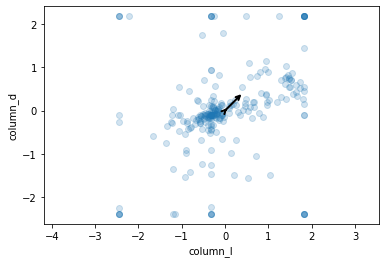

Explained variance = [0.6904475095535513, 1.9798933033287716]
Components = [0.15191473023488347, 0.012503558776654773]
Mean = [-1.8851133805880208e-16, -1.1600697726695514e-16]


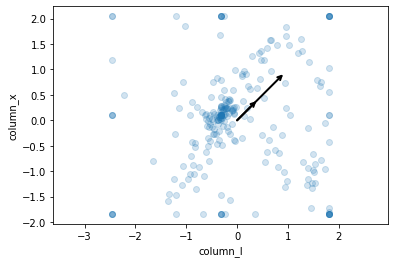

Explained variance = [0.6904475095535513, 1.186305218642031]
Components = [0.15191473023488347, 0.277000387808718]
Mean = [-1.8851133805880208e-16, 8.700523295021634e-17]


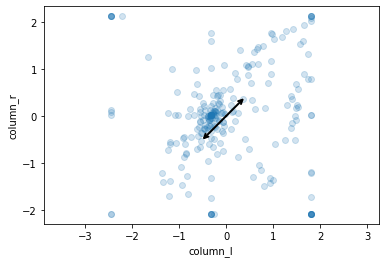

Explained variance = [0.6904475095535513, 1.06450357671577]
Components = [0.15191473023488347, -0.16270202413237378]
Mean = [-1.8851133805880208e-16, -3.9877398435515827e-16]


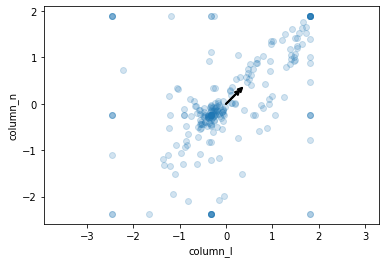

Explained variance = [0.6904475095535513, 0.9663858659383975]
Components = [0.15191473023488347, 0.10790050453517153]
Mean = [-1.8851133805880208e-16, 2.718913529694261e-17]


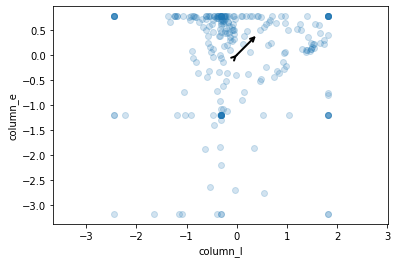

Explained variance = [0.6904475095535513, 0.8223436463906109]
Components = [0.15191473023488347, 0.0009323281055461127]
Mean = [-1.8851133805880208e-16, -3.8789833023638124e-16]


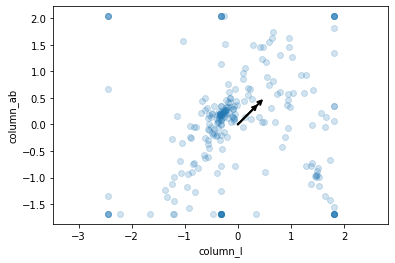

Explained variance = [0.6904475095535513, 0.8106464691360841]
Components = [0.15191473023488347, 0.17729576748331272]
Mean = [-1.8851133805880208e-16, -1.812609019796174e-18]


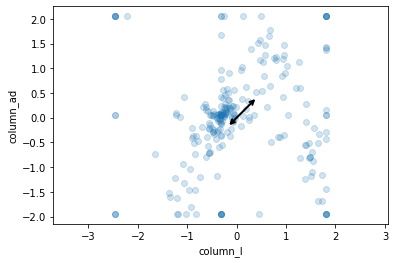

Explained variance = [0.6904475095535513, 0.6571354092729098]
Components = [0.15191473023488347, -0.06219276085082239]
Mean = [-1.8851133805880208e-16, -1.450087215836939e-16]


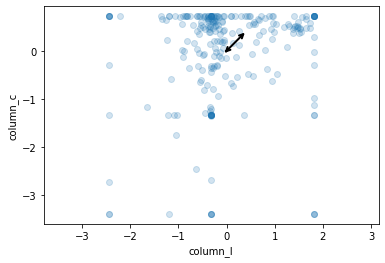

Explained variance = [0.6904475095535513, 0.5650664430011808]
Components = [0.15191473023488347, -0.01849375523188338]
Mean = [-1.8851133805880208e-16, -2.6101569885064907e-16]


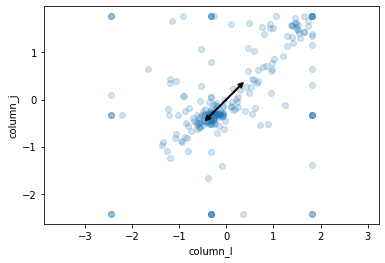

Explained variance = [0.6904475095535513, 0.5330852327996964]
Components = [0.15191473023488347, -0.21202851851721957]
Mean = [-1.8851133805880208e-16, 7.975479687103165e-17]


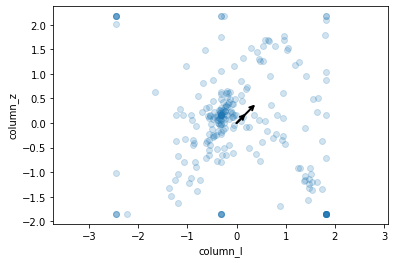

Explained variance = [0.6904475095535513, 0.5101953831380778]
Components = [0.15191473023488347, 0.08716929481142828]
Mean = [-1.8851133805880208e-16, -4.604026910282282e-16]


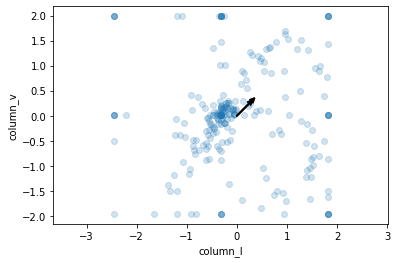

Explained variance = [0.6904475095535513, 0.4770319942870226]
Components = [0.15191473023488347, 0.16139635864988555]
Mean = [-1.8851133805880208e-16, -5.437827059388522e-17]


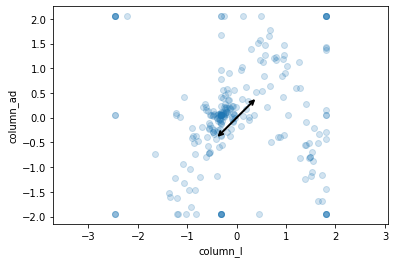

Explained variance = [0.6904475095535513, 0.4185193951809043]
Components = [0.15191473023488347, -0.201081312912407]
Mean = [-1.8851133805880208e-16, -3.7702267611760416e-16]


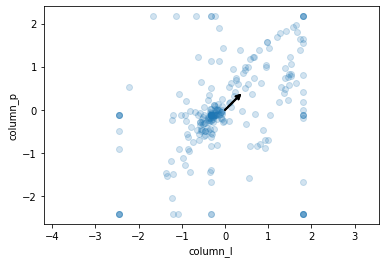

Explained variance = [0.6904475095535513, 0.3926342387071242]
Components = [0.15191473023488347, 0.20336865374115512]
Mean = [-1.8851133805880208e-16, 7.250436079184696e-18]


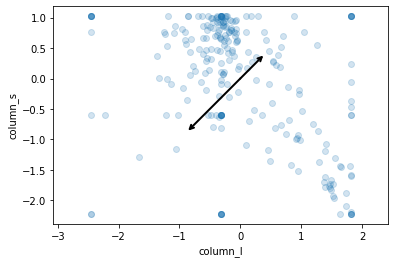

Explained variance = [0.6904475095535513, 0.36064540906532044]
Components = [0.15191473023488347, -0.4754902900511677]
Mean = [-1.8851133805880208e-16, 1.740104659004327e-16]


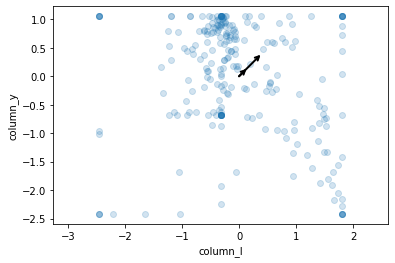

Explained variance = [0.6904475095535513, 0.30848347466117204]
Components = [0.15191473023488347, 0.07851416278657723]
Mean = [-1.8851133805880208e-16, 3.6252180395923476e-17]


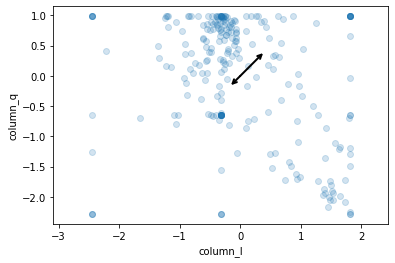

Explained variance = [0.6904475095535513, 0.2788723726352035]
Components = [0.15191473023488347, -0.0953943872992796]
Mean = [-1.8851133805880208e-16, 5.075305255429287e-17]


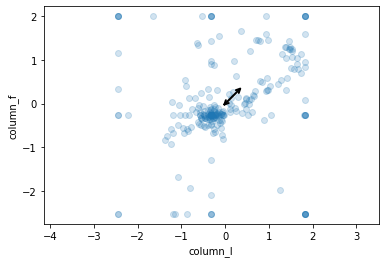

Explained variance = [0.6904475095535513, 0.2589385263862628]
Components = [0.15191473023488347, -0.03503640384300756]
Mean = [-1.8851133805880208e-16, 1.812609019796174e-18]


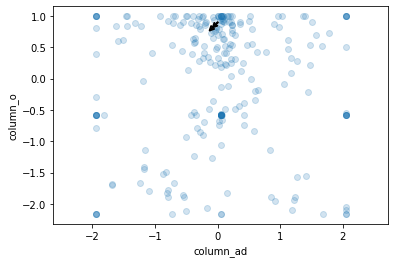

Explained variance = [0.6571354092729098, 9.045686775921455]
Components = [-0.06219276085082239, -0.011141246153571102]
Mean = [-1.450087215836939e-16, 0.8979591836734694]


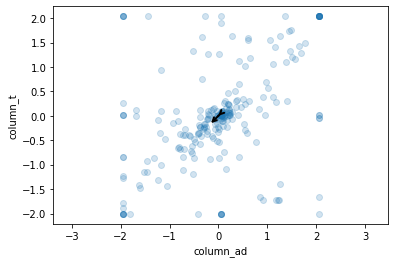

Explained variance = [0.6571354092729098, 4.457470867946926]
Components = [-0.06219276085082239, -6.245004513516506e-17]
Mean = [-1.450087215836939e-16, 0.0]


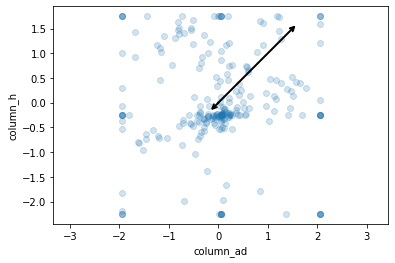

Explained variance = [0.6571354092729098, 2.822350997931873]
Components = [-0.06219276085082239, 0.3102780597669046]
Mean = [-1.450087215836939e-16, -2.1751308237554087e-16]


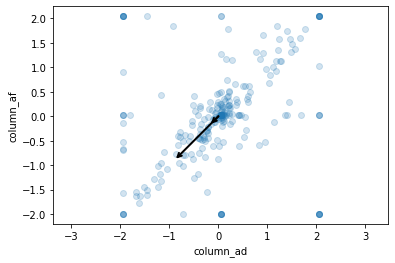

Explained variance = [0.6571354092729098, 2.157580027592784]
Components = [-0.06219276085082239, -0.19653764888187195]
Mean = [-1.450087215836939e-16, 1.4500872158369393e-17]


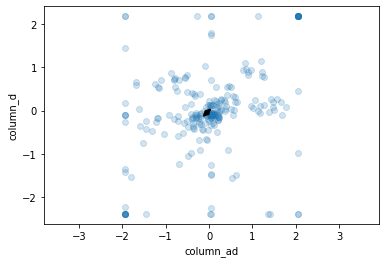

Explained variance = [0.6571354092729098, 1.9798933033287716]
Components = [-0.06219276085082239, 0.012503558776654773]
Mean = [-1.450087215836939e-16, -1.1600697726695514e-16]


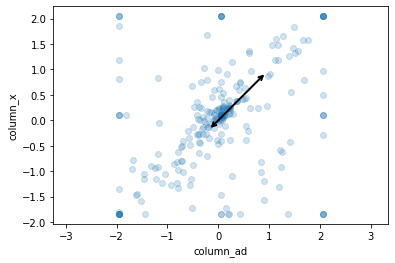

Explained variance = [0.6571354092729098, 1.186305218642031]
Components = [-0.06219276085082239, 0.277000387808718]
Mean = [-1.450087215836939e-16, 8.700523295021634e-17]


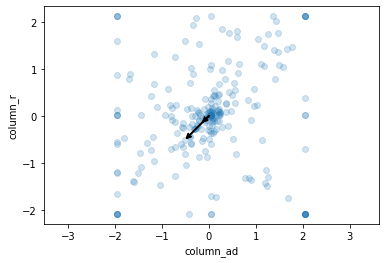

Explained variance = [0.6571354092729098, 1.06450357671577]
Components = [-0.06219276085082239, -0.16270202413237378]
Mean = [-1.450087215836939e-16, -3.9877398435515827e-16]


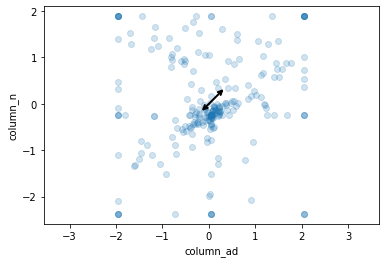

Explained variance = [0.6571354092729098, 0.9663858659383975]
Components = [-0.06219276085082239, 0.10790050453517153]
Mean = [-1.450087215836939e-16, 2.718913529694261e-17]


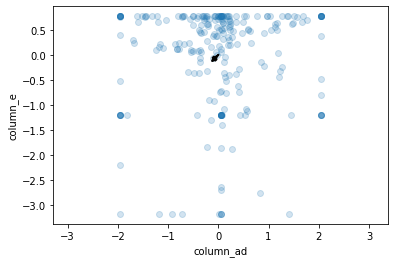

Explained variance = [0.6571354092729098, 0.8223436463906109]
Components = [-0.06219276085082239, 0.0009323281055461127]
Mean = [-1.450087215836939e-16, -3.8789833023638124e-16]


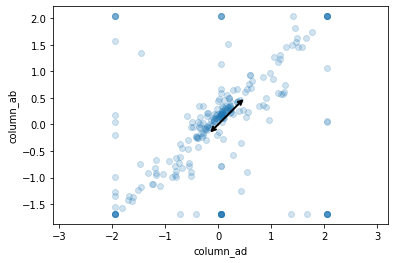

Explained variance = [0.6571354092729098, 0.8106464691360841]
Components = [-0.06219276085082239, 0.17729576748331272]
Mean = [-1.450087215836939e-16, -1.812609019796174e-18]


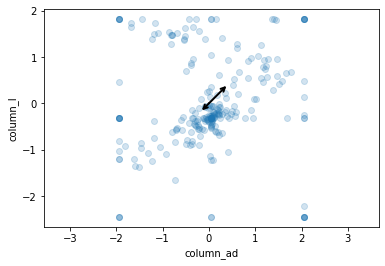

Explained variance = [0.6571354092729098, 0.6904475095535513]
Components = [-0.06219276085082239, 0.15191473023488347]
Mean = [-1.450087215836939e-16, -1.8851133805880208e-16]


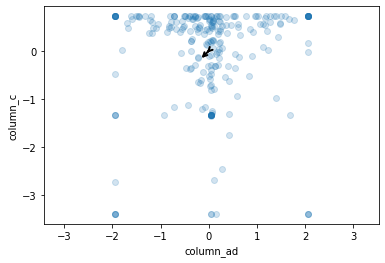

Explained variance = [0.6571354092729098, 0.5650664430011808]
Components = [-0.06219276085082239, -0.01849375523188338]
Mean = [-1.450087215836939e-16, -2.6101569885064907e-16]


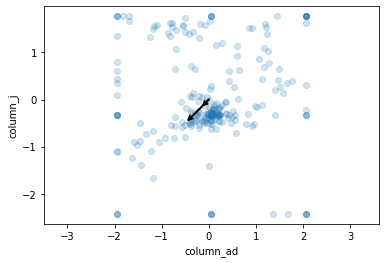

Explained variance = [0.6571354092729098, 0.5330852327996964]
Components = [-0.06219276085082239, -0.21202851851721957]
Mean = [-1.450087215836939e-16, 7.975479687103165e-17]


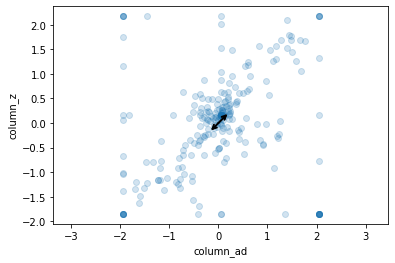

Explained variance = [0.6571354092729098, 0.5101953831380778]
Components = [-0.06219276085082239, 0.08716929481142828]
Mean = [-1.450087215836939e-16, -4.604026910282282e-16]


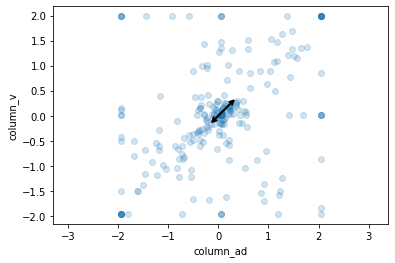

Explained variance = [0.6571354092729098, 0.4770319942870226]
Components = [-0.06219276085082239, 0.16139635864988555]
Mean = [-1.450087215836939e-16, -5.437827059388522e-17]


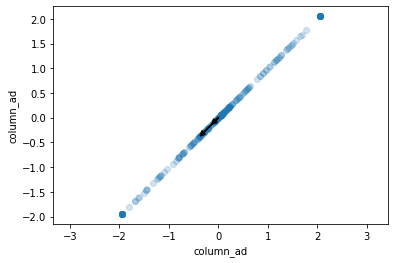

Explained variance = [0.6571354092729098, 0.4185193951809043]
Components = [-0.06219276085082239, -0.201081312912407]
Mean = [-1.450087215836939e-16, -3.7702267611760416e-16]


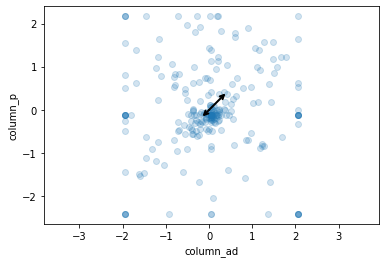

Explained variance = [0.6571354092729098, 0.3926342387071242]
Components = [-0.06219276085082239, 0.20336865374115512]
Mean = [-1.450087215836939e-16, 7.250436079184696e-18]


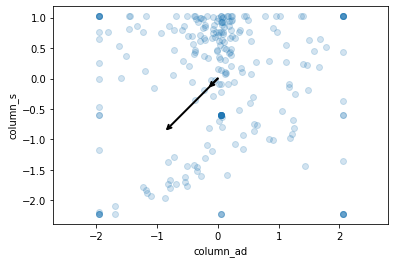

Explained variance = [0.6571354092729098, 0.36064540906532044]
Components = [-0.06219276085082239, -0.4754902900511677]
Mean = [-1.450087215836939e-16, 1.740104659004327e-16]


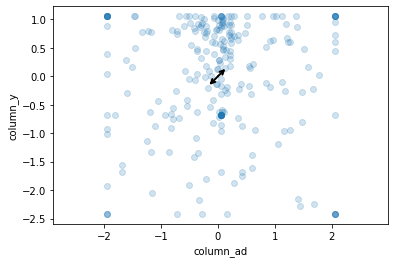

Explained variance = [0.6571354092729098, 0.30848347466117204]
Components = [-0.06219276085082239, 0.07851416278657723]
Mean = [-1.450087215836939e-16, 3.6252180395923476e-17]


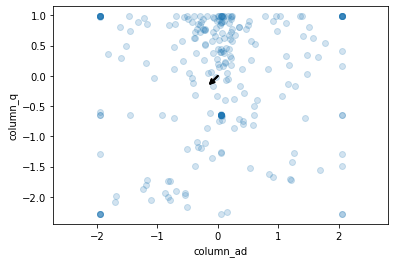

Explained variance = [0.6571354092729098, 0.2788723726352035]
Components = [-0.06219276085082239, -0.0953943872992796]
Mean = [-1.450087215836939e-16, 5.075305255429287e-17]


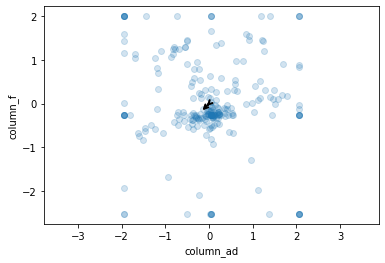

Explained variance = [0.6571354092729098, 0.2589385263862628]
Components = [-0.06219276085082239, -0.03503640384300756]
Mean = [-1.450087215836939e-16, 1.812609019796174e-18]


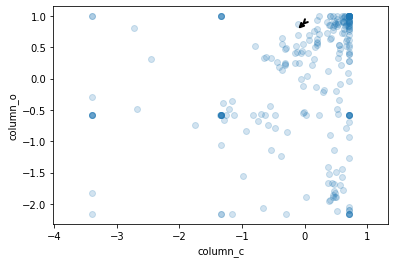

Explained variance = [0.5650664430011808, 9.045686775921455]
Components = [-0.01849375523188338, -0.011141246153571102]
Mean = [-2.6101569885064907e-16, 0.8979591836734694]


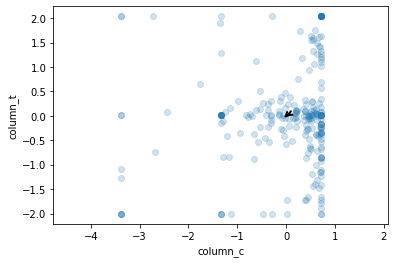

Explained variance = [0.5650664430011808, 4.457470867946926]
Components = [-0.01849375523188338, -6.245004513516506e-17]
Mean = [-2.6101569885064907e-16, 0.0]


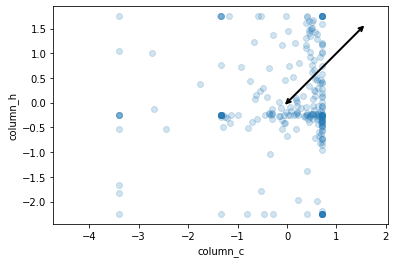

Explained variance = [0.5650664430011808, 2.822350997931873]
Components = [-0.01849375523188338, 0.3102780597669046]
Mean = [-2.6101569885064907e-16, -2.1751308237554087e-16]


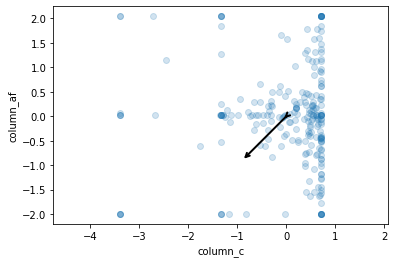

Explained variance = [0.5650664430011808, 2.157580027592784]
Components = [-0.01849375523188338, -0.19653764888187195]
Mean = [-2.6101569885064907e-16, 1.4500872158369393e-17]


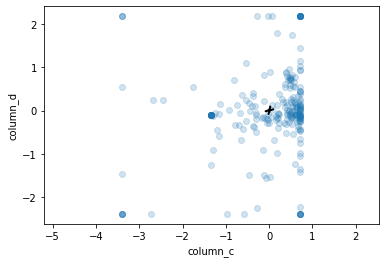

Explained variance = [0.5650664430011808, 1.9798933033287716]
Components = [-0.01849375523188338, 0.012503558776654773]
Mean = [-2.6101569885064907e-16, -1.1600697726695514e-16]


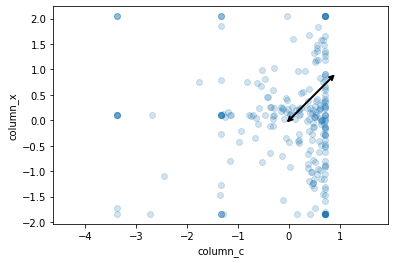

Explained variance = [0.5650664430011808, 1.186305218642031]
Components = [-0.01849375523188338, 0.277000387808718]
Mean = [-2.6101569885064907e-16, 8.700523295021634e-17]


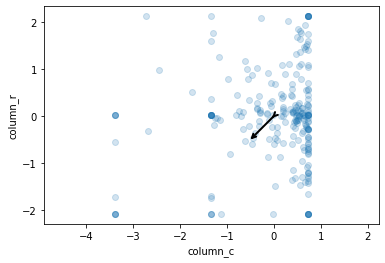

Explained variance = [0.5650664430011808, 1.06450357671577]
Components = [-0.01849375523188338, -0.16270202413237378]
Mean = [-2.6101569885064907e-16, -3.9877398435515827e-16]


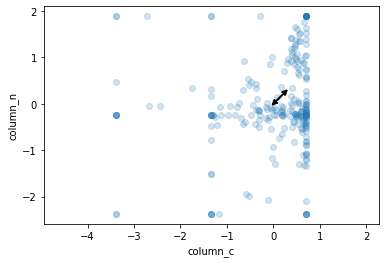

Explained variance = [0.5650664430011808, 0.9663858659383975]
Components = [-0.01849375523188338, 0.10790050453517153]
Mean = [-2.6101569885064907e-16, 2.718913529694261e-17]


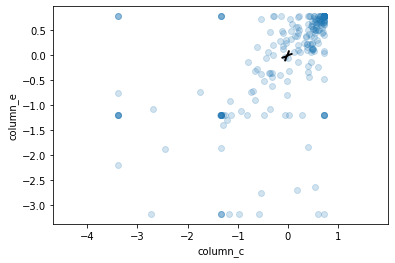

Explained variance = [0.5650664430011808, 0.8223436463906109]
Components = [-0.01849375523188338, 0.0009323281055461127]
Mean = [-2.6101569885064907e-16, -3.8789833023638124e-16]


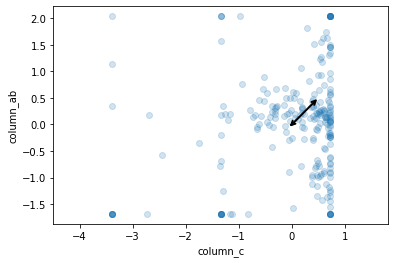

Explained variance = [0.5650664430011808, 0.8106464691360841]
Components = [-0.01849375523188338, 0.17729576748331272]
Mean = [-2.6101569885064907e-16, -1.812609019796174e-18]


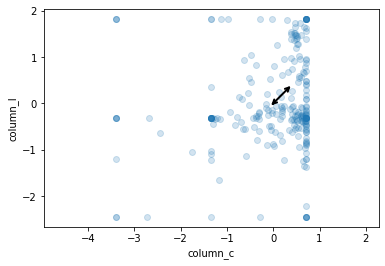

Explained variance = [0.5650664430011808, 0.6904475095535513]
Components = [-0.01849375523188338, 0.15191473023488347]
Mean = [-2.6101569885064907e-16, -1.8851133805880208e-16]


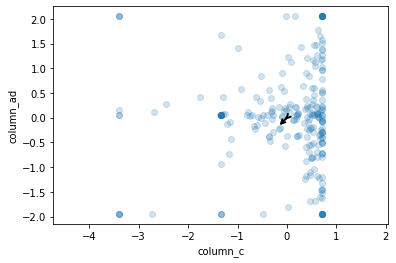

Explained variance = [0.5650664430011808, 0.6571354092729098]
Components = [-0.01849375523188338, -0.06219276085082239]
Mean = [-2.6101569885064907e-16, -1.450087215836939e-16]


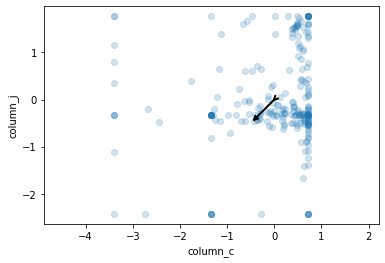

Explained variance = [0.5650664430011808, 0.5330852327996964]
Components = [-0.01849375523188338, -0.21202851851721957]
Mean = [-2.6101569885064907e-16, 7.975479687103165e-17]


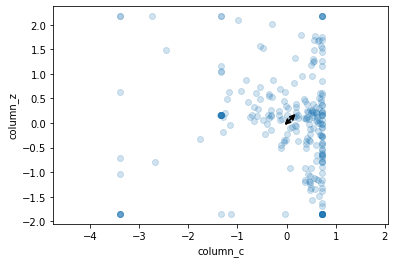

Explained variance = [0.5650664430011808, 0.5101953831380778]
Components = [-0.01849375523188338, 0.08716929481142828]
Mean = [-2.6101569885064907e-16, -4.604026910282282e-16]


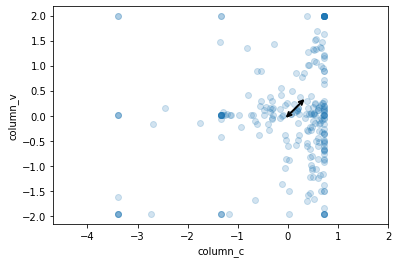

Explained variance = [0.5650664430011808, 0.4770319942870226]
Components = [-0.01849375523188338, 0.16139635864988555]
Mean = [-2.6101569885064907e-16, -5.437827059388522e-17]


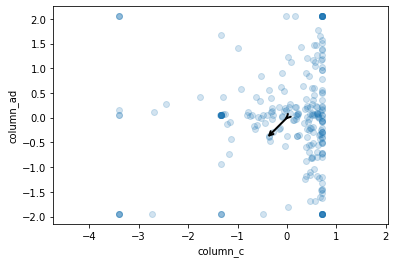

Explained variance = [0.5650664430011808, 0.4185193951809043]
Components = [-0.01849375523188338, -0.201081312912407]
Mean = [-2.6101569885064907e-16, -3.7702267611760416e-16]


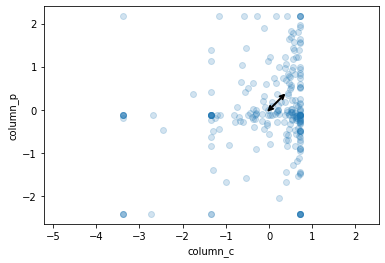

Explained variance = [0.5650664430011808, 0.3926342387071242]
Components = [-0.01849375523188338, 0.20336865374115512]
Mean = [-2.6101569885064907e-16, 7.250436079184696e-18]


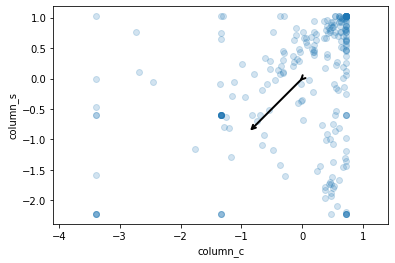

Explained variance = [0.5650664430011808, 0.36064540906532044]
Components = [-0.01849375523188338, -0.4754902900511677]
Mean = [-2.6101569885064907e-16, 1.740104659004327e-16]


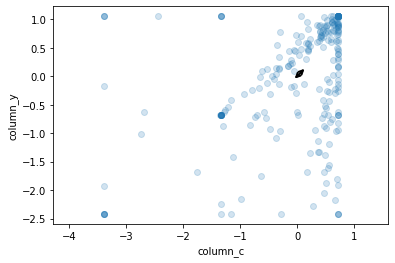

Explained variance = [0.5650664430011808, 0.30848347466117204]
Components = [-0.01849375523188338, 0.07851416278657723]
Mean = [-2.6101569885064907e-16, 3.6252180395923476e-17]


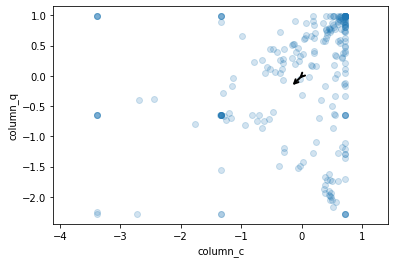

Explained variance = [0.5650664430011808, 0.2788723726352035]
Components = [-0.01849375523188338, -0.0953943872992796]
Mean = [-2.6101569885064907e-16, 5.075305255429287e-17]


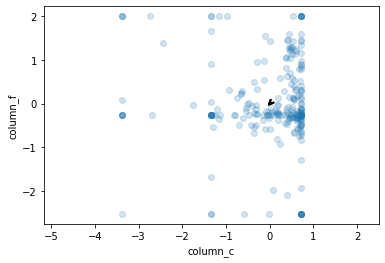

Explained variance = [0.5650664430011808, 0.2589385263862628]
Components = [-0.01849375523188338, -0.03503640384300756]
Mean = [-2.6101569885064907e-16, 1.812609019796174e-18]


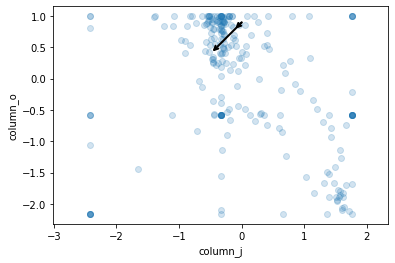

Explained variance = [0.5330852327996964, 9.045686775921455]
Components = [-0.21202851851721957, -0.011141246153571102]
Mean = [7.975479687103165e-17, 0.8979591836734694]


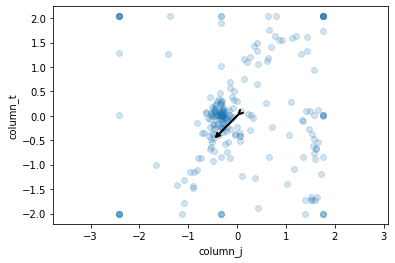

Explained variance = [0.5330852327996964, 4.457470867946926]
Components = [-0.21202851851721957, -6.245004513516506e-17]
Mean = [7.975479687103165e-17, 0.0]


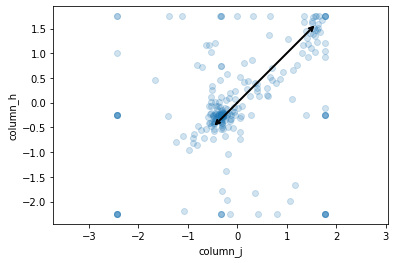

Explained variance = [0.5330852327996964, 2.822350997931873]
Components = [-0.21202851851721957, 0.3102780597669046]
Mean = [7.975479687103165e-17, -2.1751308237554087e-16]


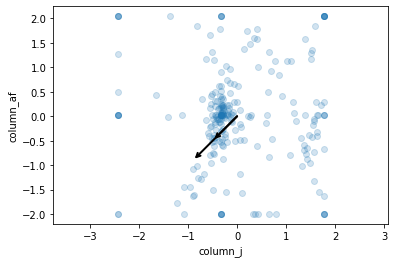

Explained variance = [0.5330852327996964, 2.157580027592784]
Components = [-0.21202851851721957, -0.19653764888187195]
Mean = [7.975479687103165e-17, 1.4500872158369393e-17]


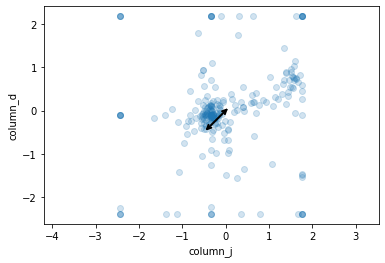

Explained variance = [0.5330852327996964, 1.9798933033287716]
Components = [-0.21202851851721957, 0.012503558776654773]
Mean = [7.975479687103165e-17, -1.1600697726695514e-16]


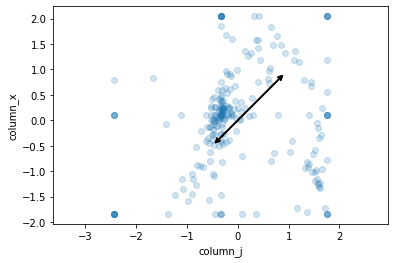

Explained variance = [0.5330852327996964, 1.186305218642031]
Components = [-0.21202851851721957, 0.277000387808718]
Mean = [7.975479687103165e-17, 8.700523295021634e-17]


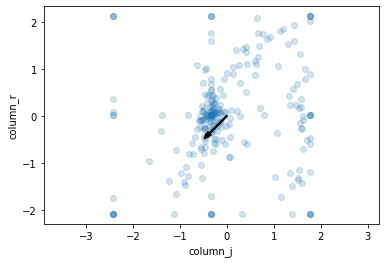

Explained variance = [0.5330852327996964, 1.06450357671577]
Components = [-0.21202851851721957, -0.16270202413237378]
Mean = [7.975479687103165e-17, -3.9877398435515827e-16]


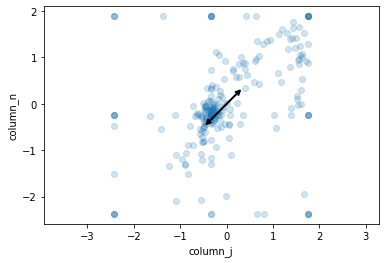

Explained variance = [0.5330852327996964, 0.9663858659383975]
Components = [-0.21202851851721957, 0.10790050453517153]
Mean = [7.975479687103165e-17, 2.718913529694261e-17]


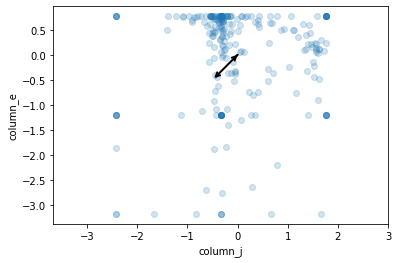

Explained variance = [0.5330852327996964, 0.8223436463906109]
Components = [-0.21202851851721957, 0.0009323281055461127]
Mean = [7.975479687103165e-17, -3.8789833023638124e-16]


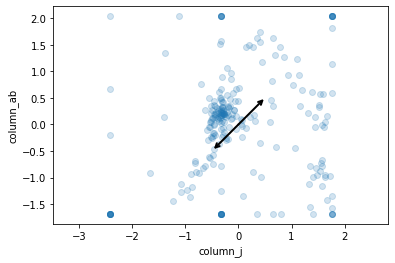

Explained variance = [0.5330852327996964, 0.8106464691360841]
Components = [-0.21202851851721957, 0.17729576748331272]
Mean = [7.975479687103165e-17, -1.812609019796174e-18]


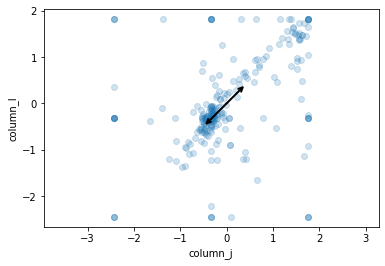

Explained variance = [0.5330852327996964, 0.6904475095535513]
Components = [-0.21202851851721957, 0.15191473023488347]
Mean = [7.975479687103165e-17, -1.8851133805880208e-16]


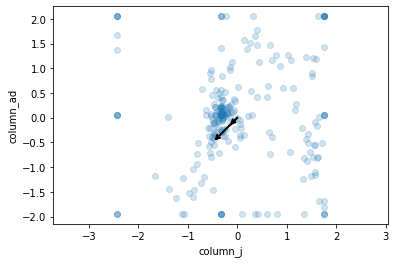

Explained variance = [0.5330852327996964, 0.6571354092729098]
Components = [-0.21202851851721957, -0.06219276085082239]
Mean = [7.975479687103165e-17, -1.450087215836939e-16]


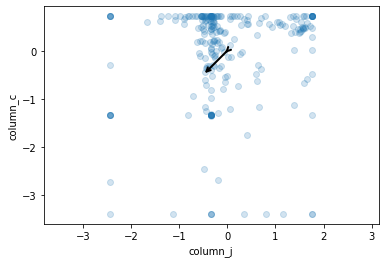

Explained variance = [0.5330852327996964, 0.5650664430011808]
Components = [-0.21202851851721957, -0.01849375523188338]
Mean = [7.975479687103165e-17, -2.6101569885064907e-16]


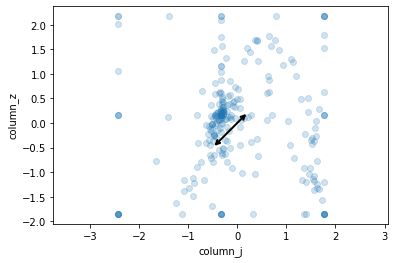

Explained variance = [0.5330852327996964, 0.5101953831380778]
Components = [-0.21202851851721957, 0.08716929481142828]
Mean = [7.975479687103165e-17, -4.604026910282282e-16]


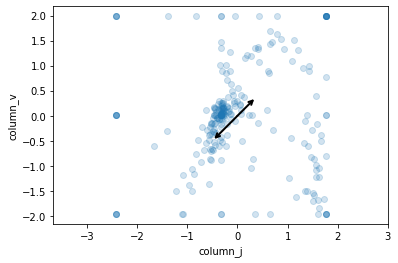

Explained variance = [0.5330852327996964, 0.4770319942870226]
Components = [-0.21202851851721957, 0.16139635864988555]
Mean = [7.975479687103165e-17, -5.437827059388522e-17]


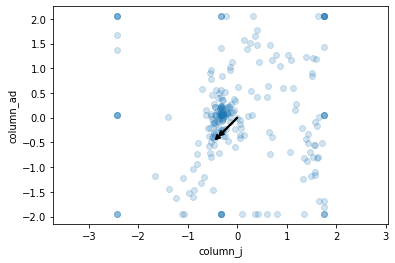

Explained variance = [0.5330852327996964, 0.4185193951809043]
Components = [-0.21202851851721957, -0.201081312912407]
Mean = [7.975479687103165e-17, -3.7702267611760416e-16]


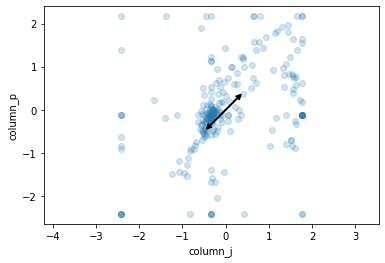

Explained variance = [0.5330852327996964, 0.3926342387071242]
Components = [-0.21202851851721957, 0.20336865374115512]
Mean = [7.975479687103165e-17, 7.250436079184696e-18]


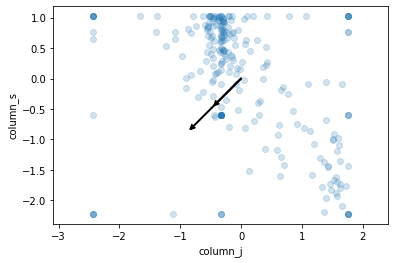

Explained variance = [0.5330852327996964, 0.36064540906532044]
Components = [-0.21202851851721957, -0.4754902900511677]
Mean = [7.975479687103165e-17, 1.740104659004327e-16]


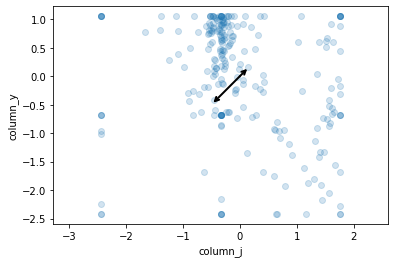

Explained variance = [0.5330852327996964, 0.30848347466117204]
Components = [-0.21202851851721957, 0.07851416278657723]
Mean = [7.975479687103165e-17, 3.6252180395923476e-17]


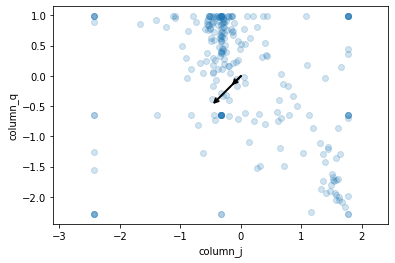

Explained variance = [0.5330852327996964, 0.2788723726352035]
Components = [-0.21202851851721957, -0.0953943872992796]
Mean = [7.975479687103165e-17, 5.075305255429287e-17]


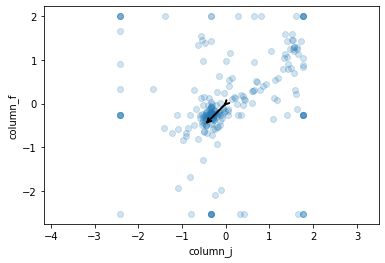

Explained variance = [0.5330852327996964, 0.2589385263862628]
Components = [-0.21202851851721957, -0.03503640384300756]
Mean = [7.975479687103165e-17, 1.812609019796174e-18]


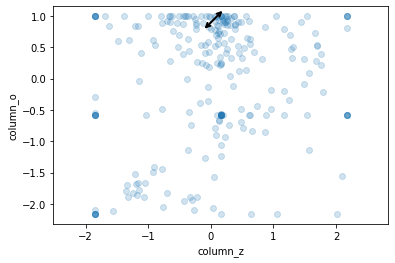

Explained variance = [0.5101953831380778, 9.045686775921455]
Components = [0.08716929481142828, -0.011141246153571102]
Mean = [-4.604026910282282e-16, 0.8979591836734694]


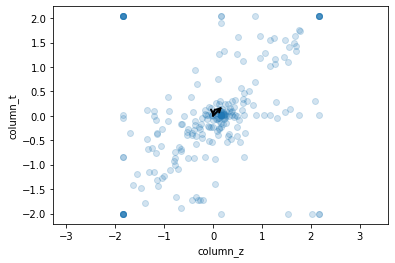

Explained variance = [0.5101953831380778, 4.457470867946926]
Components = [0.08716929481142828, -6.245004513516506e-17]
Mean = [-4.604026910282282e-16, 0.0]


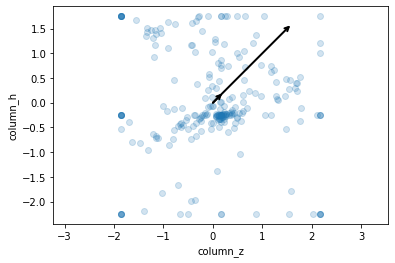

Explained variance = [0.5101953831380778, 2.822350997931873]
Components = [0.08716929481142828, 0.3102780597669046]
Mean = [-4.604026910282282e-16, -2.1751308237554087e-16]


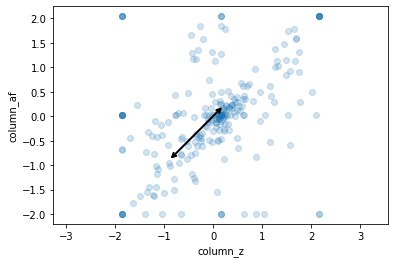

Explained variance = [0.5101953831380778, 2.157580027592784]
Components = [0.08716929481142828, -0.19653764888187195]
Mean = [-4.604026910282282e-16, 1.4500872158369393e-17]


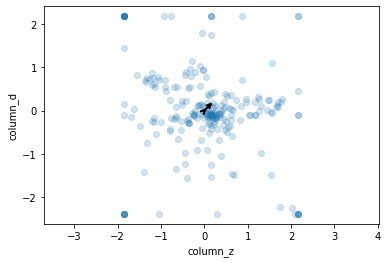

Explained variance = [0.5101953831380778, 1.9798933033287716]
Components = [0.08716929481142828, 0.012503558776654773]
Mean = [-4.604026910282282e-16, -1.1600697726695514e-16]


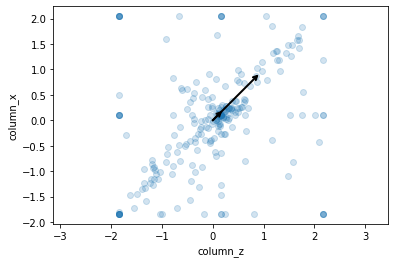

Explained variance = [0.5101953831380778, 1.186305218642031]
Components = [0.08716929481142828, 0.277000387808718]
Mean = [-4.604026910282282e-16, 8.700523295021634e-17]


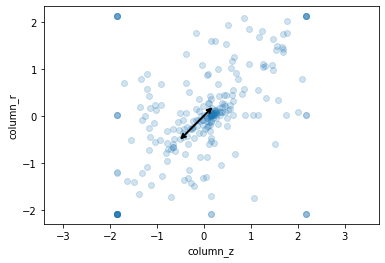

Explained variance = [0.5101953831380778, 1.06450357671577]
Components = [0.08716929481142828, -0.16270202413237378]
Mean = [-4.604026910282282e-16, -3.9877398435515827e-16]


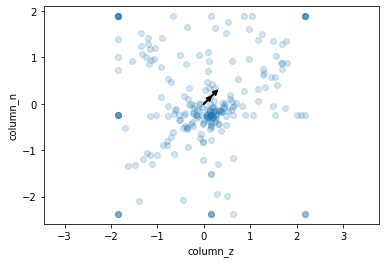

Explained variance = [0.5101953831380778, 0.9663858659383975]
Components = [0.08716929481142828, 0.10790050453517153]
Mean = [-4.604026910282282e-16, 2.718913529694261e-17]


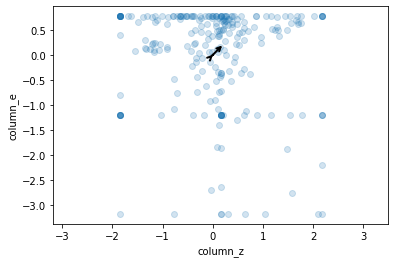

Explained variance = [0.5101953831380778, 0.8223436463906109]
Components = [0.08716929481142828, 0.0009323281055461127]
Mean = [-4.604026910282282e-16, -3.8789833023638124e-16]


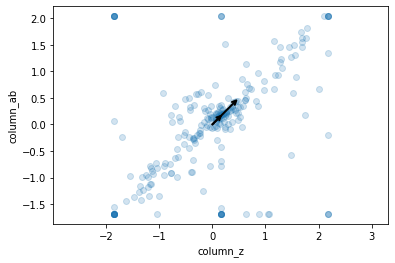

Explained variance = [0.5101953831380778, 0.8106464691360841]
Components = [0.08716929481142828, 0.17729576748331272]
Mean = [-4.604026910282282e-16, -1.812609019796174e-18]


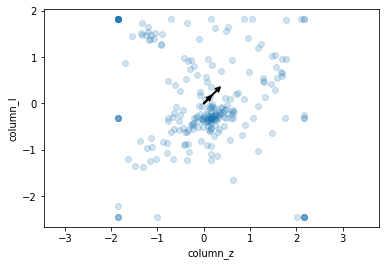

Explained variance = [0.5101953831380778, 0.6904475095535513]
Components = [0.08716929481142828, 0.15191473023488347]
Mean = [-4.604026910282282e-16, -1.8851133805880208e-16]


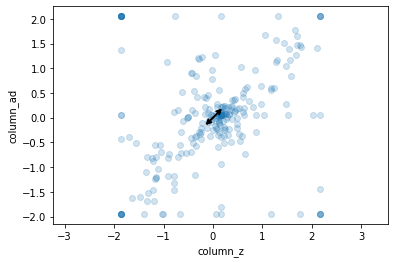

Explained variance = [0.5101953831380778, 0.6571354092729098]
Components = [0.08716929481142828, -0.06219276085082239]
Mean = [-4.604026910282282e-16, -1.450087215836939e-16]


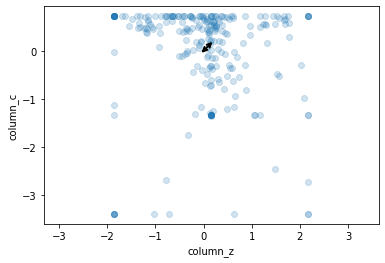

Explained variance = [0.5101953831380778, 0.5650664430011808]
Components = [0.08716929481142828, -0.01849375523188338]
Mean = [-4.604026910282282e-16, -2.6101569885064907e-16]


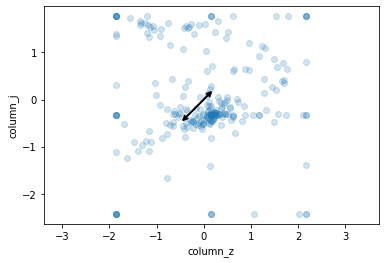

Explained variance = [0.5101953831380778, 0.5330852327996964]
Components = [0.08716929481142828, -0.21202851851721957]
Mean = [-4.604026910282282e-16, 7.975479687103165e-17]


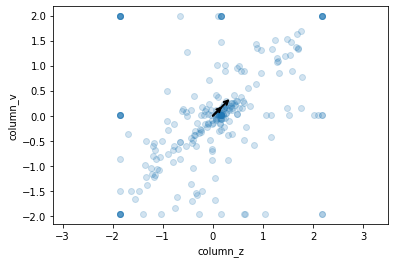

Explained variance = [0.5101953831380778, 0.4770319942870226]
Components = [0.08716929481142828, 0.16139635864988555]
Mean = [-4.604026910282282e-16, -5.437827059388522e-17]


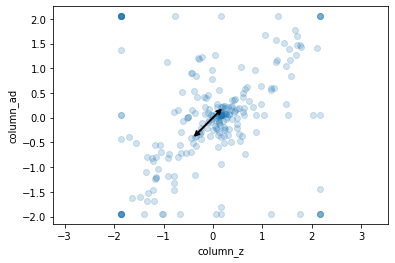

Explained variance = [0.5101953831380778, 0.4185193951809043]
Components = [0.08716929481142828, -0.201081312912407]
Mean = [-4.604026910282282e-16, -3.7702267611760416e-16]


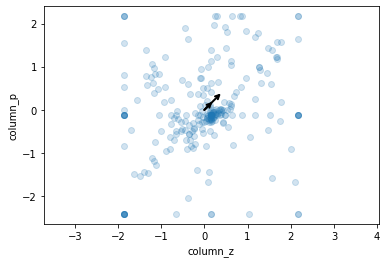

Explained variance = [0.5101953831380778, 0.3926342387071242]
Components = [0.08716929481142828, 0.20336865374115512]
Mean = [-4.604026910282282e-16, 7.250436079184696e-18]


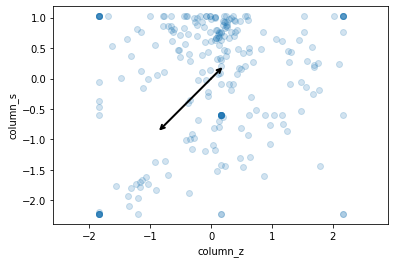

Explained variance = [0.5101953831380778, 0.36064540906532044]
Components = [0.08716929481142828, -0.4754902900511677]
Mean = [-4.604026910282282e-16, 1.740104659004327e-16]


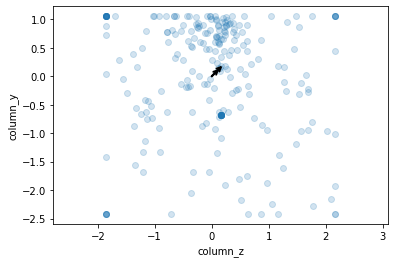

Explained variance = [0.5101953831380778, 0.30848347466117204]
Components = [0.08716929481142828, 0.07851416278657723]
Mean = [-4.604026910282282e-16, 3.6252180395923476e-17]


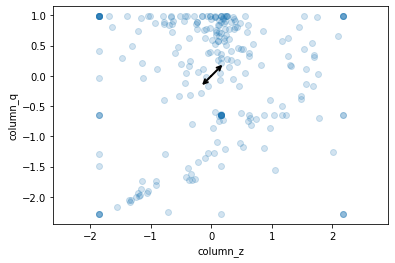

Explained variance = [0.5101953831380778, 0.2788723726352035]
Components = [0.08716929481142828, -0.0953943872992796]
Mean = [-4.604026910282282e-16, 5.075305255429287e-17]


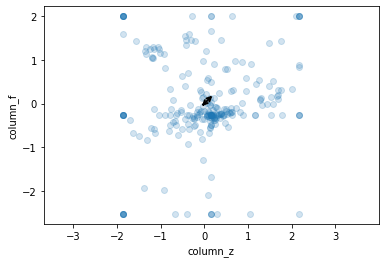

Explained variance = [0.5101953831380778, 0.2589385263862628]
Components = [0.08716929481142828, -0.03503640384300756]
Mean = [-4.604026910282282e-16, 1.812609019796174e-18]


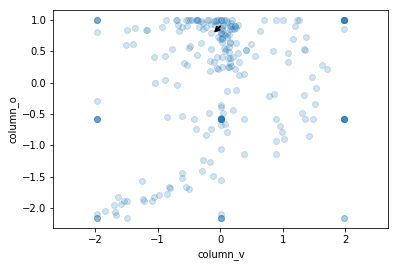

Explained variance = [0.4770319942870226, 9.045686775921455]
Components = [0.16139635864988555, -0.011141246153571102]
Mean = [-5.437827059388522e-17, 0.8979591836734694]


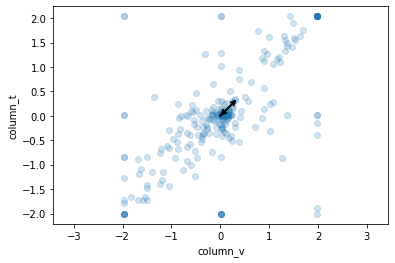

Explained variance = [0.4770319942870226, 4.457470867946926]
Components = [0.16139635864988555, -6.245004513516506e-17]
Mean = [-5.437827059388522e-17, 0.0]


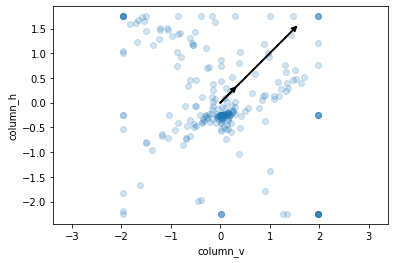

Explained variance = [0.4770319942870226, 2.822350997931873]
Components = [0.16139635864988555, 0.3102780597669046]
Mean = [-5.437827059388522e-17, -2.1751308237554087e-16]


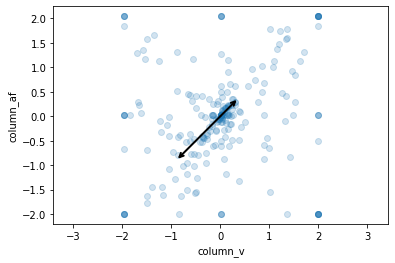

Explained variance = [0.4770319942870226, 2.157580027592784]
Components = [0.16139635864988555, -0.19653764888187195]
Mean = [-5.437827059388522e-17, 1.4500872158369393e-17]


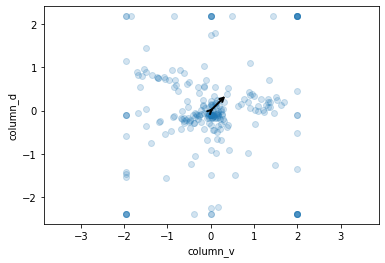

Explained variance = [0.4770319942870226, 1.9798933033287716]
Components = [0.16139635864988555, 0.012503558776654773]
Mean = [-5.437827059388522e-17, -1.1600697726695514e-16]


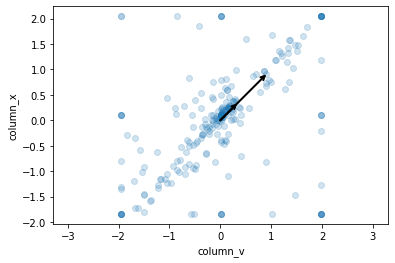

Explained variance = [0.4770319942870226, 1.186305218642031]
Components = [0.16139635864988555, 0.277000387808718]
Mean = [-5.437827059388522e-17, 8.700523295021634e-17]


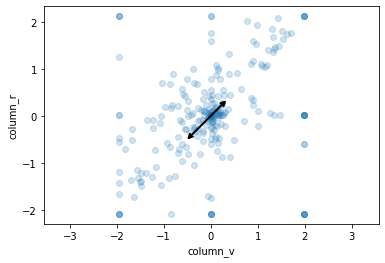

Explained variance = [0.4770319942870226, 1.06450357671577]
Components = [0.16139635864988555, -0.16270202413237378]
Mean = [-5.437827059388522e-17, -3.9877398435515827e-16]


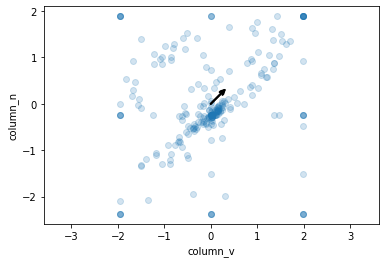

Explained variance = [0.4770319942870226, 0.9663858659383975]
Components = [0.16139635864988555, 0.10790050453517153]
Mean = [-5.437827059388522e-17, 2.718913529694261e-17]


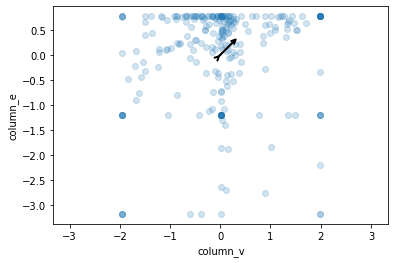

Explained variance = [0.4770319942870226, 0.8223436463906109]
Components = [0.16139635864988555, 0.0009323281055461127]
Mean = [-5.437827059388522e-17, -3.8789833023638124e-16]


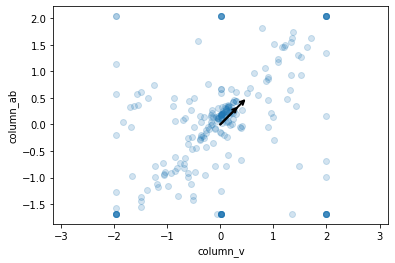

Explained variance = [0.4770319942870226, 0.8106464691360841]
Components = [0.16139635864988555, 0.17729576748331272]
Mean = [-5.437827059388522e-17, -1.812609019796174e-18]


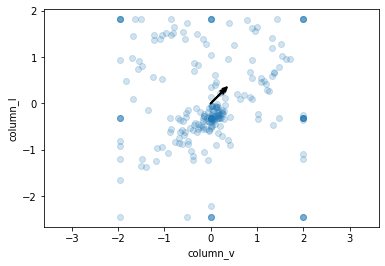

Explained variance = [0.4770319942870226, 0.6904475095535513]
Components = [0.16139635864988555, 0.15191473023488347]
Mean = [-5.437827059388522e-17, -1.8851133805880208e-16]


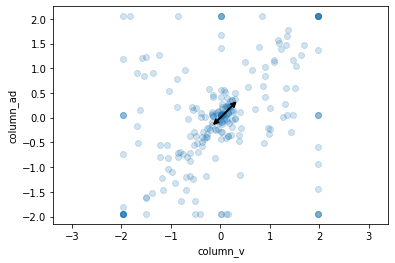

Explained variance = [0.4770319942870226, 0.6571354092729098]
Components = [0.16139635864988555, -0.06219276085082239]
Mean = [-5.437827059388522e-17, -1.450087215836939e-16]


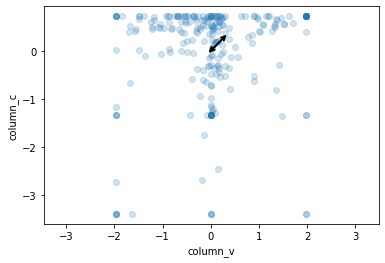

Explained variance = [0.4770319942870226, 0.5650664430011808]
Components = [0.16139635864988555, -0.01849375523188338]
Mean = [-5.437827059388522e-17, -2.6101569885064907e-16]


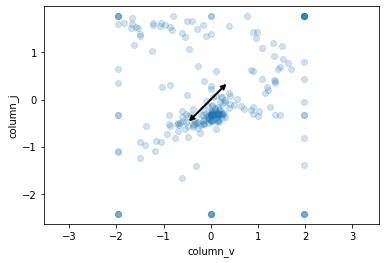

Explained variance = [0.4770319942870226, 0.5330852327996964]
Components = [0.16139635864988555, -0.21202851851721957]
Mean = [-5.437827059388522e-17, 7.975479687103165e-17]


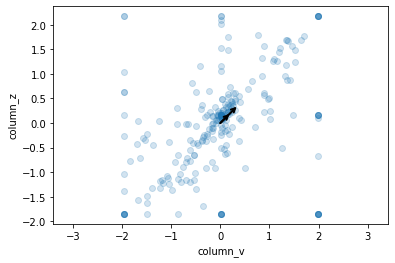

Explained variance = [0.4770319942870226, 0.5101953831380778]
Components = [0.16139635864988555, 0.08716929481142828]
Mean = [-5.437827059388522e-17, -4.604026910282282e-16]


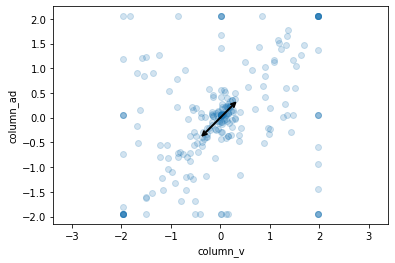

Explained variance = [0.4770319942870226, 0.4185193951809043]
Components = [0.16139635864988555, -0.201081312912407]
Mean = [-5.437827059388522e-17, -3.7702267611760416e-16]


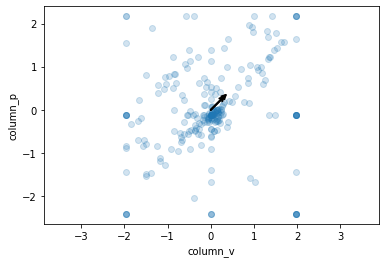

Explained variance = [0.4770319942870226, 0.3926342387071242]
Components = [0.16139635864988555, 0.20336865374115512]
Mean = [-5.437827059388522e-17, 7.250436079184696e-18]


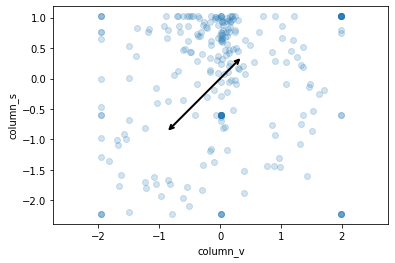

Explained variance = [0.4770319942870226, 0.36064540906532044]
Components = [0.16139635864988555, -0.4754902900511677]
Mean = [-5.437827059388522e-17, 1.740104659004327e-16]


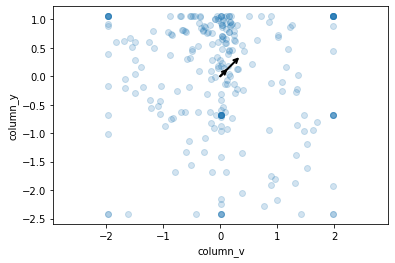

Explained variance = [0.4770319942870226, 0.30848347466117204]
Components = [0.16139635864988555, 0.07851416278657723]
Mean = [-5.437827059388522e-17, 3.6252180395923476e-17]


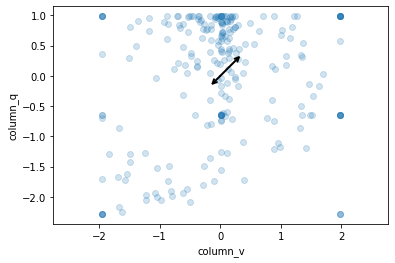

Explained variance = [0.4770319942870226, 0.2788723726352035]
Components = [0.16139635864988555, -0.0953943872992796]
Mean = [-5.437827059388522e-17, 5.075305255429287e-17]


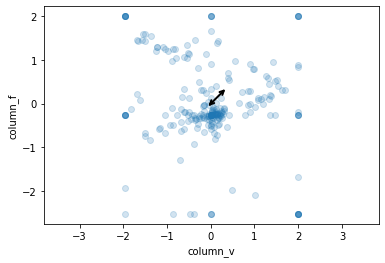

Explained variance = [0.4770319942870226, 0.2589385263862628]
Components = [0.16139635864988555, -0.03503640384300756]
Mean = [-5.437827059388522e-17, 1.812609019796174e-18]


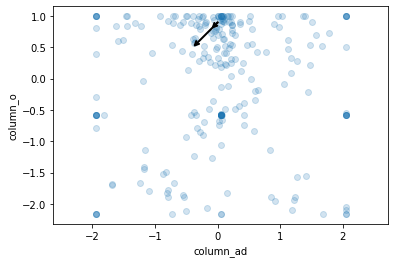

Explained variance = [0.4185193951809043, 9.045686775921455]
Components = [-0.201081312912407, -0.011141246153571102]
Mean = [-3.7702267611760416e-16, 0.8979591836734694]


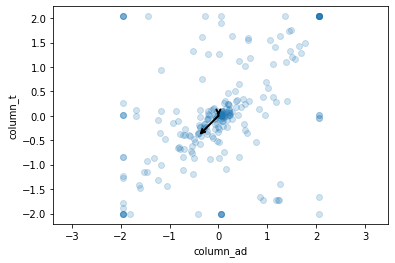

Explained variance = [0.4185193951809043, 4.457470867946926]
Components = [-0.201081312912407, -6.245004513516506e-17]
Mean = [-3.7702267611760416e-16, 0.0]


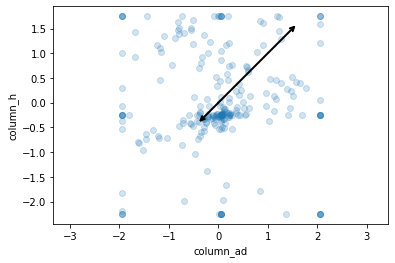

Explained variance = [0.4185193951809043, 2.822350997931873]
Components = [-0.201081312912407, 0.3102780597669046]
Mean = [-3.7702267611760416e-16, -2.1751308237554087e-16]


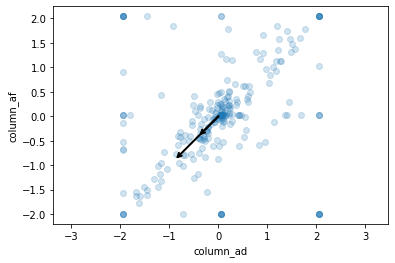

Explained variance = [0.4185193951809043, 2.157580027592784]
Components = [-0.201081312912407, -0.19653764888187195]
Mean = [-3.7702267611760416e-16, 1.4500872158369393e-17]


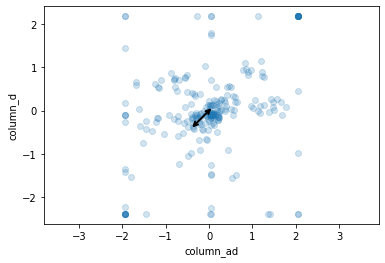

Explained variance = [0.4185193951809043, 1.9798933033287716]
Components = [-0.201081312912407, 0.012503558776654773]
Mean = [-3.7702267611760416e-16, -1.1600697726695514e-16]


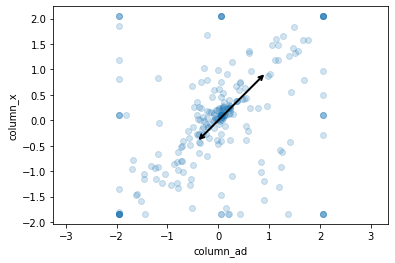

Explained variance = [0.4185193951809043, 1.186305218642031]
Components = [-0.201081312912407, 0.277000387808718]
Mean = [-3.7702267611760416e-16, 8.700523295021634e-17]


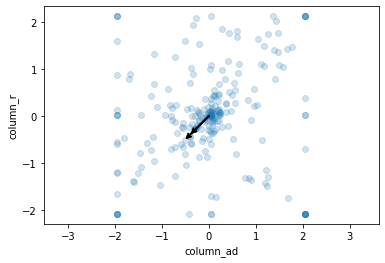

Explained variance = [0.4185193951809043, 1.06450357671577]
Components = [-0.201081312912407, -0.16270202413237378]
Mean = [-3.7702267611760416e-16, -3.9877398435515827e-16]


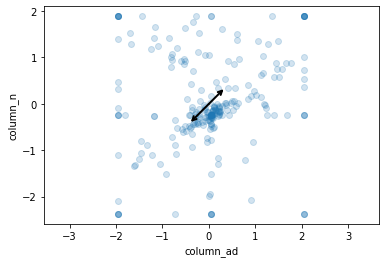

Explained variance = [0.4185193951809043, 0.9663858659383975]
Components = [-0.201081312912407, 0.10790050453517153]
Mean = [-3.7702267611760416e-16, 2.718913529694261e-17]


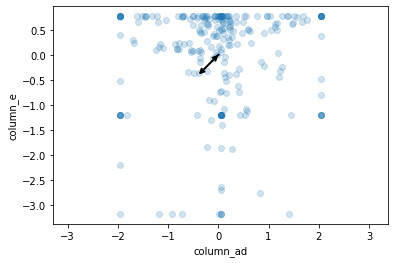

Explained variance = [0.4185193951809043, 0.8223436463906109]
Components = [-0.201081312912407, 0.0009323281055461127]
Mean = [-3.7702267611760416e-16, -3.8789833023638124e-16]


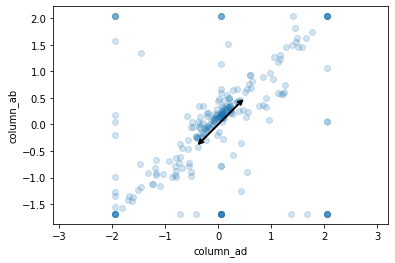

Explained variance = [0.4185193951809043, 0.8106464691360841]
Components = [-0.201081312912407, 0.17729576748331272]
Mean = [-3.7702267611760416e-16, -1.812609019796174e-18]


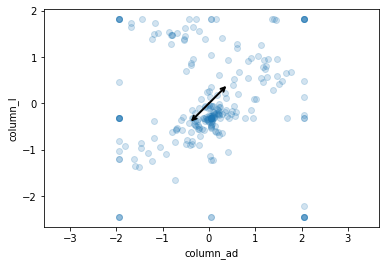

Explained variance = [0.4185193951809043, 0.6904475095535513]
Components = [-0.201081312912407, 0.15191473023488347]
Mean = [-3.7702267611760416e-16, -1.8851133805880208e-16]


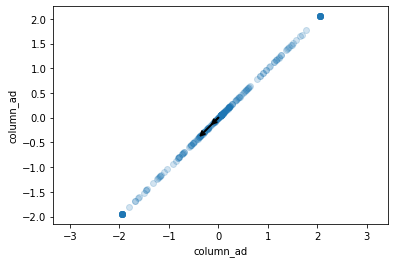

Explained variance = [0.4185193951809043, 0.6571354092729098]
Components = [-0.201081312912407, -0.06219276085082239]
Mean = [-3.7702267611760416e-16, -1.450087215836939e-16]


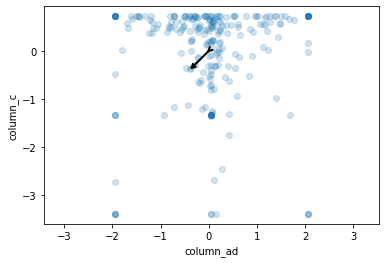

Explained variance = [0.4185193951809043, 0.5650664430011808]
Components = [-0.201081312912407, -0.01849375523188338]
Mean = [-3.7702267611760416e-16, -2.6101569885064907e-16]


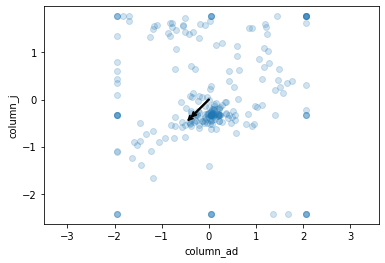

Explained variance = [0.4185193951809043, 0.5330852327996964]
Components = [-0.201081312912407, -0.21202851851721957]
Mean = [-3.7702267611760416e-16, 7.975479687103165e-17]


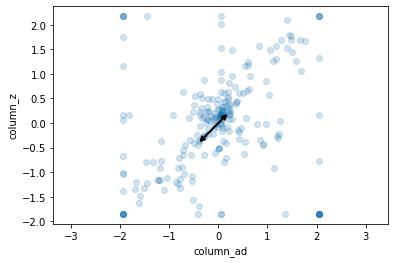

Explained variance = [0.4185193951809043, 0.5101953831380778]
Components = [-0.201081312912407, 0.08716929481142828]
Mean = [-3.7702267611760416e-16, -4.604026910282282e-16]


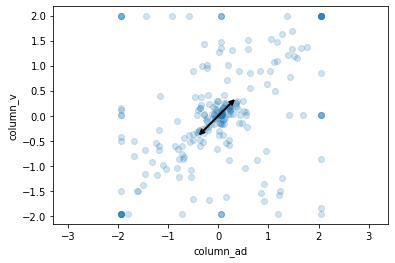

Explained variance = [0.4185193951809043, 0.4770319942870226]
Components = [-0.201081312912407, 0.16139635864988555]
Mean = [-3.7702267611760416e-16, -5.437827059388522e-17]


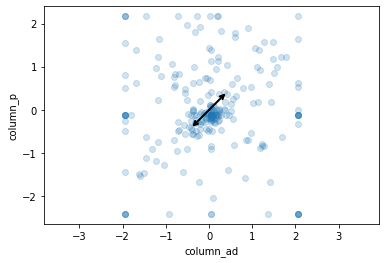

Explained variance = [0.4185193951809043, 0.3926342387071242]
Components = [-0.201081312912407, 0.20336865374115512]
Mean = [-3.7702267611760416e-16, 7.250436079184696e-18]


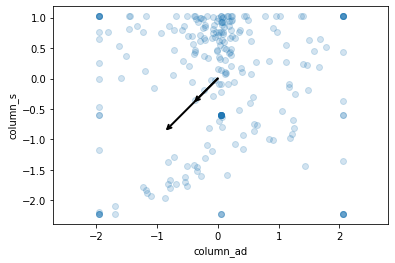

Explained variance = [0.4185193951809043, 0.36064540906532044]
Components = [-0.201081312912407, -0.4754902900511677]
Mean = [-3.7702267611760416e-16, 1.740104659004327e-16]


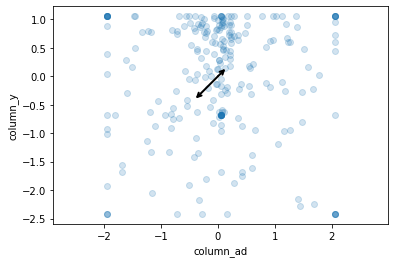

Explained variance = [0.4185193951809043, 0.30848347466117204]
Components = [-0.201081312912407, 0.07851416278657723]
Mean = [-3.7702267611760416e-16, 3.6252180395923476e-17]


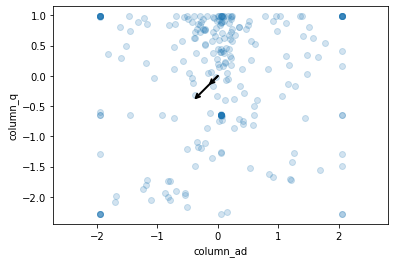

Explained variance = [0.4185193951809043, 0.2788723726352035]
Components = [-0.201081312912407, -0.0953943872992796]
Mean = [-3.7702267611760416e-16, 5.075305255429287e-17]


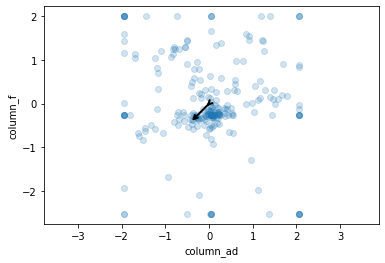

Explained variance = [0.4185193951809043, 0.2589385263862628]
Components = [-0.201081312912407, -0.03503640384300756]
Mean = [-3.7702267611760416e-16, 1.812609019796174e-18]


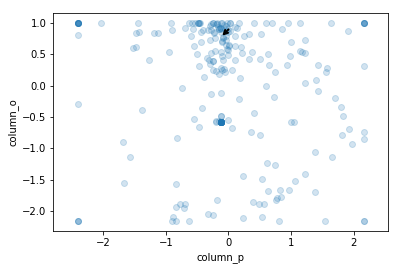

Explained variance = [0.3926342387071242, 9.045686775921455]
Components = [0.20336865374115512, -0.011141246153571102]
Mean = [7.250436079184696e-18, 0.8979591836734694]


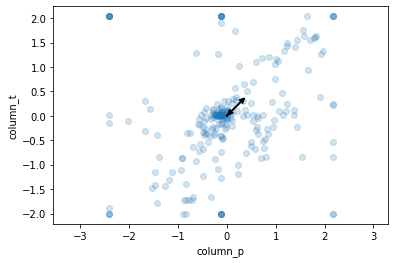

Explained variance = [0.3926342387071242, 4.457470867946926]
Components = [0.20336865374115512, -6.245004513516506e-17]
Mean = [7.250436079184696e-18, 0.0]


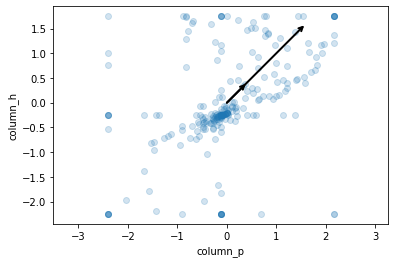

Explained variance = [0.3926342387071242, 2.822350997931873]
Components = [0.20336865374115512, 0.3102780597669046]
Mean = [7.250436079184696e-18, -2.1751308237554087e-16]


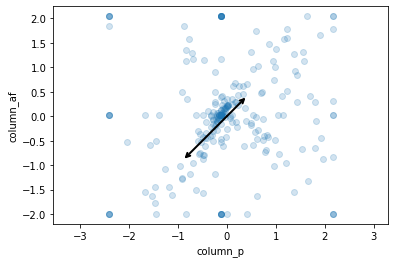

Explained variance = [0.3926342387071242, 2.157580027592784]
Components = [0.20336865374115512, -0.19653764888187195]
Mean = [7.250436079184696e-18, 1.4500872158369393e-17]


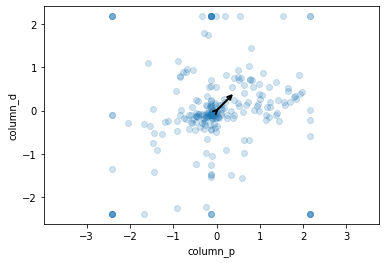

Explained variance = [0.3926342387071242, 1.9798933033287716]
Components = [0.20336865374115512, 0.012503558776654773]
Mean = [7.250436079184696e-18, -1.1600697726695514e-16]


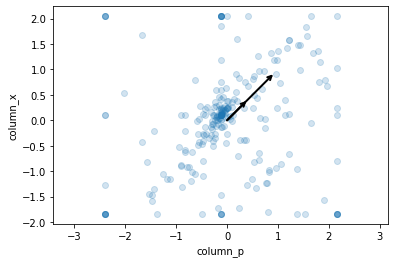

Explained variance = [0.3926342387071242, 1.186305218642031]
Components = [0.20336865374115512, 0.277000387808718]
Mean = [7.250436079184696e-18, 8.700523295021634e-17]


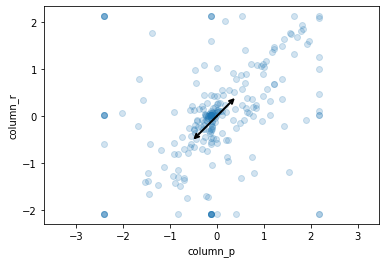

Explained variance = [0.3926342387071242, 1.06450357671577]
Components = [0.20336865374115512, -0.16270202413237378]
Mean = [7.250436079184696e-18, -3.9877398435515827e-16]


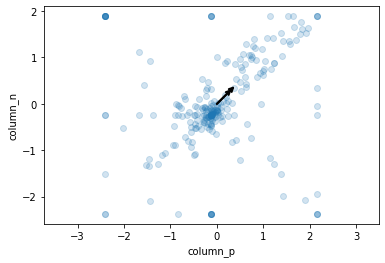

Explained variance = [0.3926342387071242, 0.9663858659383975]
Components = [0.20336865374115512, 0.10790050453517153]
Mean = [7.250436079184696e-18, 2.718913529694261e-17]


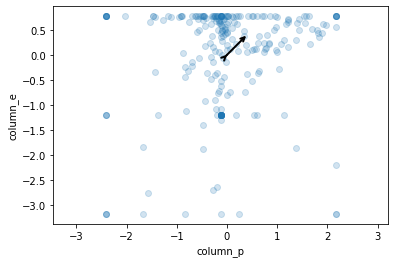

Explained variance = [0.3926342387071242, 0.8223436463906109]
Components = [0.20336865374115512, 0.0009323281055461127]
Mean = [7.250436079184696e-18, -3.8789833023638124e-16]


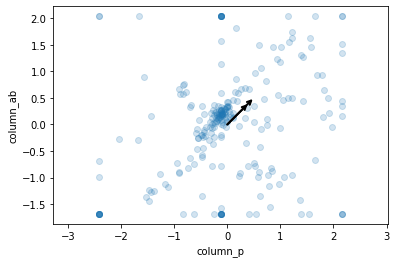

Explained variance = [0.3926342387071242, 0.8106464691360841]
Components = [0.20336865374115512, 0.17729576748331272]
Mean = [7.250436079184696e-18, -1.812609019796174e-18]


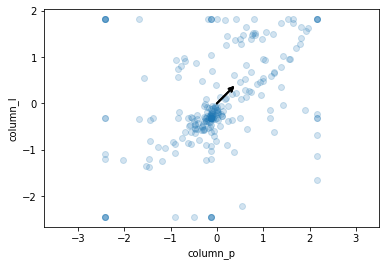

Explained variance = [0.3926342387071242, 0.6904475095535513]
Components = [0.20336865374115512, 0.15191473023488347]
Mean = [7.250436079184696e-18, -1.8851133805880208e-16]


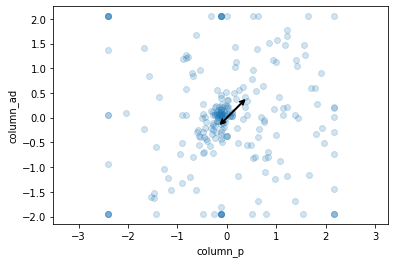

Explained variance = [0.3926342387071242, 0.6571354092729098]
Components = [0.20336865374115512, -0.06219276085082239]
Mean = [7.250436079184696e-18, -1.450087215836939e-16]


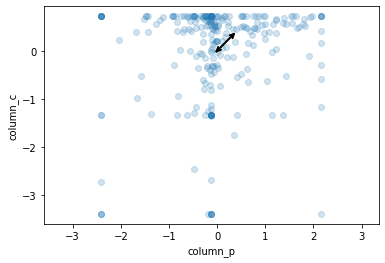

Explained variance = [0.3926342387071242, 0.5650664430011808]
Components = [0.20336865374115512, -0.01849375523188338]
Mean = [7.250436079184696e-18, -2.6101569885064907e-16]


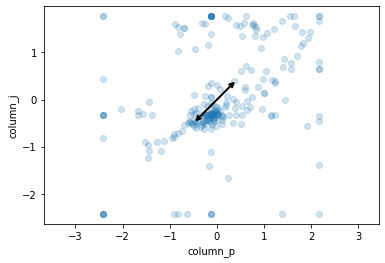

Explained variance = [0.3926342387071242, 0.5330852327996964]
Components = [0.20336865374115512, -0.21202851851721957]
Mean = [7.250436079184696e-18, 7.975479687103165e-17]


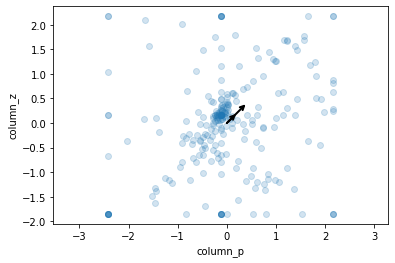

Explained variance = [0.3926342387071242, 0.5101953831380778]
Components = [0.20336865374115512, 0.08716929481142828]
Mean = [7.250436079184696e-18, -4.604026910282282e-16]


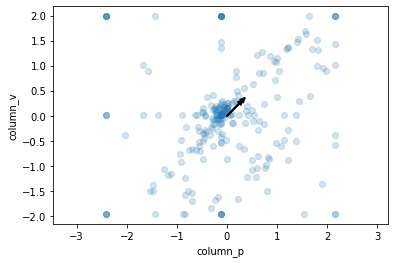

Explained variance = [0.3926342387071242, 0.4770319942870226]
Components = [0.20336865374115512, 0.16139635864988555]
Mean = [7.250436079184696e-18, -5.437827059388522e-17]


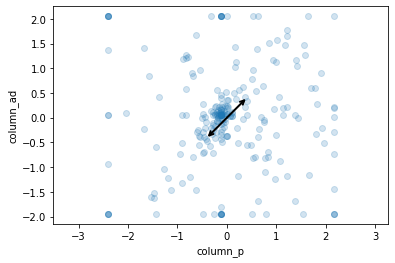

Explained variance = [0.3926342387071242, 0.4185193951809043]
Components = [0.20336865374115512, -0.201081312912407]
Mean = [7.250436079184696e-18, -3.7702267611760416e-16]


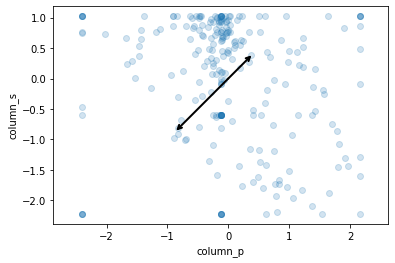

Explained variance = [0.3926342387071242, 0.36064540906532044]
Components = [0.20336865374115512, -0.4754902900511677]
Mean = [7.250436079184696e-18, 1.740104659004327e-16]


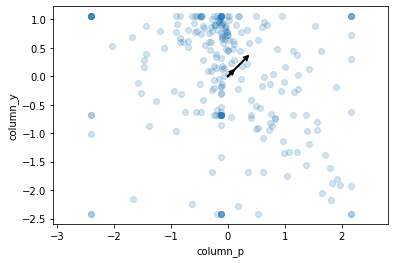

Explained variance = [0.3926342387071242, 0.30848347466117204]
Components = [0.20336865374115512, 0.07851416278657723]
Mean = [7.250436079184696e-18, 3.6252180395923476e-17]


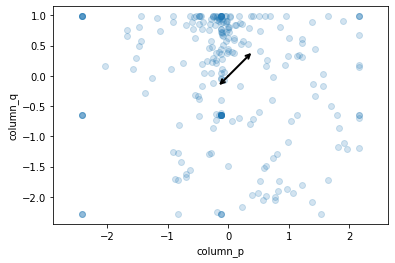

Explained variance = [0.3926342387071242, 0.2788723726352035]
Components = [0.20336865374115512, -0.0953943872992796]
Mean = [7.250436079184696e-18, 5.075305255429287e-17]


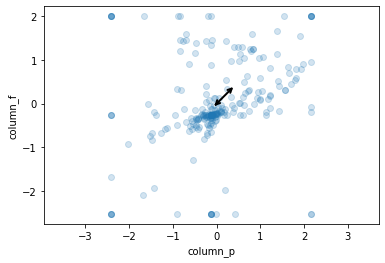

Explained variance = [0.3926342387071242, 0.2589385263862628]
Components = [0.20336865374115512, -0.03503640384300756]
Mean = [7.250436079184696e-18, 1.812609019796174e-18]


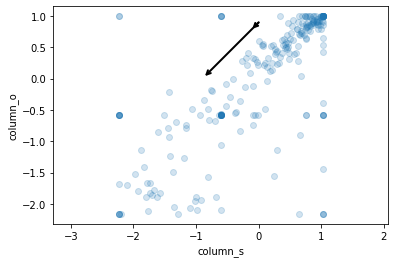

Explained variance = [0.36064540906532044, 9.045686775921455]
Components = [-0.4754902900511677, -0.011141246153571102]
Mean = [1.740104659004327e-16, 0.8979591836734694]


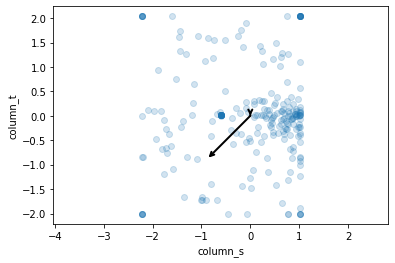

Explained variance = [0.36064540906532044, 4.457470867946926]
Components = [-0.4754902900511677, -6.245004513516506e-17]
Mean = [1.740104659004327e-16, 0.0]


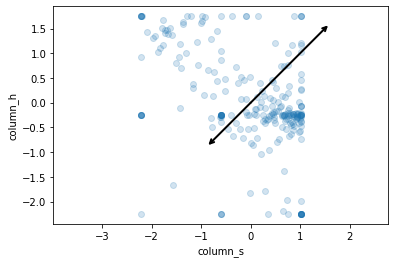

Explained variance = [0.36064540906532044, 2.822350997931873]
Components = [-0.4754902900511677, 0.3102780597669046]
Mean = [1.740104659004327e-16, -2.1751308237554087e-16]


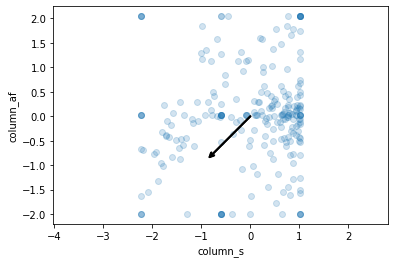

Explained variance = [0.36064540906532044, 2.157580027592784]
Components = [-0.4754902900511677, -0.19653764888187195]
Mean = [1.740104659004327e-16, 1.4500872158369393e-17]


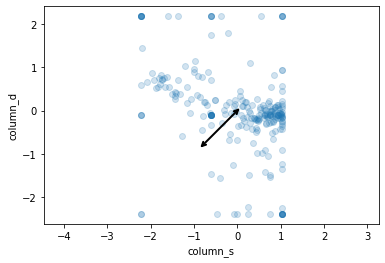

Explained variance = [0.36064540906532044, 1.9798933033287716]
Components = [-0.4754902900511677, 0.012503558776654773]
Mean = [1.740104659004327e-16, -1.1600697726695514e-16]


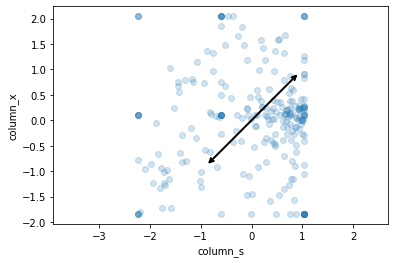

Explained variance = [0.36064540906532044, 1.186305218642031]
Components = [-0.4754902900511677, 0.277000387808718]
Mean = [1.740104659004327e-16, 8.700523295021634e-17]


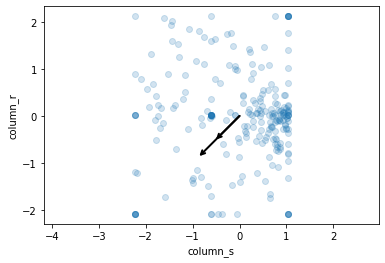

Explained variance = [0.36064540906532044, 1.06450357671577]
Components = [-0.4754902900511677, -0.16270202413237378]
Mean = [1.740104659004327e-16, -3.9877398435515827e-16]


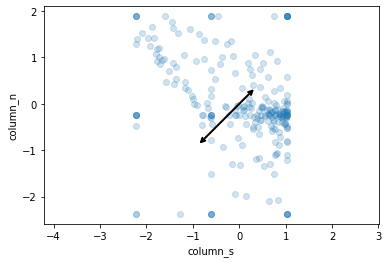

Explained variance = [0.36064540906532044, 0.9663858659383975]
Components = [-0.4754902900511677, 0.10790050453517153]
Mean = [1.740104659004327e-16, 2.718913529694261e-17]


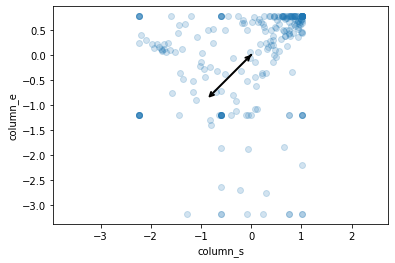

Explained variance = [0.36064540906532044, 0.8223436463906109]
Components = [-0.4754902900511677, 0.0009323281055461127]
Mean = [1.740104659004327e-16, -3.8789833023638124e-16]


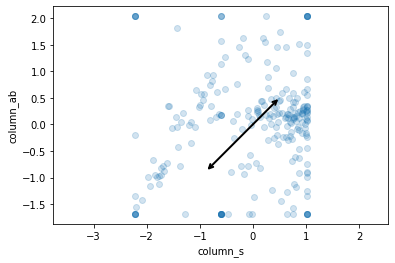

Explained variance = [0.36064540906532044, 0.8106464691360841]
Components = [-0.4754902900511677, 0.17729576748331272]
Mean = [1.740104659004327e-16, -1.812609019796174e-18]


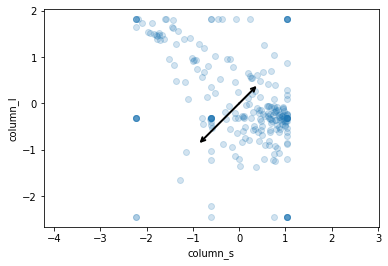

Explained variance = [0.36064540906532044, 0.6904475095535513]
Components = [-0.4754902900511677, 0.15191473023488347]
Mean = [1.740104659004327e-16, -1.8851133805880208e-16]


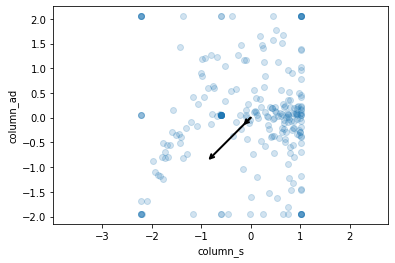

Explained variance = [0.36064540906532044, 0.6571354092729098]
Components = [-0.4754902900511677, -0.06219276085082239]
Mean = [1.740104659004327e-16, -1.450087215836939e-16]


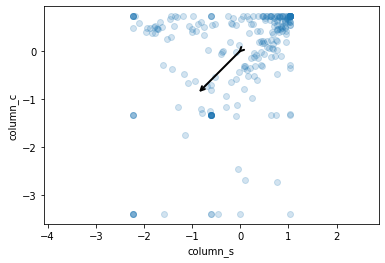

Explained variance = [0.36064540906532044, 0.5650664430011808]
Components = [-0.4754902900511677, -0.01849375523188338]
Mean = [1.740104659004327e-16, -2.6101569885064907e-16]


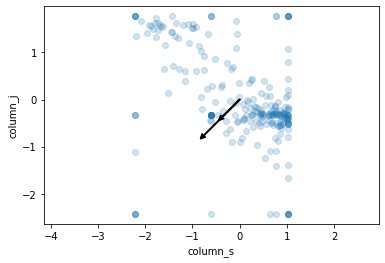

Explained variance = [0.36064540906532044, 0.5330852327996964]
Components = [-0.4754902900511677, -0.21202851851721957]
Mean = [1.740104659004327e-16, 7.975479687103165e-17]


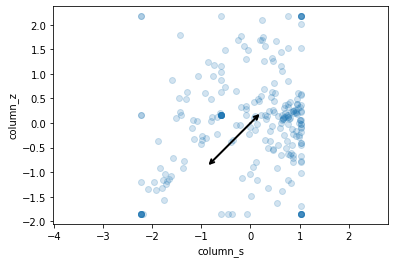

Explained variance = [0.36064540906532044, 0.5101953831380778]
Components = [-0.4754902900511677, 0.08716929481142828]
Mean = [1.740104659004327e-16, -4.604026910282282e-16]


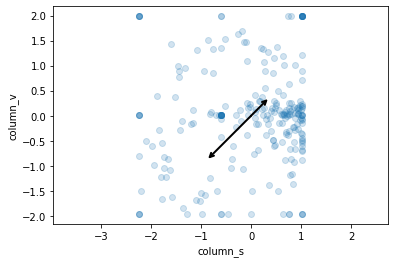

Explained variance = [0.36064540906532044, 0.4770319942870226]
Components = [-0.4754902900511677, 0.16139635864988555]
Mean = [1.740104659004327e-16, -5.437827059388522e-17]


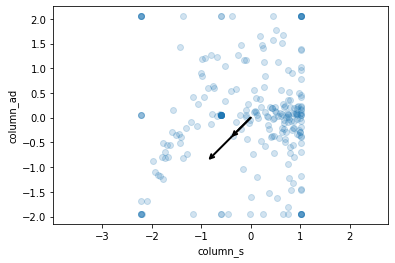

Explained variance = [0.36064540906532044, 0.4185193951809043]
Components = [-0.4754902900511677, -0.201081312912407]
Mean = [1.740104659004327e-16, -3.7702267611760416e-16]


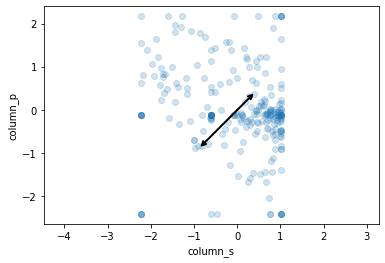

Explained variance = [0.36064540906532044, 0.3926342387071242]
Components = [-0.4754902900511677, 0.20336865374115512]
Mean = [1.740104659004327e-16, 7.250436079184696e-18]


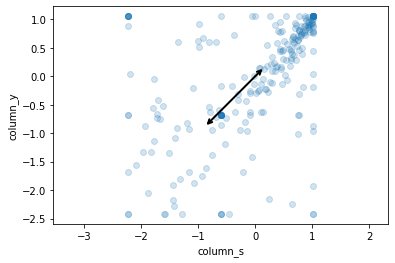

Explained variance = [0.36064540906532044, 0.30848347466117204]
Components = [-0.4754902900511677, 0.07851416278657723]
Mean = [1.740104659004327e-16, 3.6252180395923476e-17]


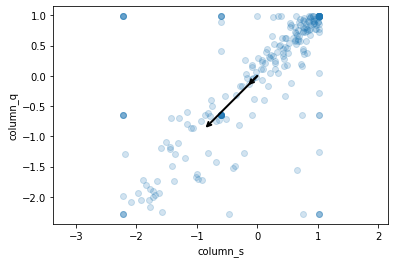

Explained variance = [0.36064540906532044, 0.2788723726352035]
Components = [-0.4754902900511677, -0.0953943872992796]
Mean = [1.740104659004327e-16, 5.075305255429287e-17]


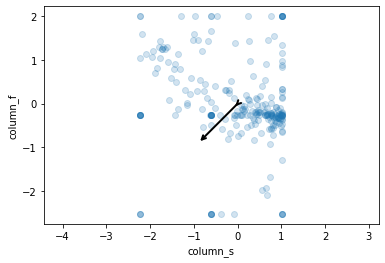

Explained variance = [0.36064540906532044, 0.2589385263862628]
Components = [-0.4754902900511677, -0.03503640384300756]
Mean = [1.740104659004327e-16, 1.812609019796174e-18]


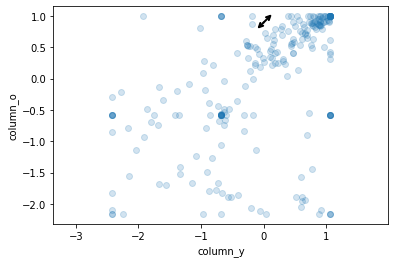

Explained variance = [0.30848347466117204, 9.045686775921455]
Components = [0.07851416278657723, -0.011141246153571102]
Mean = [3.6252180395923476e-17, 0.8979591836734694]


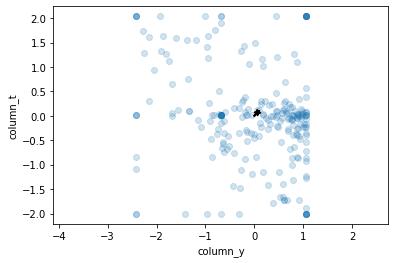

Explained variance = [0.30848347466117204, 4.457470867946926]
Components = [0.07851416278657723, -6.245004513516506e-17]
Mean = [3.6252180395923476e-17, 0.0]


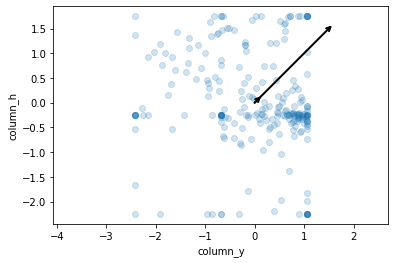

Explained variance = [0.30848347466117204, 2.822350997931873]
Components = [0.07851416278657723, 0.3102780597669046]
Mean = [3.6252180395923476e-17, -2.1751308237554087e-16]


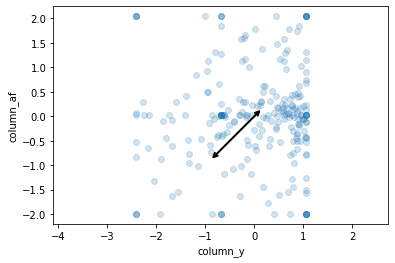

Explained variance = [0.30848347466117204, 2.157580027592784]
Components = [0.07851416278657723, -0.19653764888187195]
Mean = [3.6252180395923476e-17, 1.4500872158369393e-17]


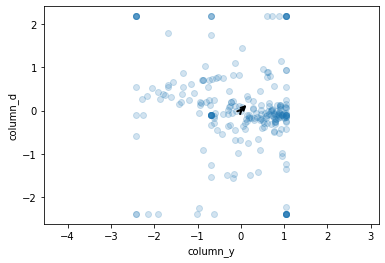

Explained variance = [0.30848347466117204, 1.9798933033287716]
Components = [0.07851416278657723, 0.012503558776654773]
Mean = [3.6252180395923476e-17, -1.1600697726695514e-16]


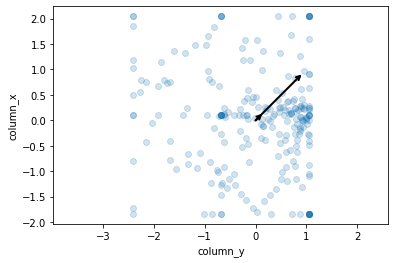

Explained variance = [0.30848347466117204, 1.186305218642031]
Components = [0.07851416278657723, 0.277000387808718]
Mean = [3.6252180395923476e-17, 8.700523295021634e-17]


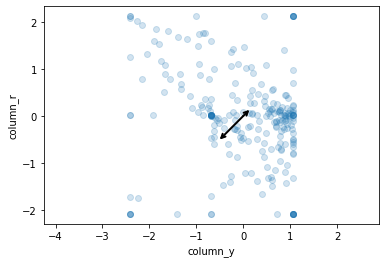

Explained variance = [0.30848347466117204, 1.06450357671577]
Components = [0.07851416278657723, -0.16270202413237378]
Mean = [3.6252180395923476e-17, -3.9877398435515827e-16]


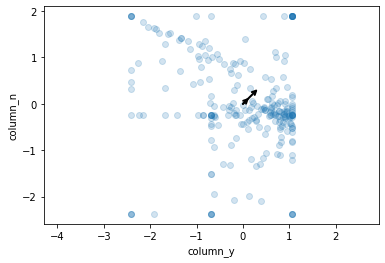

Explained variance = [0.30848347466117204, 0.9663858659383975]
Components = [0.07851416278657723, 0.10790050453517153]
Mean = [3.6252180395923476e-17, 2.718913529694261e-17]


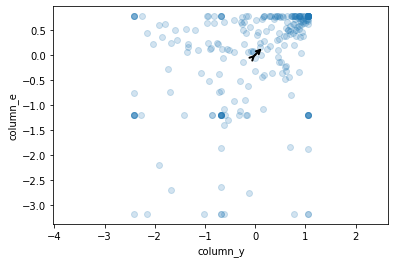

Explained variance = [0.30848347466117204, 0.8223436463906109]
Components = [0.07851416278657723, 0.0009323281055461127]
Mean = [3.6252180395923476e-17, -3.8789833023638124e-16]


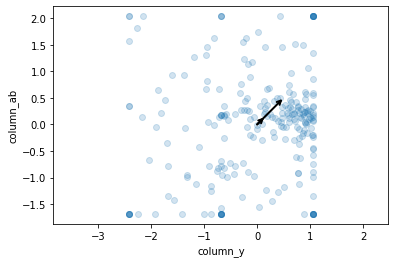

Explained variance = [0.30848347466117204, 0.8106464691360841]
Components = [0.07851416278657723, 0.17729576748331272]
Mean = [3.6252180395923476e-17, -1.812609019796174e-18]


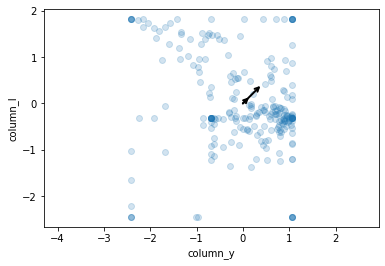

Explained variance = [0.30848347466117204, 0.6904475095535513]
Components = [0.07851416278657723, 0.15191473023488347]
Mean = [3.6252180395923476e-17, -1.8851133805880208e-16]


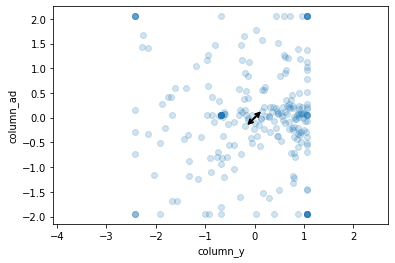

Explained variance = [0.30848347466117204, 0.6571354092729098]
Components = [0.07851416278657723, -0.06219276085082239]
Mean = [3.6252180395923476e-17, -1.450087215836939e-16]


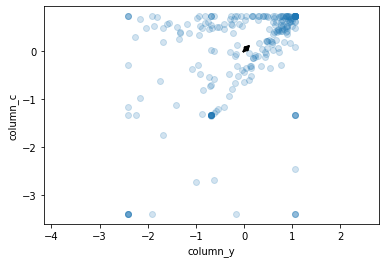

Explained variance = [0.30848347466117204, 0.5650664430011808]
Components = [0.07851416278657723, -0.01849375523188338]
Mean = [3.6252180395923476e-17, -2.6101569885064907e-16]


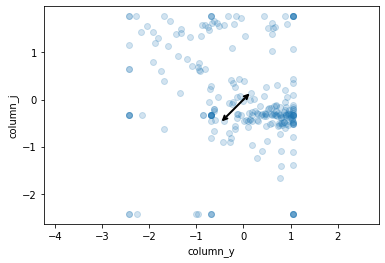

Explained variance = [0.30848347466117204, 0.5330852327996964]
Components = [0.07851416278657723, -0.21202851851721957]
Mean = [3.6252180395923476e-17, 7.975479687103165e-17]


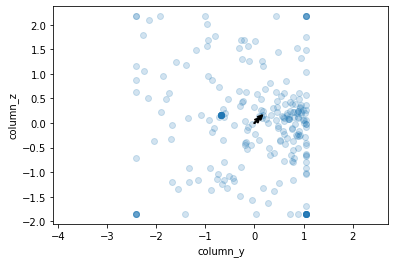

Explained variance = [0.30848347466117204, 0.5101953831380778]
Components = [0.07851416278657723, 0.08716929481142828]
Mean = [3.6252180395923476e-17, -4.604026910282282e-16]


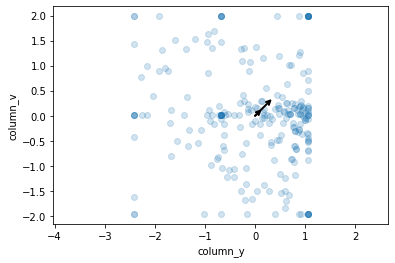

Explained variance = [0.30848347466117204, 0.4770319942870226]
Components = [0.07851416278657723, 0.16139635864988555]
Mean = [3.6252180395923476e-17, -5.437827059388522e-17]


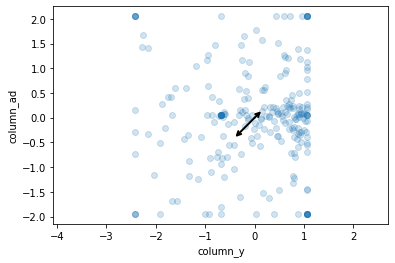

Explained variance = [0.30848347466117204, 0.4185193951809043]
Components = [0.07851416278657723, -0.201081312912407]
Mean = [3.6252180395923476e-17, -3.7702267611760416e-16]


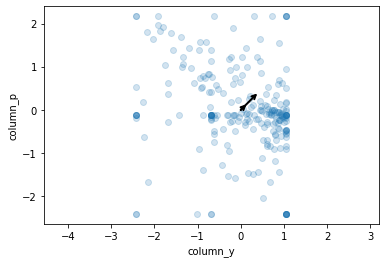

Explained variance = [0.30848347466117204, 0.3926342387071242]
Components = [0.07851416278657723, 0.20336865374115512]
Mean = [3.6252180395923476e-17, 7.250436079184696e-18]


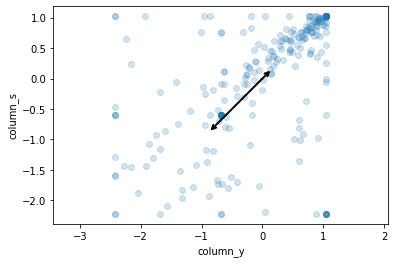

Explained variance = [0.30848347466117204, 0.36064540906532044]
Components = [0.07851416278657723, -0.4754902900511677]
Mean = [3.6252180395923476e-17, 1.740104659004327e-16]


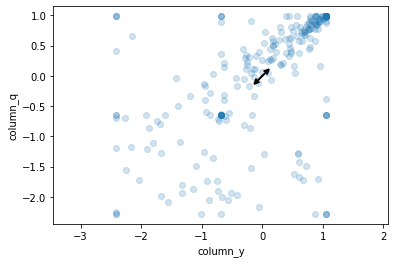

Explained variance = [0.30848347466117204, 0.2788723726352035]
Components = [0.07851416278657723, -0.0953943872992796]
Mean = [3.6252180395923476e-17, 5.075305255429287e-17]


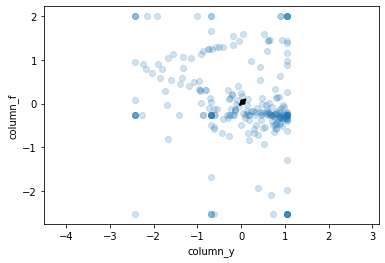

Explained variance = [0.30848347466117204, 0.2589385263862628]
Components = [0.07851416278657723, -0.03503640384300756]
Mean = [3.6252180395923476e-17, 1.812609019796174e-18]


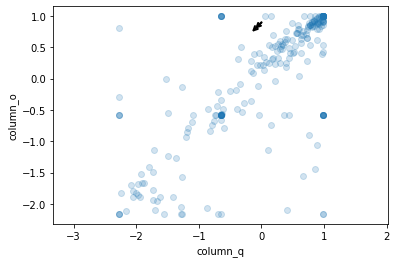

Explained variance = [0.2788723726352035, 9.045686775921455]
Components = [-0.0953943872992796, -0.011141246153571102]
Mean = [5.075305255429287e-17, 0.8979591836734694]


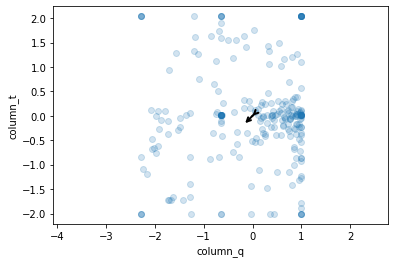

Explained variance = [0.2788723726352035, 4.457470867946926]
Components = [-0.0953943872992796, -6.245004513516506e-17]
Mean = [5.075305255429287e-17, 0.0]


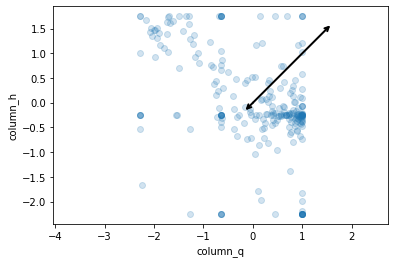

Explained variance = [0.2788723726352035, 2.822350997931873]
Components = [-0.0953943872992796, 0.3102780597669046]
Mean = [5.075305255429287e-17, -2.1751308237554087e-16]


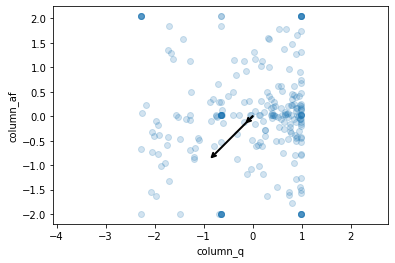

Explained variance = [0.2788723726352035, 2.157580027592784]
Components = [-0.0953943872992796, -0.19653764888187195]
Mean = [5.075305255429287e-17, 1.4500872158369393e-17]


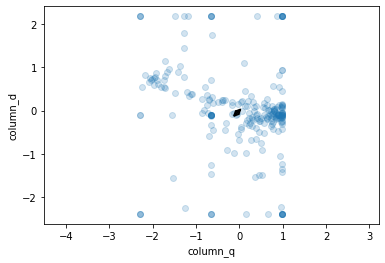

Explained variance = [0.2788723726352035, 1.9798933033287716]
Components = [-0.0953943872992796, 0.012503558776654773]
Mean = [5.075305255429287e-17, -1.1600697726695514e-16]


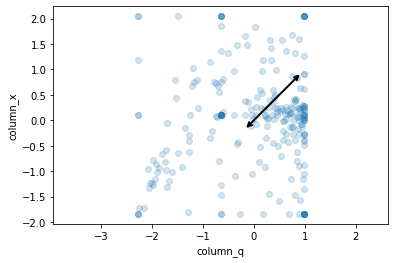

Explained variance = [0.2788723726352035, 1.186305218642031]
Components = [-0.0953943872992796, 0.277000387808718]
Mean = [5.075305255429287e-17, 8.700523295021634e-17]


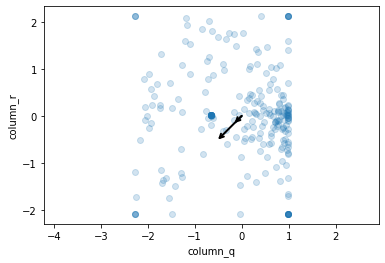

Explained variance = [0.2788723726352035, 1.06450357671577]
Components = [-0.0953943872992796, -0.16270202413237378]
Mean = [5.075305255429287e-17, -3.9877398435515827e-16]


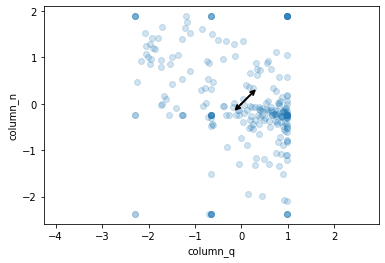

Explained variance = [0.2788723726352035, 0.9663858659383975]
Components = [-0.0953943872992796, 0.10790050453517153]
Mean = [5.075305255429287e-17, 2.718913529694261e-17]


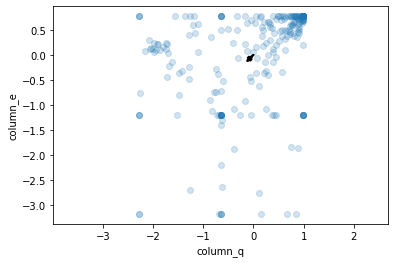

Explained variance = [0.2788723726352035, 0.8223436463906109]
Components = [-0.0953943872992796, 0.0009323281055461127]
Mean = [5.075305255429287e-17, -3.8789833023638124e-16]


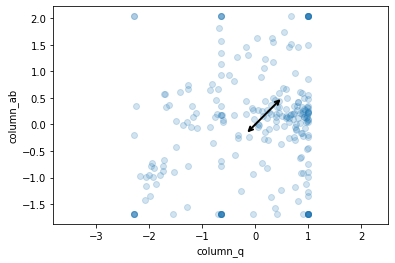

Explained variance = [0.2788723726352035, 0.8106464691360841]
Components = [-0.0953943872992796, 0.17729576748331272]
Mean = [5.075305255429287e-17, -1.812609019796174e-18]


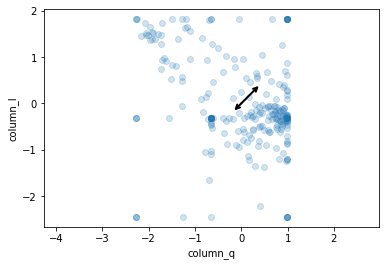

Explained variance = [0.2788723726352035, 0.6904475095535513]
Components = [-0.0953943872992796, 0.15191473023488347]
Mean = [5.075305255429287e-17, -1.8851133805880208e-16]


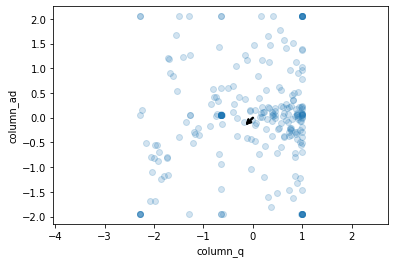

Explained variance = [0.2788723726352035, 0.6571354092729098]
Components = [-0.0953943872992796, -0.06219276085082239]
Mean = [5.075305255429287e-17, -1.450087215836939e-16]


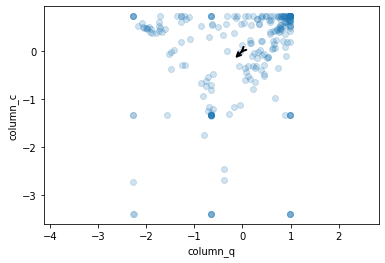

Explained variance = [0.2788723726352035, 0.5650664430011808]
Components = [-0.0953943872992796, -0.01849375523188338]
Mean = [5.075305255429287e-17, -2.6101569885064907e-16]


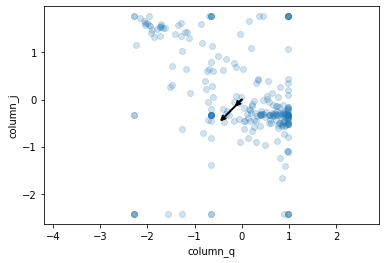

Explained variance = [0.2788723726352035, 0.5330852327996964]
Components = [-0.0953943872992796, -0.21202851851721957]
Mean = [5.075305255429287e-17, 7.975479687103165e-17]


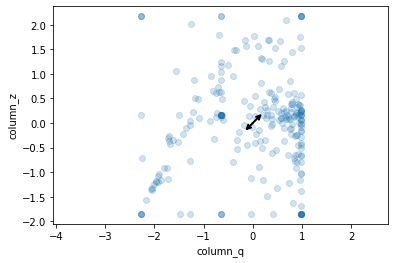

Explained variance = [0.2788723726352035, 0.5101953831380778]
Components = [-0.0953943872992796, 0.08716929481142828]
Mean = [5.075305255429287e-17, -4.604026910282282e-16]


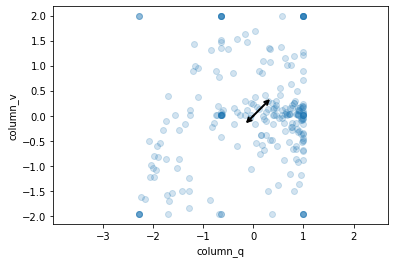

Explained variance = [0.2788723726352035, 0.4770319942870226]
Components = [-0.0953943872992796, 0.16139635864988555]
Mean = [5.075305255429287e-17, -5.437827059388522e-17]


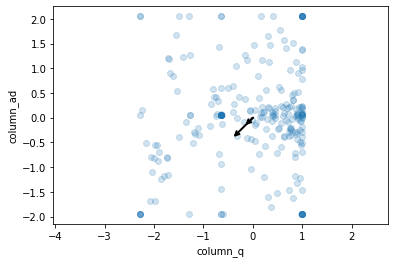

Explained variance = [0.2788723726352035, 0.4185193951809043]
Components = [-0.0953943872992796, -0.201081312912407]
Mean = [5.075305255429287e-17, -3.7702267611760416e-16]


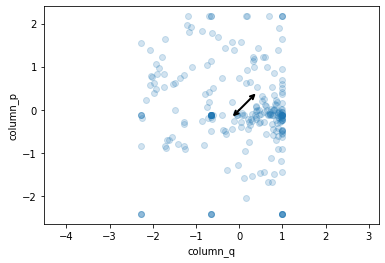

Explained variance = [0.2788723726352035, 0.3926342387071242]
Components = [-0.0953943872992796, 0.20336865374115512]
Mean = [5.075305255429287e-17, 7.250436079184696e-18]


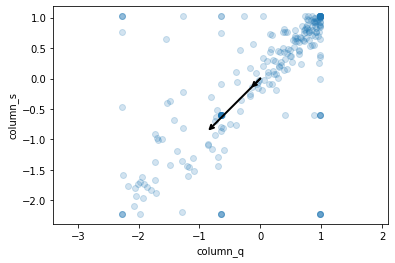

Explained variance = [0.2788723726352035, 0.36064540906532044]
Components = [-0.0953943872992796, -0.4754902900511677]
Mean = [5.075305255429287e-17, 1.740104659004327e-16]


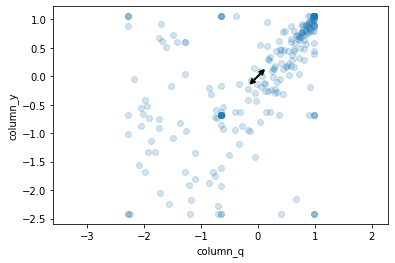

Explained variance = [0.2788723726352035, 0.30848347466117204]
Components = [-0.0953943872992796, 0.07851416278657723]
Mean = [5.075305255429287e-17, 3.6252180395923476e-17]


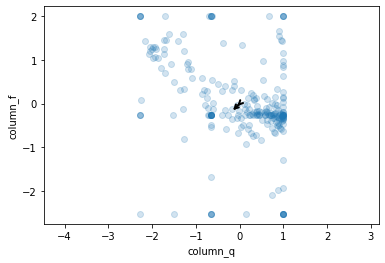

Explained variance = [0.2788723726352035, 0.2589385263862628]
Components = [-0.0953943872992796, -0.03503640384300756]
Mean = [5.075305255429287e-17, 1.812609019796174e-18]


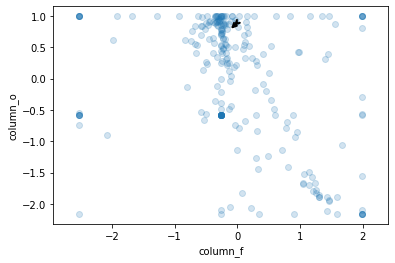

Explained variance = [0.2589385263862628, 9.045686775921455]
Components = [-0.03503640384300756, -0.011141246153571102]
Mean = [1.812609019796174e-18, 0.8979591836734694]


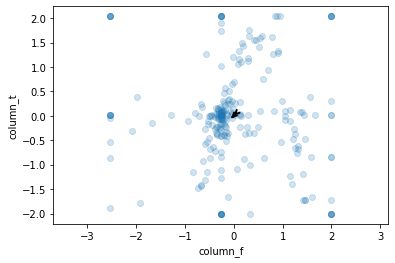

Explained variance = [0.2589385263862628, 4.457470867946926]
Components = [-0.03503640384300756, -6.245004513516506e-17]
Mean = [1.812609019796174e-18, 0.0]


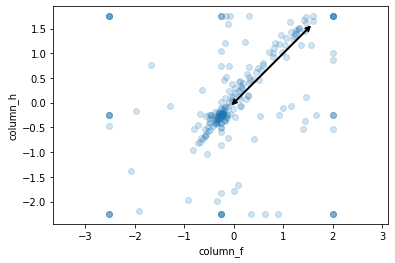

Explained variance = [0.2589385263862628, 2.822350997931873]
Components = [-0.03503640384300756, 0.3102780597669046]
Mean = [1.812609019796174e-18, -2.1751308237554087e-16]


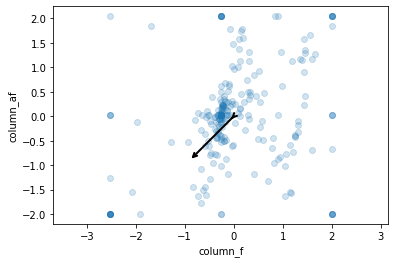

Explained variance = [0.2589385263862628, 2.157580027592784]
Components = [-0.03503640384300756, -0.19653764888187195]
Mean = [1.812609019796174e-18, 1.4500872158369393e-17]


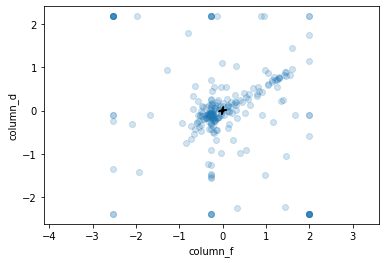

Explained variance = [0.2589385263862628, 1.9798933033287716]
Components = [-0.03503640384300756, 0.012503558776654773]
Mean = [1.812609019796174e-18, -1.1600697726695514e-16]


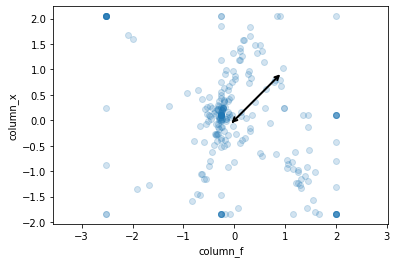

Explained variance = [0.2589385263862628, 1.186305218642031]
Components = [-0.03503640384300756, 0.277000387808718]
Mean = [1.812609019796174e-18, 8.700523295021634e-17]


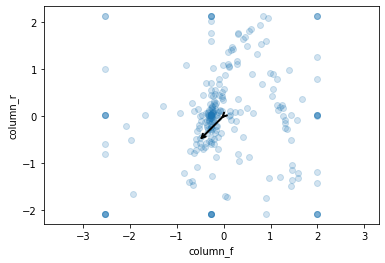

Explained variance = [0.2589385263862628, 1.06450357671577]
Components = [-0.03503640384300756, -0.16270202413237378]
Mean = [1.812609019796174e-18, -3.9877398435515827e-16]


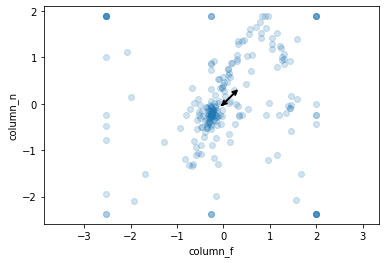

Explained variance = [0.2589385263862628, 0.9663858659383975]
Components = [-0.03503640384300756, 0.10790050453517153]
Mean = [1.812609019796174e-18, 2.718913529694261e-17]


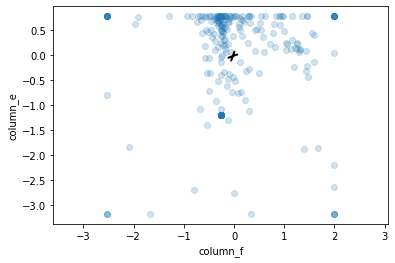

Explained variance = [0.2589385263862628, 0.8223436463906109]
Components = [-0.03503640384300756, 0.0009323281055461127]
Mean = [1.812609019796174e-18, -3.8789833023638124e-16]


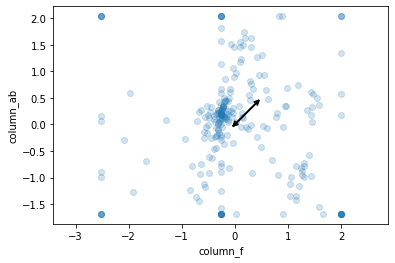

Explained variance = [0.2589385263862628, 0.8106464691360841]
Components = [-0.03503640384300756, 0.17729576748331272]
Mean = [1.812609019796174e-18, -1.812609019796174e-18]


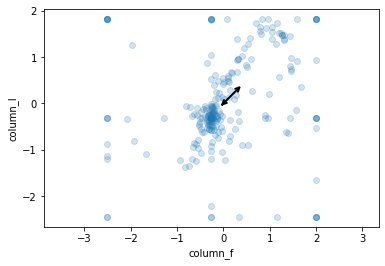

Explained variance = [0.2589385263862628, 0.6904475095535513]
Components = [-0.03503640384300756, 0.15191473023488347]
Mean = [1.812609019796174e-18, -1.8851133805880208e-16]


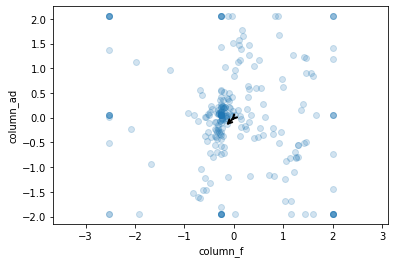

Explained variance = [0.2589385263862628, 0.6571354092729098]
Components = [-0.03503640384300756, -0.06219276085082239]
Mean = [1.812609019796174e-18, -1.450087215836939e-16]


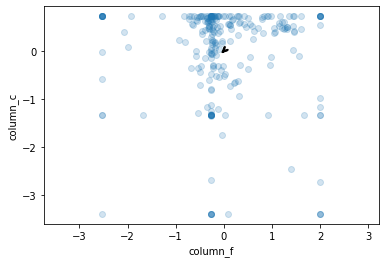

Explained variance = [0.2589385263862628, 0.5650664430011808]
Components = [-0.03503640384300756, -0.01849375523188338]
Mean = [1.812609019796174e-18, -2.6101569885064907e-16]


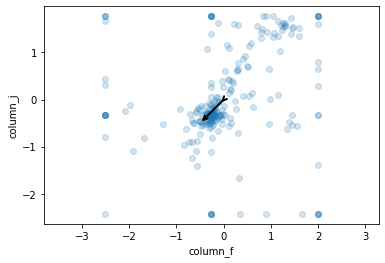

Explained variance = [0.2589385263862628, 0.5330852327996964]
Components = [-0.03503640384300756, -0.21202851851721957]
Mean = [1.812609019796174e-18, 7.975479687103165e-17]


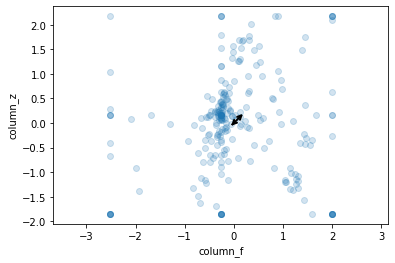

Explained variance = [0.2589385263862628, 0.5101953831380778]
Components = [-0.03503640384300756, 0.08716929481142828]
Mean = [1.812609019796174e-18, -4.604026910282282e-16]


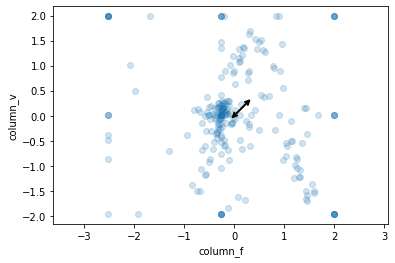

Explained variance = [0.2589385263862628, 0.4770319942870226]
Components = [-0.03503640384300756, 0.16139635864988555]
Mean = [1.812609019796174e-18, -5.437827059388522e-17]


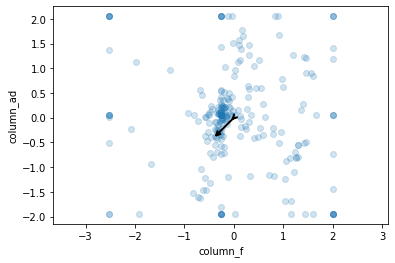

Explained variance = [0.2589385263862628, 0.4185193951809043]
Components = [-0.03503640384300756, -0.201081312912407]
Mean = [1.812609019796174e-18, -3.7702267611760416e-16]


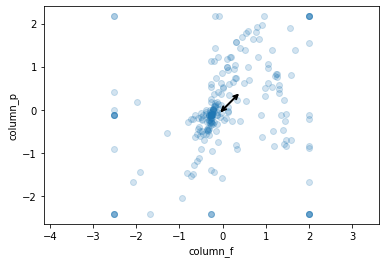

Explained variance = [0.2589385263862628, 0.3926342387071242]
Components = [-0.03503640384300756, 0.20336865374115512]
Mean = [1.812609019796174e-18, 7.250436079184696e-18]


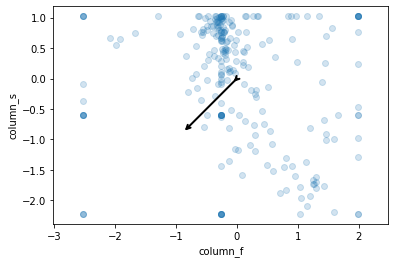

Explained variance = [0.2589385263862628, 0.36064540906532044]
Components = [-0.03503640384300756, -0.4754902900511677]
Mean = [1.812609019796174e-18, 1.740104659004327e-16]


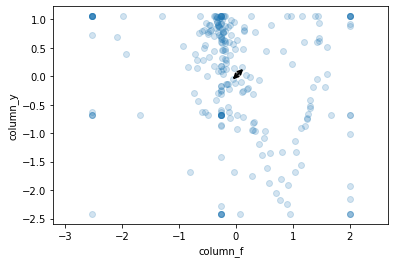

Explained variance = [0.2589385263862628, 0.30848347466117204]
Components = [-0.03503640384300756, 0.07851416278657723]
Mean = [1.812609019796174e-18, 3.6252180395923476e-17]


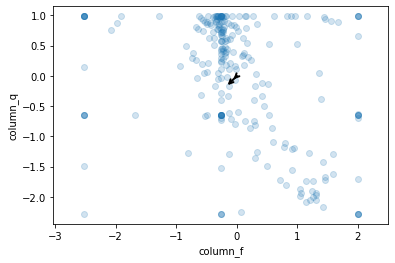

Explained variance = [0.2589385263862628, 0.2788723726352035]
Components = [-0.03503640384300756, -0.0953943872992796]
Mean = [1.812609019796174e-18, 5.075305255429287e-17]


In [ ]:
pca = PCA(n_components=0.95).fit(X_train)
most_important = [np.abs(pca.components_[i]).argmax() for i in range(pca.components_.shape[0])]
print(most_important)
feature_names = [pca.feature_names_in_[i] for i in most_important]
for i in enumerate(feature_names):
  for j in enumerate(feature_names):
    if i == j: 
      continue
    plot_df(X_train, i,j, pca)

22

In [ ]:
s_pca = PCA(0.95)
s_p_components = s_pca.fit_transform(X_noised)
reconstruct = s_pca.inverse_transform(s_p_components)
X_denoised = pd.DataFrame(data=reconstruct, columns=df.columns[:-1])

Acuraccy for test values for Regression Tree with: 2 depth : 81.13207547169812 %
Acuraccy for valid values for Regression Tree with: 2 depth : 88.67924528301887 %
Acuraccy for test values for Regression Tree with: 2 depth : 81.13207547169812 %
Acuraccy for valid values for Regression Tree with: 2 depth : 88.67924528301887 %


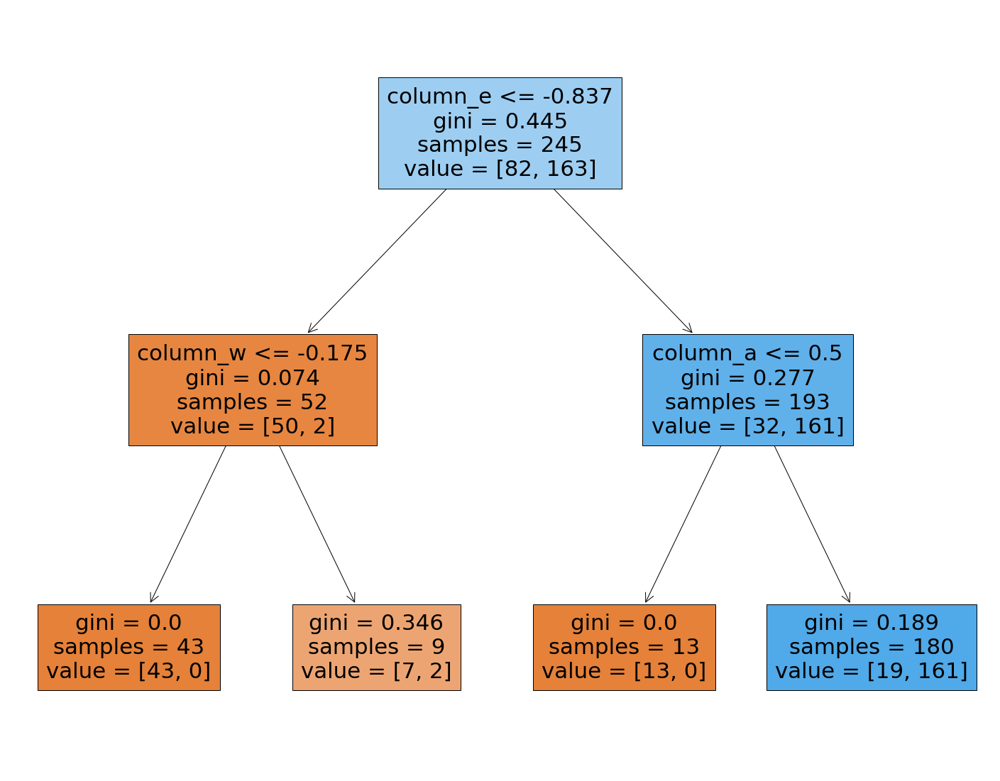

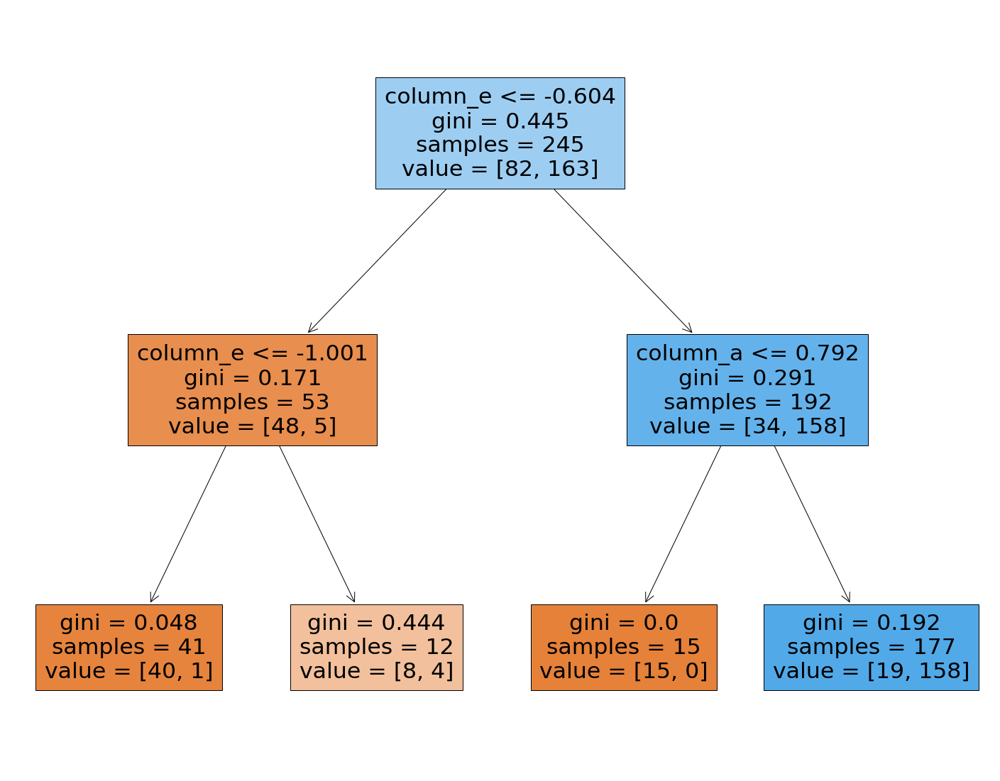

In [ ]:
regression_Tree(X_noised, y_train, X_valid, y_valid, X_test, y_test, 2)
regression_Tree(X_denoised, y_train, X_valid, y_valid, X_test, y_test, 2)

Acuraccy for test values for Regression Tree with: 4 depth : 84.90566037735849 %
Acuraccy for valid values for Regression Tree with: 4 depth : 92.45283018867924 %
Acuraccy for test values for Regression Tree with: 4 depth : 81.13207547169812 %
Acuraccy for valid values for Regression Tree with: 4 depth : 88.67924528301887 %


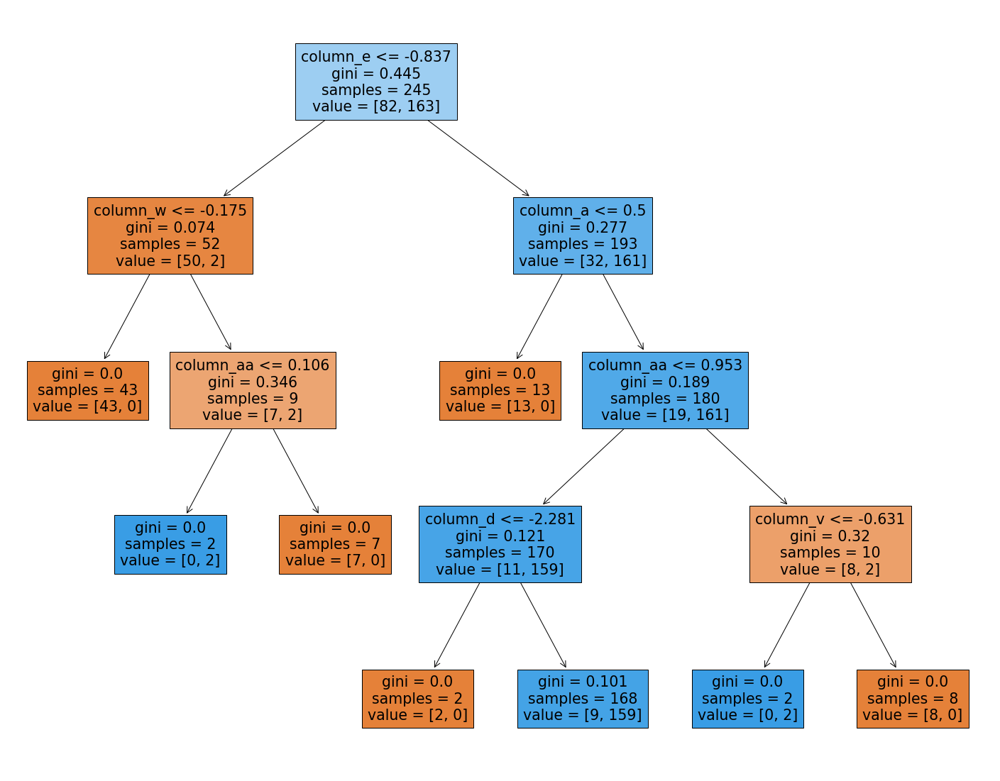

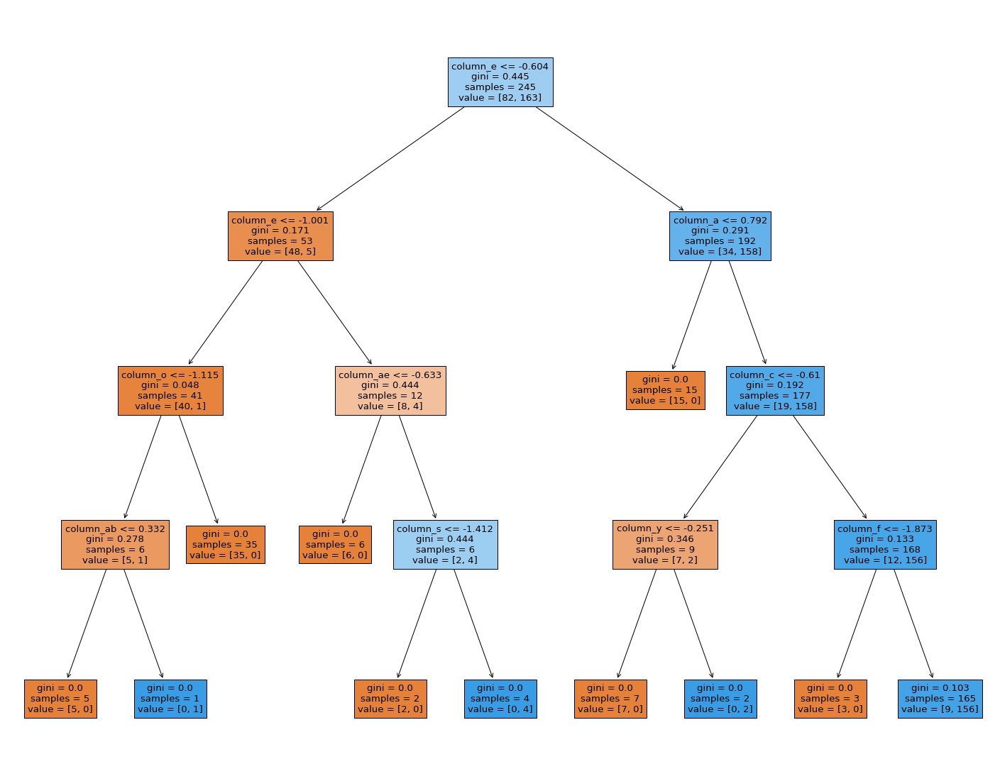

In [ ]:
regression_Tree(X_noised, y_train, X_valid, y_valid, X_test, y_test, 4)
regression_Tree(X_denoised, y_train, X_valid, y_valid, X_test, y_test, 4)

Acuraccy for test values for Regression Tree with: 6 depth : 86.79245283018868 %
Acuraccy for valid values for Regression Tree with: 6 depth : 94.33962264150944 %
Acuraccy for test values for Regression Tree with: 6 depth : 79.24528301886792 %
Acuraccy for valid values for Regression Tree with: 6 depth : 92.45283018867924 %


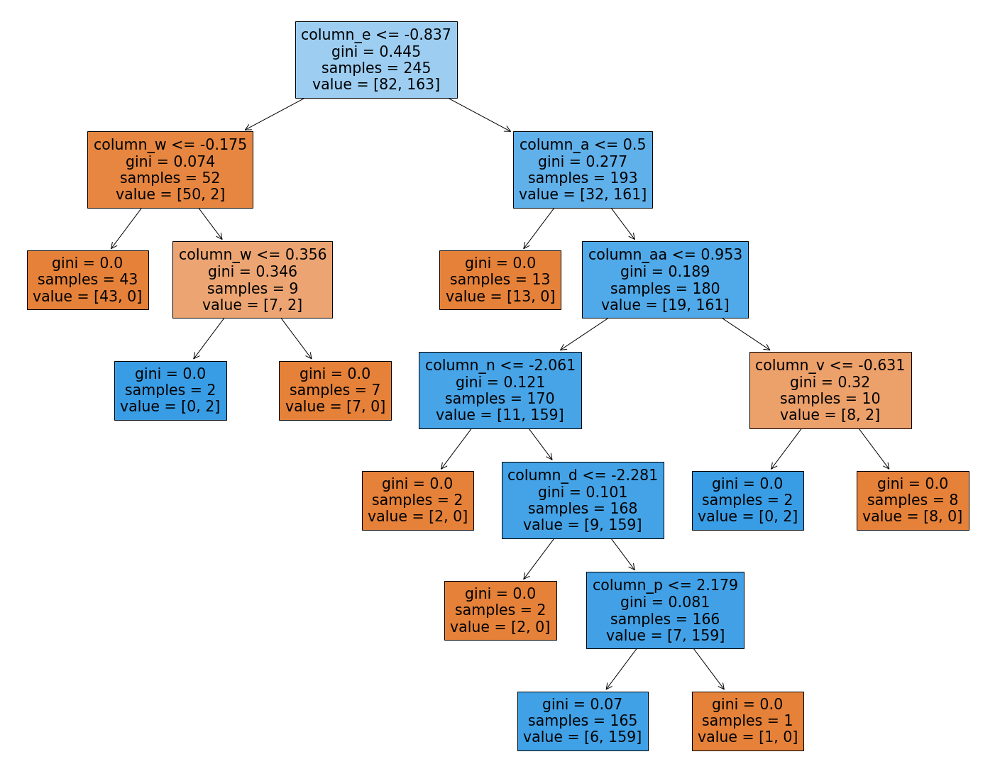

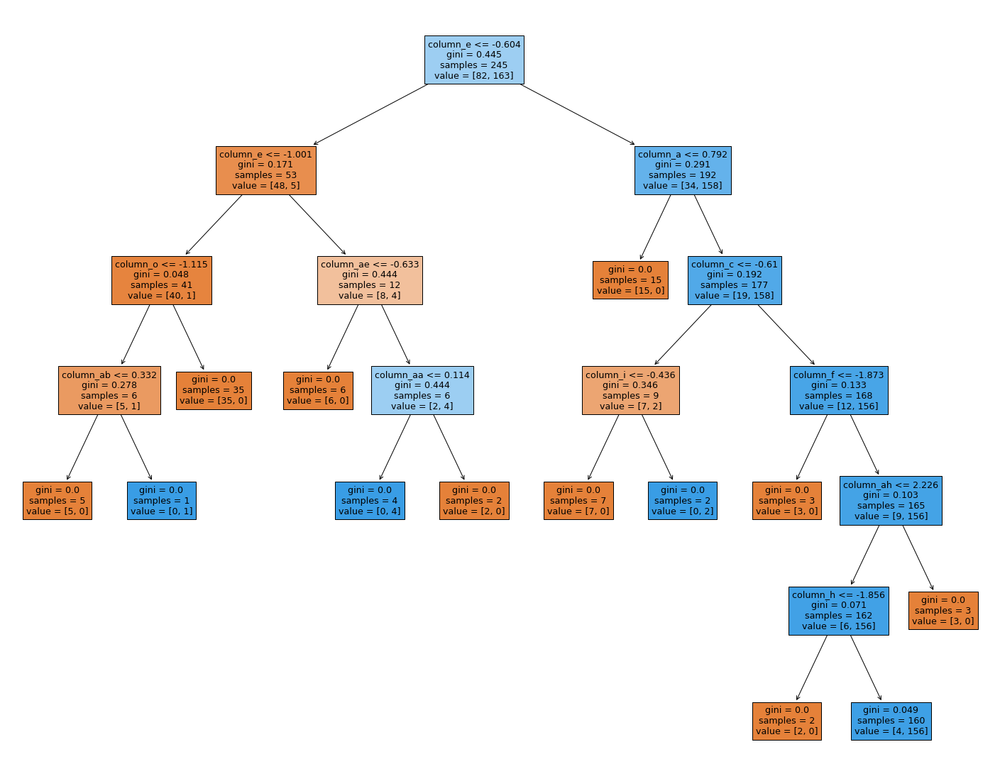

In [ ]:
regression_Tree(X_noised, y_train, X_valid, y_valid, X_test, y_test, 6)
regression_Tree(X_denoised, y_train, X_valid, y_valid, X_test, y_test, 6)